# Analysing Etv2 ChIP peaks
Original data: https://www.embopress.org/doi/full/10.15252/embr.201439939 </br>
New annotation: https://www.sciencedirect.com/science/article/pii/S2211124723006769#mmc5

In [1]:
here::i_am("rna_atac/Etv2_ChIP/Etv2_ChIP_analysis.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(ArchR))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(edgeR))


BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 16

addArchRThreads(24)

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code

Warning message:
“package ‘rtracklayer’ was built under R version 4.2.3”

                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | 

In [2]:
# Custom functions
footprint_manual = function(seFoot = NULL, name = NULL, pal = NULL, smoothWindow = NULL, 
    flank = NULL, flankNorm = 50, baseSize = 6, normMethod = "Subtract") 
{
    errorList <- list()
    rowDF <- SummarizedExperiment::rowData(seFoot)
    footMat <- ArchR:::.getAssay(seFoot[BiocGenerics::which(rowDF[, 2] == 
        "footprint"), ], name)
    biasMat <- ArchR:::.getAssay(seFoot[BiocGenerics::which(rowDF[, 2] == 
        "bias"), ], name)
    footDF <- rowDF[BiocGenerics::which(rowDF[, 2] == "footprint"), 
        ]
    biasDF <- rowDF[BiocGenerics::which(rowDF[, 2] == "bias"), 
        ]
    errorList$footMat <- footMat
    errorList$biasMat <- biasMat
    errorList$footDF <- footDF
    errorList$biasDF <- biasDF
    if (!is.null(smoothWindow)) {

        footMat <- apply(footMat, 2, function(x) ArchR:::.centerRollMean(x, 
            smoothWindow))
        biasMat <- apply(biasMat, 2, function(x) ArchR:::.centerRollMean(x, 
            smoothWindow))
    }
    idx <- which(abs(footDF$x) >= flank - flankNorm)
    footMat <- t(t(footMat)/colMeans(footMat[idx, , drop = FALSE]))
    biasMat <- t(t(biasMat)/colMeans(biasMat[idx, , drop = FALSE]))
    errorList$footMatNorm <- footMat
    errorList$biasMatNorm <- biasMat
    if (tolower(normMethod) == "none") {
        title <- ""
    }else if (tolower(normMethod) == "subtract") {
        title <- "Tn5 Bias Subtracted\n"
        footMat <- footMat - biasMat
    }else if (tolower(normMethod) == "divide") {
        title <- "Tn5 Bias Divided\n"
        footMat <- footMat/biasMat
    }else {
        stop("normMethod not recognized!")
    }
    footMatMean <- ArchR:::.groupMeans(footMat, SummarizedExperiment::colData(seFoot)$Group)
    footMatSd <- ArchR:::.groupSds(footMat, SummarizedExperiment::colData(seFoot)$Group)
    biasMatMean <- ArchR:::.groupMeans(biasMat, SummarizedExperiment::colData(seFoot)$Group)
    biasMatSd <- ArchR:::.groupSds(biasMat, SummarizedExperiment::colData(seFoot)$Group)
    smoothFoot <- rowMaxs(apply(footMatMean, 2, function(x) ArchR:::.centerRollMean(x, 
        11)))
    errorList$footMatMean <- footMatMean
    errorList$footMatSd <- footMatSd
    errorList$biasMatMean <- biasMatMean
    errorList$biasMatSd <- biasMatSd
    errorList$smoothFoot <- smoothFoot
    plotIdx <- seq_len(nrow(footMatMean))
    plotFootDF <- lapply(seq_len(ncol(footMatMean)), function(x) {
        data.frame(x = footDF$x, mean = footMatMean[, x], sd = footMatSd[, 
            x], group = colnames(footMatMean)[x])[plotIdx, , 
            drop = FALSE]
    }) %>% Reduce("rbind", .)
    plotFootDF$group <- factor(paste0(plotFootDF$group), levels = unique(gtools::mixedsort(paste0(plotFootDF$group))))
    plotBiasDF <- lapply(seq_len(ncol(biasMatMean)), function(x) {
        data.frame(x = biasDF$x, mean = biasMatMean[, x], sd = biasMatSd[, 
            x], group = colnames(biasMatMean)[x])[plotIdx, , 
            drop = FALSE]
    }) %>% Reduce("rbind", .)
    plotBiasDF$group <- factor(paste0(plotBiasDF$group), levels = unique(gtools::mixedsort(paste0(plotBiasDF$group))))
    errorList$plotFootDF <- plotFootDF
    errorList$plotBiasDF <- plotBiasDF
        if (is.null(pal)) {
            pal <- paletteDiscrete(values = gtools::mixedsort(SummarizedExperiment::colData(seFoot)$Group))
        }
        plotMax <- plotFootDF[order(plotFootDF$mean, decreasing = TRUE), 
            ]
        plotMax <- plotMax[abs(plotMax$x) > 20 & abs(plotMax$x) < 
            50, ]
        plotMax <- plotMax[!duplicated(plotMax$group), ]
        plotMax <- plotMax[seq_len(ceiling(nrow(plotMax)/4)), 
            ]
        plotMax$x <- 25
        ggFoot <- ggplot(plotFootDF, aes(x = x, y = mean, color = group)) + 
            geom_ribbon(aes(ymin = mean - sd, ymax = mean + sd, 
                linetype = NA, fill = group), alpha = 0.4) + 
            geom_line() + scale_color_manual(values = pal) + 
            scale_fill_manual(values = pal) + xlab("Distance to motif center (bp)") + 
            coord_cartesian(expand = FALSE, ylim = c(quantile(plotFootDF$mean, 
                1e-04), 1.15 * quantile(smoothFoot, 0.999)), 
                xlim = c(min(plotFootDF$x), max(plotFootDF$x))) + 
            theme_ArchR(baseSize = baseSize) + ggtitle(name) + 
            guides(fill = "none") + guides(color = "none") + 
            ylab(paste0(title, "Normalized Insertions"))
        # ggBias <- ggplot(plotBiasDF, aes(x = x, y = mean, color = group)) + 
        #     geom_ribbon(aes(ymin = mean - sd, ymax = mean + sd, 
        #         linetype = NA, fill = group), alpha = 0.4) + 
        #     geom_line() + scale_color_manual(values = pal) + 
        #     scale_fill_manual(values = pal) + xlab("Distance to motif center (bp)") + 
        #     coord_cartesian(expand = FALSE, ylim = c(quantile(plotBiasDF$mean, 
        #         1e-04), 1.05 * quantile(plotBiasDF$mean, 0.999)), 
        #         xlim = c(min(plotBiasDF$x), max(plotBiasDF$x))) + 
        #     theme_ArchR(baseSize = baseSize) + ylab("Tn5-Bias Normalized Insertions") + 
        #     theme(legend.position = "bottom", legend.box.background = element_rect(color = NA))
        # ggAlignPlots(ggFoot, ArchR:::.ggSmallLegend(ggBias), sizes = c(2, 
        #     1), draw = TRUE)
        
    return(ggFoot)
}

In [3]:
args = list()

# Metadata
args$metadata = file.path(io$basedir, 'results/rna_atac/clustering/metadata_celltype_annotated_v2.txt.gz')

# Archr
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')

# Load Differential analysis
args$accessibility = file.path(io$basedir, 'results/rna_atac/differential/v2/Accessibility/')
args$WT_trajectory = file.path(io$basedir, 'results/rna_atac/trajectory/v3')

# ChIP
args$Etv2 = file.path(io$basedir, 'code/rna_atac/Etv2_ChIP/Steimle_et_al_cell_reports_2023.csv')

# outdir
args$outdir = file.path(io$basedir, 'results/rna_atac/Etv2_ChIP/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

In [4]:
# Load meta
meta = fread(args$metadata)[day!='D3'] %>% # remove D3 cells
    .[,celltype_genotype:=paste0(celltype_v2, '-', genotype)]

# load ArchR
ArchRProject = suppressMessages(ArchR::loadArchRProject(io$archR.directory)[meta$cell])
summary(rownames(ArchRProject@cellColData) == meta$cell)

   Mode    TRUE 
logical   27135 

In [5]:
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$celltype_v2),
                                    cells = meta$cell,
                                    name = "celltype_v2",
                                    force=TRUE)

ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$genotype),
                                    cells = meta$cell,
                                    name = "genotype",
                                    force=TRUE)

ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$celltype_genotype),
                                    cells = meta$cell,
                                    name = "celltypev2_genotype",
                                    force=TRUE)

Overriding previous entry for genotype



#### Add group coverages

In [ ]:
# Add group coverages for CelltypeV2_genotype
#ArchRProject <- addGroupCoverages(ArchRProj = ArchRProject, groupBy = "celltypev2_genotype")

# Add group coverages
ArchRProject <- addGroupCoverages(ArchRProject, 
  groupBy = "celltypev2_genotype",
  useLabels = TRUE,  # Need to use sample information, otherwise only 50 cells get used per condition. (bug in ArchR)
  minCells = 50,
  maxCells = 5000,
  force = TRUE
)

In [25]:
saveRDS(ArchRProject@projectMetadata$GroupCoverages$celltypev2_genotype, '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupCoverages/celltypev2_genotype/GroupCoverages_metadata.rds')

In [6]:
ArchRProject@projectMetadata$GroupCoverages$celltypev2_genotype = readRDS('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupCoverages/celltypev2_genotype/GroupCoverages_metadata.rds')

### Etv2 search in differential peaks

In [62]:
# Load differential ATAC
args$accessibility = file.path(io$basedir, 'results/rna_atac/differential/v2/Accessibility/')

DARs = fread(sprintf('%s/DARs_edgeR_pb.txt.gz', args$accessibility)) %>% 
        .[,sig:=ifelse(abs(logFC)>0.5 & padj_fdr < 0.05, TRUE, FALSE)] %>% 
        .[sig == T] %>% .[, sig := NULL]

args$WT_trajectory = file.path(io$basedir, 'results/rna_atac/trajectory/v3')
peak_gene_correlation = fread(file.path(args$WT_trajectory, 'acc_gene_correlation.txt.gz'))

In [79]:
DARs2 = merge(peak_gene_correlation[,c('peak', 'gene', 'cor', 'padj', 'distance')], 
             DARs %>% copy() %>%  
                    .[!is.na(logFC)] %>% 
                    setnames(colnames(.)[2:7], paste0('ATAC_', colnames(.)[2:7])),
             by = c('peak'))

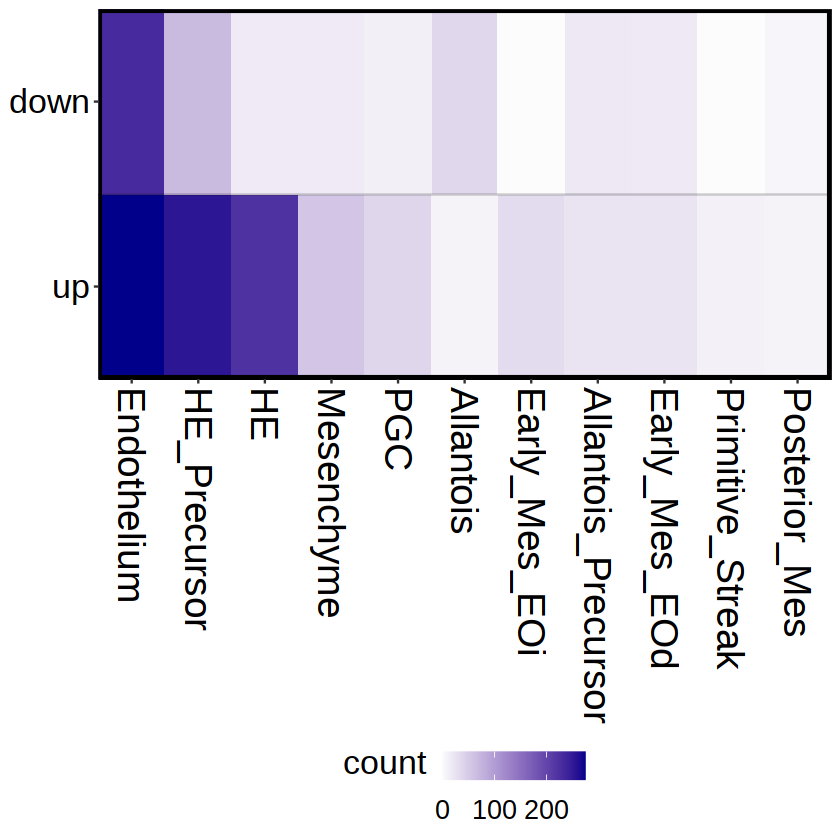

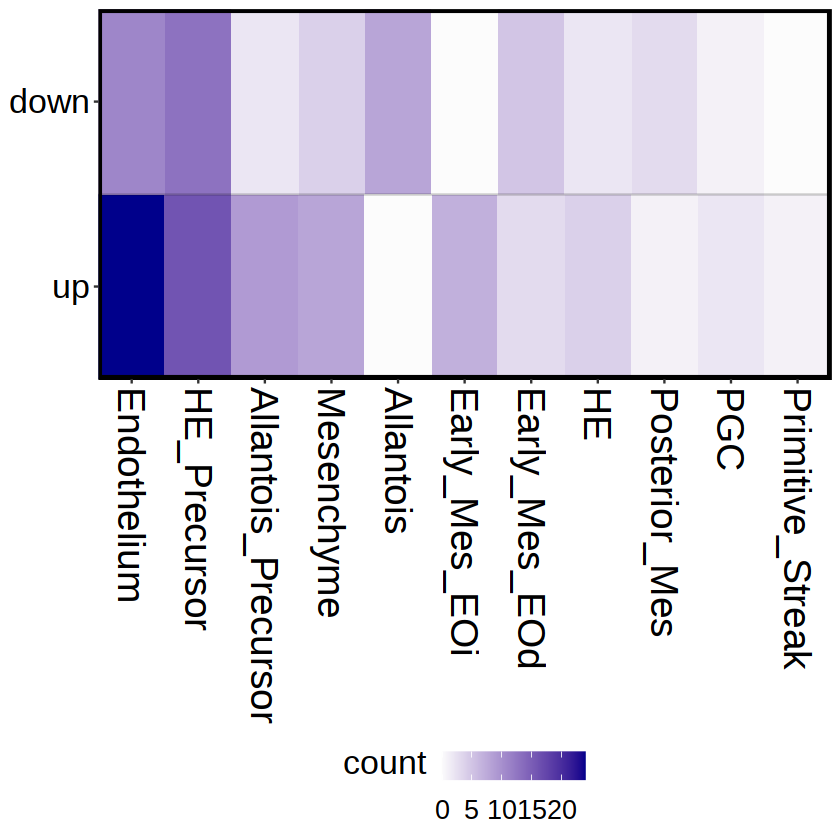

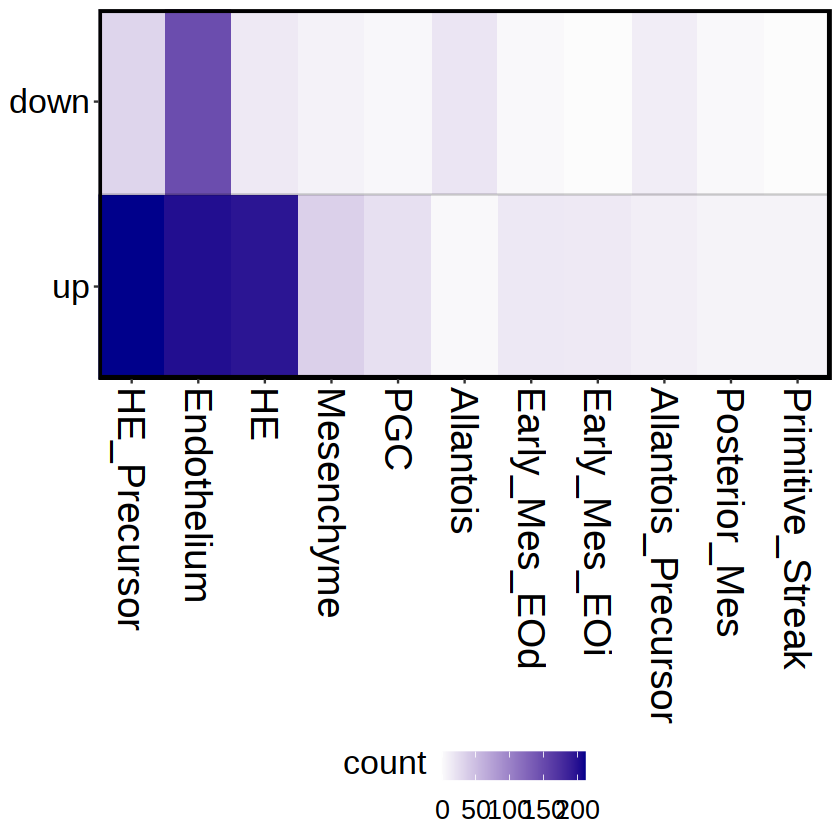

In [57]:
# Etv2 bound peaks

count_peaks = function(etv.gr){
    peakset.gr = ArchRProject@peakSet

    # Find overlap
    overlap = findOverlaps(peakset.gr, etv2.gr, minoverlap = 150)

    # Keep differnetial peaks
    Etv2_peaks = as.data.table(peakset.gr[queryHits(overlap)]) %>% 
        .[,peak := paste0(seqnames, ':', start, '-', end)] %>% 
        .$peak

    Etv2_enrichment = lapply(unique(DARs$celltype), function(x){
        tmp = data.table(celltype = x,
                         up = nrow(DARs[celltype == x & peak %in% Etv2_peaks & logFC > 0]),
                         down = nrow(DARs[celltype == x & peak %in% Etv2_peaks & logFC < 0])
                        )    
    }) %>% rbindlist() %>% 
        melt(id.vars = 'celltype', variable.name = 'direction', value.name = 'count') %>% 
        .[order(-count)] %>% 
        .[,celltype := factor(celltype, levels = unique(celltype))]

    ggplot(Etv2_enrichment, aes(celltype, direction, fill = count)) + 
        geom_tile() + 
        scale_fill_gradient(low = 'grey99', high = 'darkblue') + 
        scale_y_discrete(expand = c(0, 0)) + 
        scale_x_discrete(expand = c(0, 0)) + 
        geom_hline(yintercept=seq(.5, 20, 1), alpha=0.2) + 
        geom_hline(yintercept=c(6.5, 7.5), alpha=1) + 
        theme_bw() + 
        theme(text=element_text(size=20), 
             axis.text = element_text(color='black'),
             axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=23), 
             axis.text.y= element_text(hjust=1, size = 20), # element_blank(), #
             axis.title = element_blank(),
             panel.border = element_rect(color='black', linewidth=1.5, fill = NA),
             panel.background = element_blank(),
             plot.title = element_text(size=25, face='plain', hjust=0.5),
             axis.line = element_blank(),
             legend.title = element_text(hjust=0, vjust = 1),
             legend.text = element_text(hjust=0.5, vjust = 0.5),
             legend.position = 'bottom')
}

etv2.gr = makeGRangesFromDataFrame(etv2[etv2$etv2_peak == 1])
count_peaks()

etv2.gr = makeGRangesFromDataFrame(etv2[etv2$etv2_site_class == 'first_wave_etv2_site'])
count_peaks()

etv2.gr = makeGRangesFromDataFrame(etv2[etv2$etv2_site_class == 'second_wave_etv2_site'])
count_peaks()

In [80]:
etv2.gr = makeGRangesFromDataFrame(etv2[etv2$etv2_peak == 1])
peakset.gr = ArchRProject@peakSet

# Find overlap
overlap = findOverlaps(peakset.gr, etv2.gr, minoverlap = 150)

# Keep differnetial peaks
Etv2_peaks = as.data.table(peakset.gr[queryHits(overlap)]) %>% 
    .[,peak := paste0(seqnames, ':', start, '-', end)] %>% .$peak
tmp = DARs2[peak %in% Etv2_peaks]

In [91]:
tmp[celltype == 'Allantois'][order(-ATAC_logFC)][padj < 0.05] %>% .$gene %>% unique()

[1] "Fsd1"          "Stap2"         "Sh3gl1"        "Tead1"        
 [5] "Lrrc18"        "Prkch"         "Zfp109"        "Eml6"         
 [9] "Sptbn1"        "Ccr4"          "Mvb12b"        "Nron"         
[13] "C230014O12Rik" "Synj2"         "Tmem181a"      "Mcfd2"        
[17] "Calm2"         "Camkv"         "Uba7"          "Inka1"        
[21] "Rnf123"        "Amigo3"        "Apeh"          "Tmem131"      
[25] "Smagp"         "Cela1"         "I730030J21Rik" "Alg11"        
[29] "Thsd1"         "Rps6kb1"       "Vwf"           "Tmem255b"     
[33] "Gas6"          "1700029H14Rik" "Rasa3"         "Fli1"         
[37] "Selenov"       "Dll3"          "Zfp36"         "Samd4b"       
[41] "Psenen"        "Etv2"          "Rbm42"         "Tmem147"      
[45] "Ciao2a"        "Herc1"         "Polr2m"        "Myzap"        
[49] "Cgnl1"         "Nrp2"          "Macf1"         "Dnajb6"       
[53] "Cyp4b1"        "Efcab14"       "4933417E11Rik" "Kcnh6"        
[57] "Map3k3"        "Limd2"         "D230025D16Rik" "Tmem208"      
[61] "Fhod1"         "Polk"          "Stmn2"         "Hey1"         
[65] "Cog5"          "Prkar2b"       "Xkr6"          "Sox7"         
[69] "4930578I06Rik" "Rp1l1"         "Nfkb2"         "Fbxl15"       
[73] "Actr1a"        "Trim8"         "Wbp1l"         "Smad6"        
[77] "Zwilch"        "Snapc5"

In [93]:
tmp[celltype == 'Endothelium'][order(-ATAC_logFC)][padj < 0.05] %>% head(10)#%>% .$gene %>% unique()

peak,gene,cor,padj,distance,ATAC_logFC,ATAC_padj_fdr,ATAC_mean_groupA,ATAC_mean_groupB,ATAC_cdr_groupA,ATAC_cdr_groupB,celltype
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
chr8:22780548-22781148,Ikbkb,0.592,3.122868e-02,74265,3.283,5.50e-14,0.52,2.85,0.01,0.17,Endothelium
chr17:67566142-67566742,Lama1,0.587,3.358268e-02,130823,2.179,1.02e-08,1.02,2.56,0.03,0.16,Endothelium
chr1:155118947-155119547,Gm9530,0.567,4.292529e-02,35983,1.506,6.19e-07,1.60,2.84,0.04,0.20,Endothelium
chr1:155118947-155119547,Ier5,0.778,9.252580e-04,19611,1.506,6.19e-07,1.60,2.84,0.04,0.20,Endothelium
chr2:91196295-91196895,1110051M20Rik,-0.555,4.935199e-02,76645,1.416,5.52e-07,1.74,2.94,0.03,0.21,Endothelium
chr5:93150944-93151544,Sowahb,0.582,3.591921e-02,106222,1.408,2.33e-06,1.61,2.80,0.05,0.20,Endothelium
chr5:93150944-93151544,Sept11,0.877,2.155942e-05,0,1.408,2.33e-06,1.61,2.80,0.05,0.20,Endothelium
chr2:93097613-93098213,Tspan18,0.721,3.631716e-03,103847,1.337,1.74e-07,1.87,3.27,0.04,0.20,Endothelium
chr17:8271288-8271888,Rnaset2a,0.590,3.245206e-02,123800,1.265,4.12e-07,2.08,3.18,0.06,0.23,Endothelium


#### Etv2 ChIP footprinting

In [7]:
etv2 = fread(args$Etv2)

In [8]:
etv2.gr = GRangesList(makeGRangesFromDataFrame(etv2[etv2$etv2_site_class == 'first_wave_etv2_site']))
names(etv2.gr) = 'Etv2'

seFoot_etv2_first <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = etv2.gr, 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)

etv2.gr = GRangesList(makeGRangesFromDataFrame(etv2[etv2$etv2_site_class == 'second_wave_etv2_site']))
names(etv2.gr) = 'Etv2'

seFoot_etv2_second <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = etv2.gr, 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)

ArchR logging to : ArchRLogs/ArchR-getFootprints-514954cf5564-Date-2024-05-23_Time-10-03-45.log
If there is an issue, please report to github with logFile!

2024-05-23 10:04:00 : Computing Kmer Bias Table, 0.259 mins elapsed.

2024-05-23 10:04:04 : Finished Computing Kmer Tables, 0.066 mins elapsed.

2024-05-23 10:04:04 : Computing Footprints, 0.326 mins elapsed.

2024-05-23 10:04:38 : Computing Footprints Bias, 0.889 mins elapsed.

2024-05-23 10:04:46 : Summarizing Footprints, 1.027 mins elapsed.

ArchR logging to : ArchRLogs/ArchR-getFootprints-51492ee789ab-Date-2024-05-23_Time-10-04-48.log
If there is an issue, please report to github with logFile!

2024-05-23 10:04:48 : Computing Kmer Bias Table, 0.005 mins elapsed.

2024-05-23 10:04:59 : Finished Computing Kmer Tables, 0.185 mins elapsed.

2024-05-23 10:04:59 : Computing Footprints, 0.19 mins elapsed.



In [ ]:
unique(meta$celltype_v2)

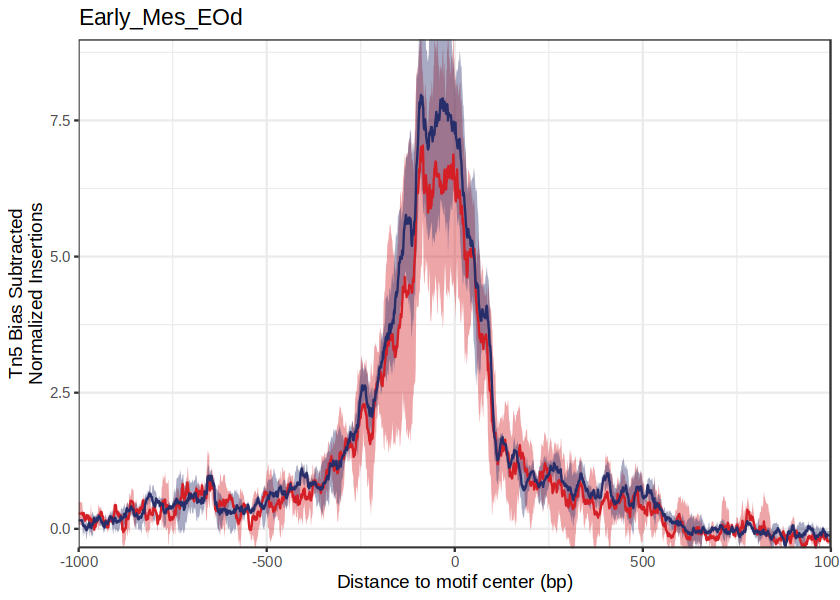

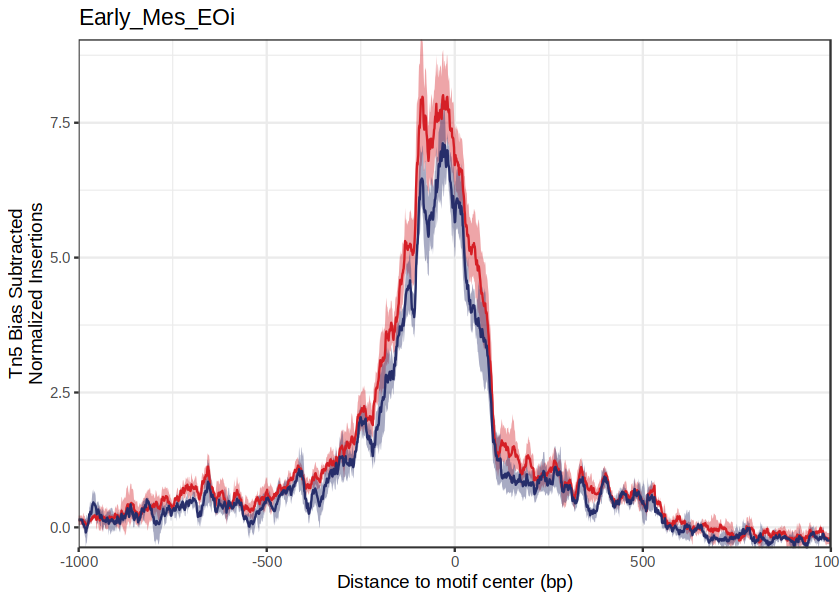

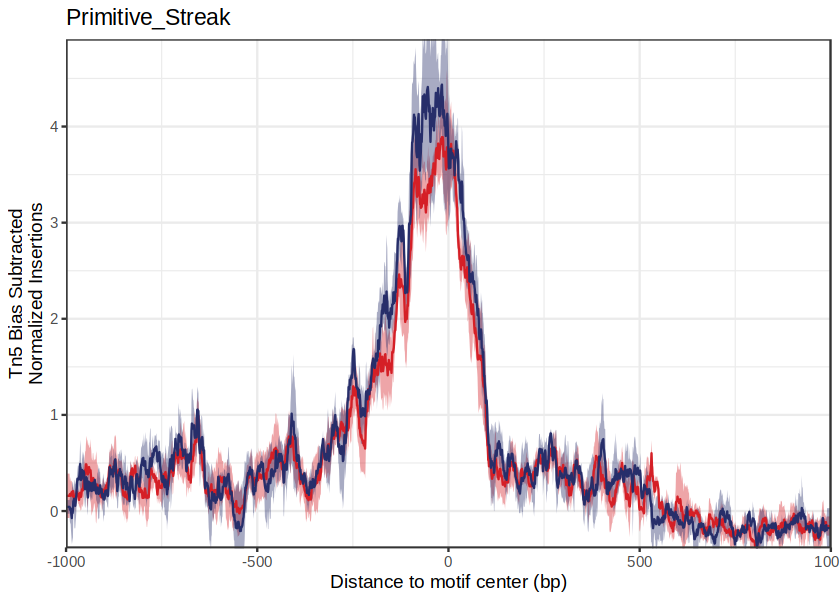

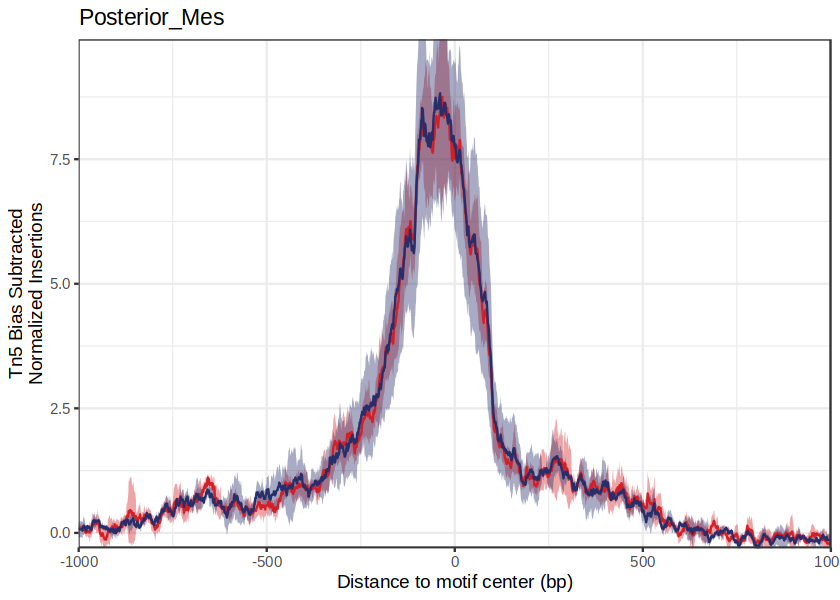

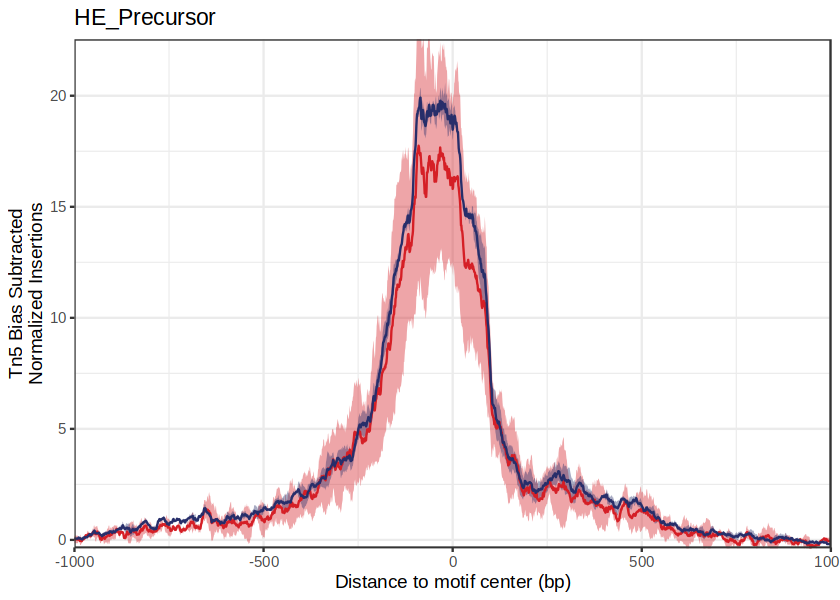

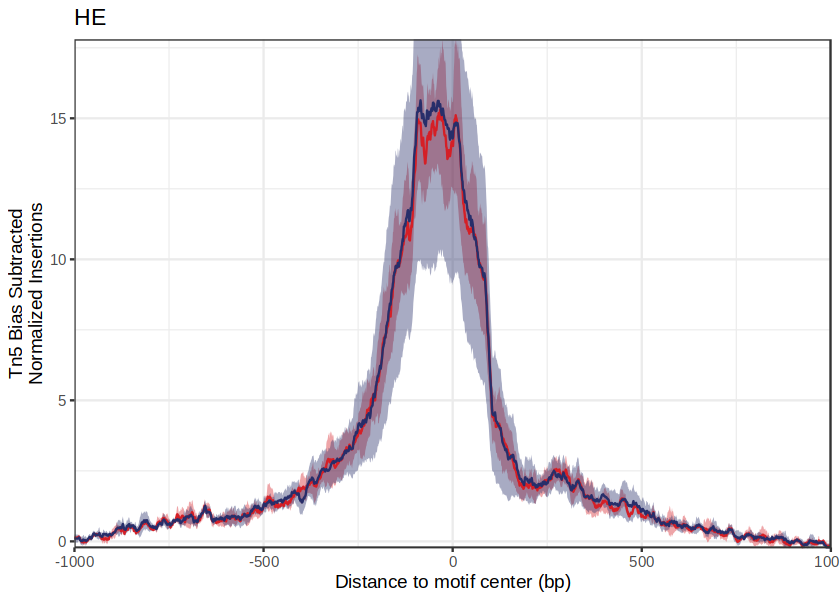

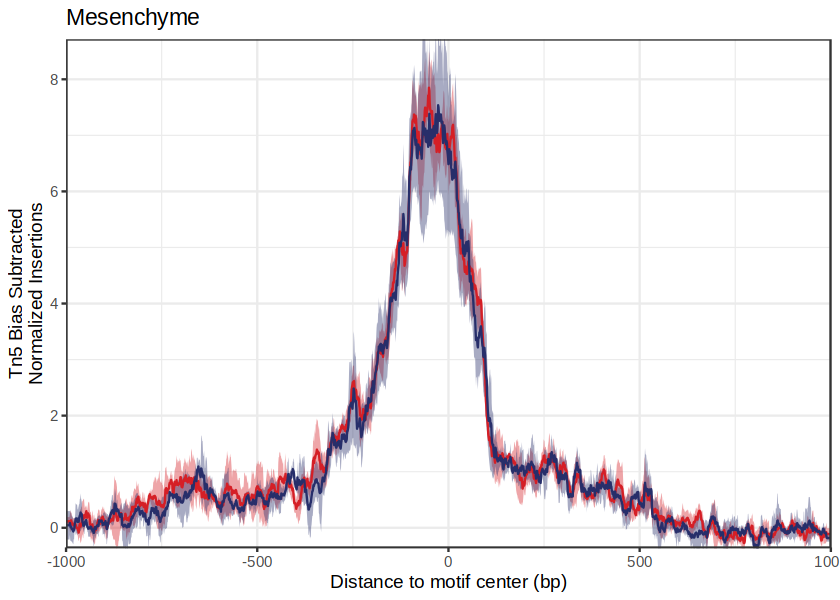

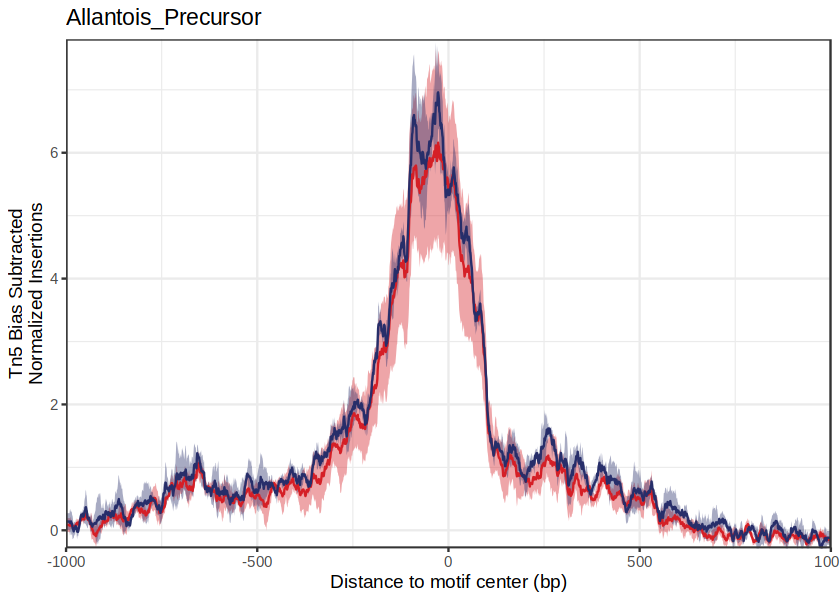

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


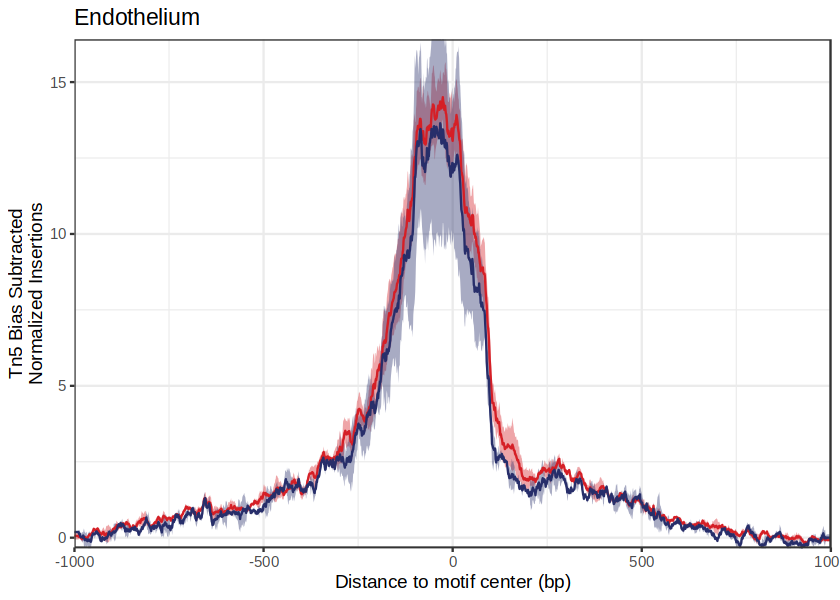

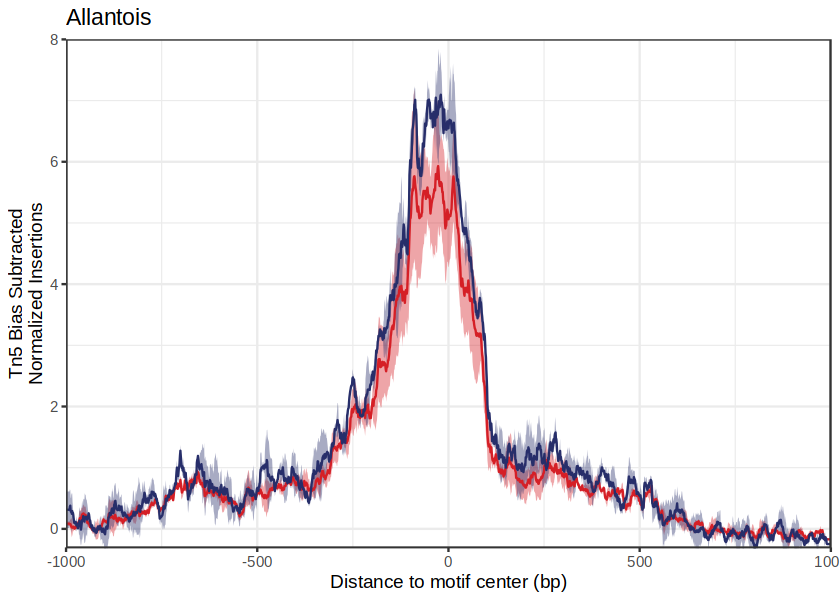

In [347]:

celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_first[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_first)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_first))
                             )],
      normMethod = "subtract",
      name = 'Etv2',
      flank = 1000,
      smoothWindow = 20) + 
    ggtitle(i) + theme_bw()
})

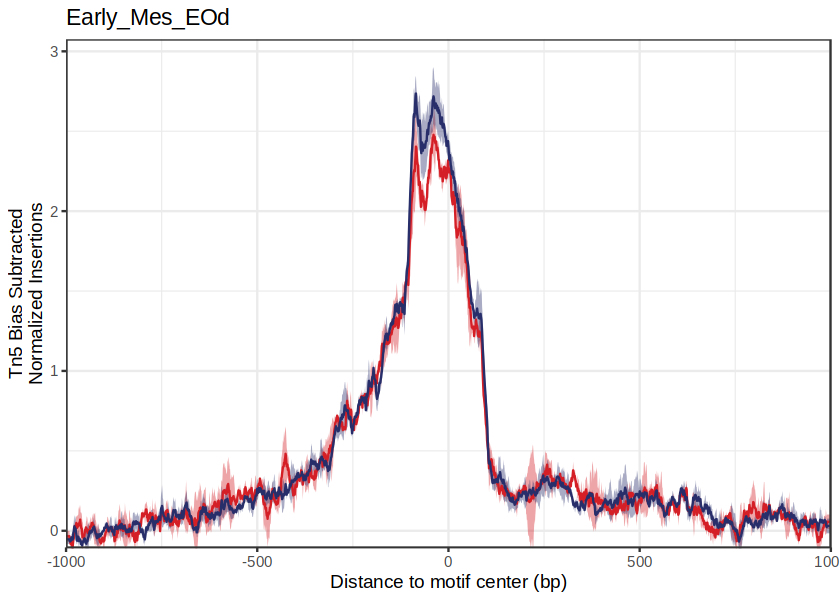

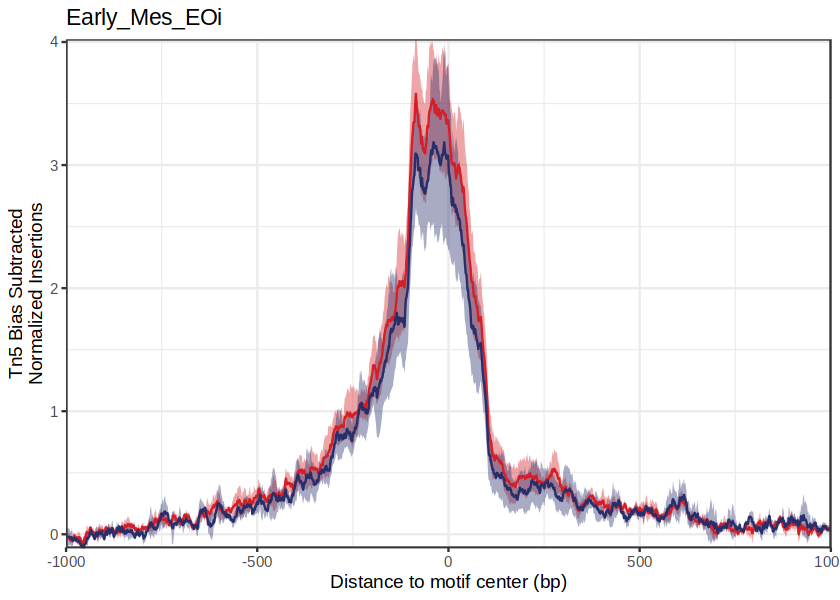

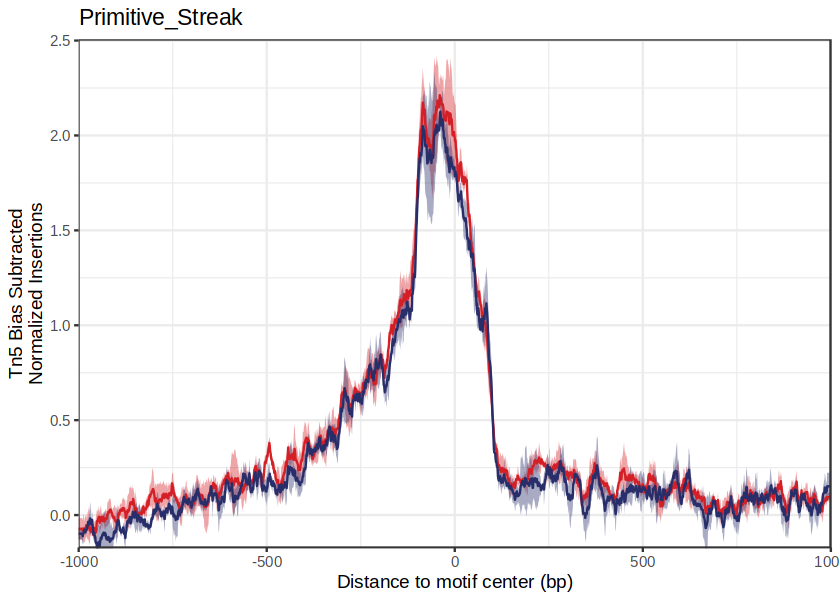

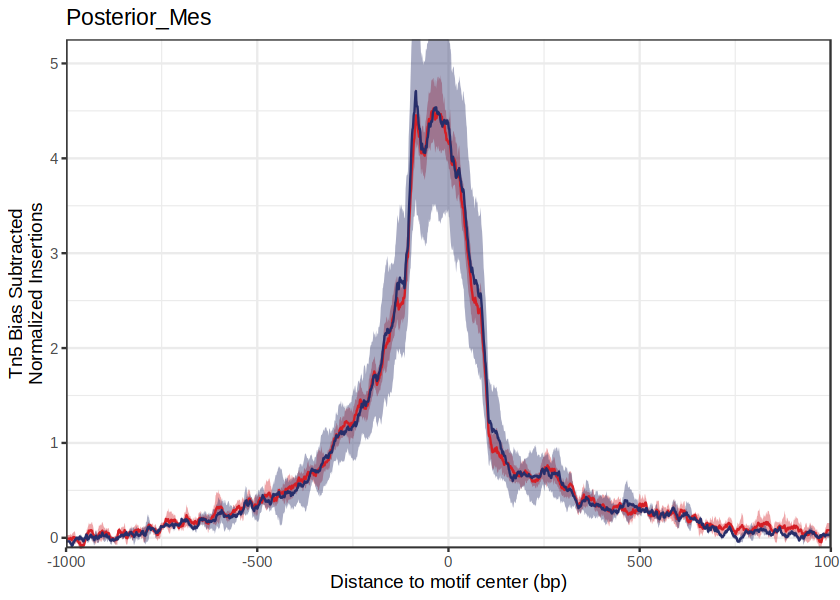

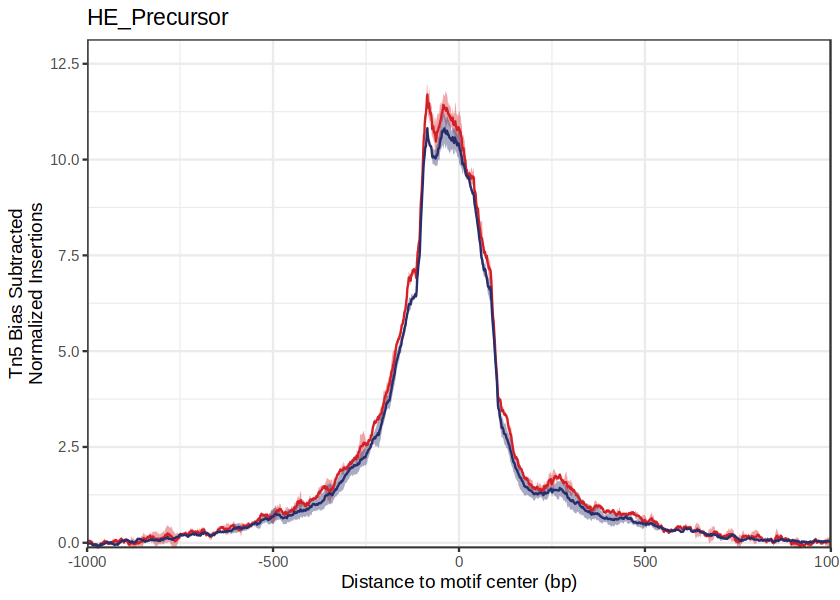

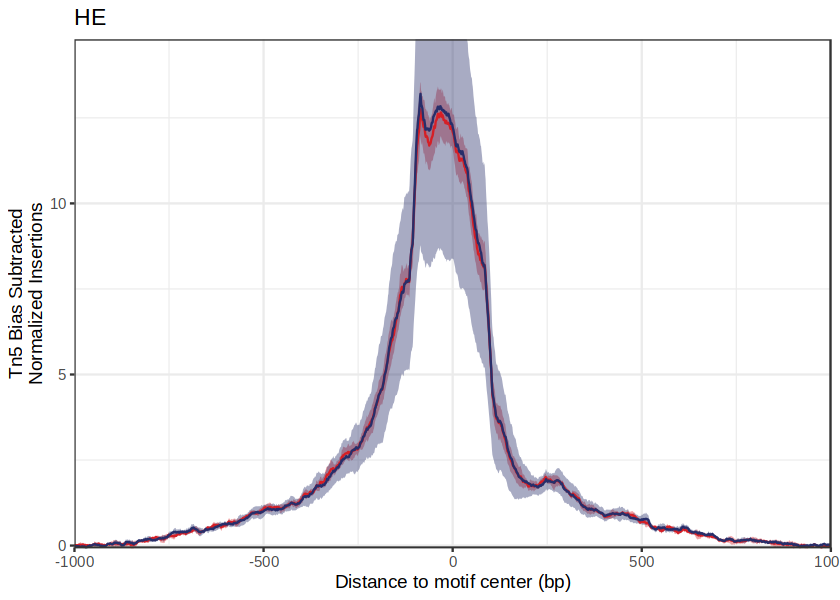

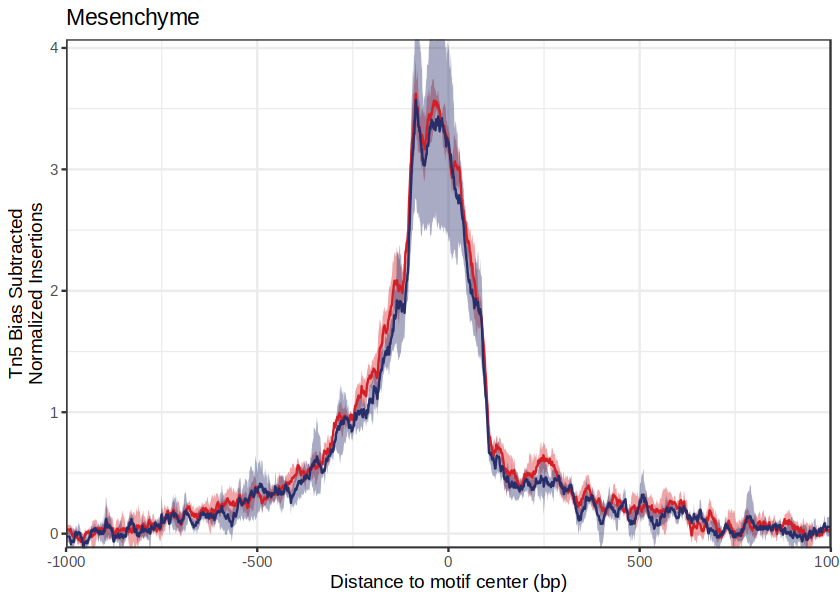

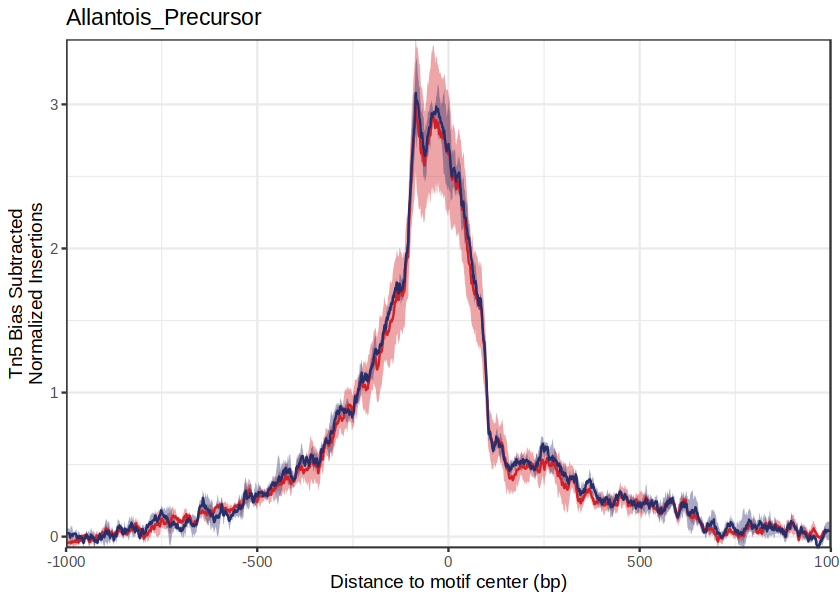

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


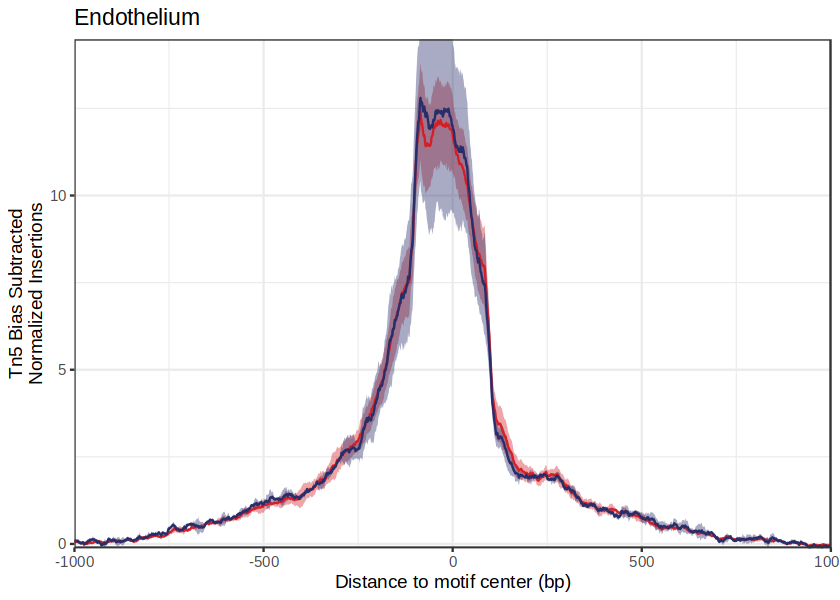

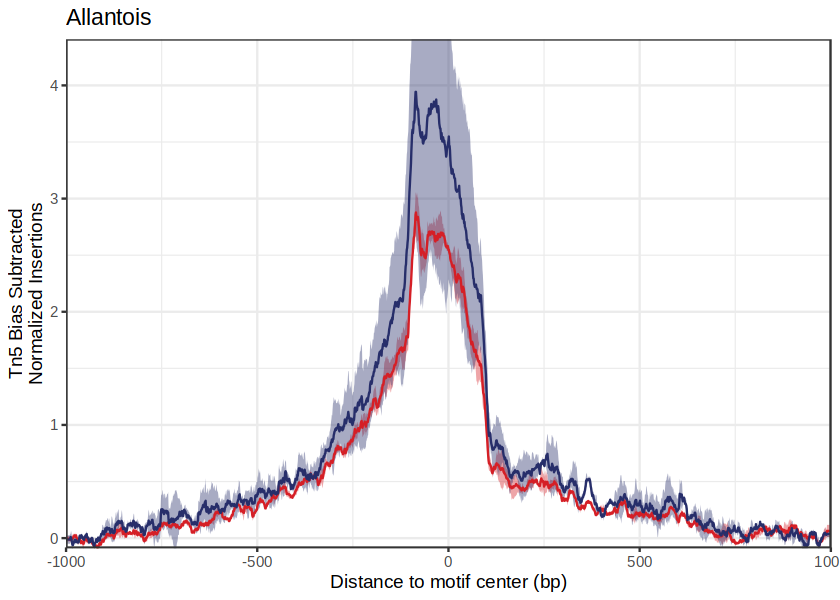

In [349]:

celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_second[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_second)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_second))
                             )],
      normMethod = "subtract",
      name = 'Etv2',
      flank = 1000,
      smoothWindow = 20) + 
    ggtitle(i) + theme_bw()
})

ArchR logging to : ArchRLogs/ArchR-getFootprints-3c86392d8750ff-Date-2024-05-16_Time-17-19-53.log
If there is an issue, please report to github with logFile!

2024-05-16 17:19:53 : Computing Kmer Bias Table, 0.005 mins elapsed.

2024-05-16 17:19:54 : Finished Computing Kmer Tables, 0.015 mins elapsed.

2024-05-16 17:19:54 : Computing Footprints, 0.021 mins elapsed.

2024-05-16 17:20:06 : Computing Footprints Bias, 0.217 mins elapsed.

2024-05-16 17:20:12 : Summarizing Footprints, 0.323 mins elapsed.



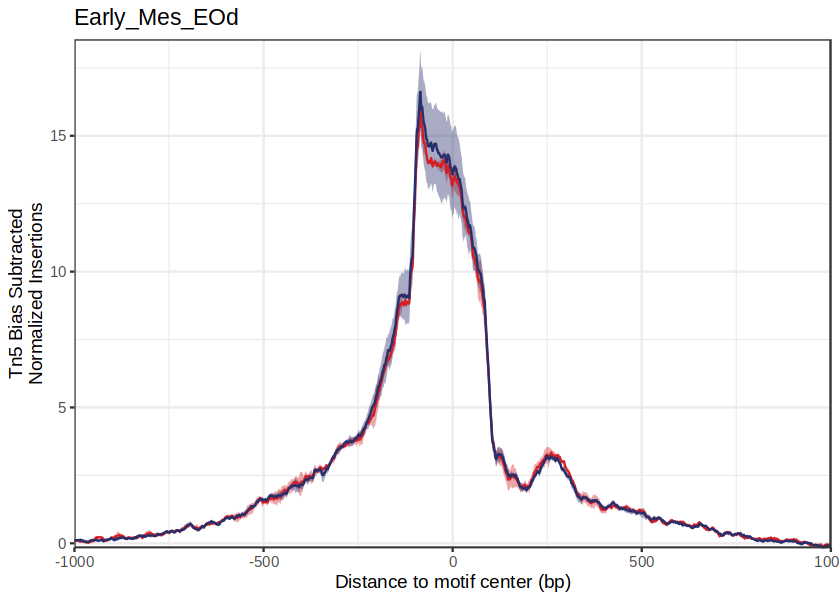

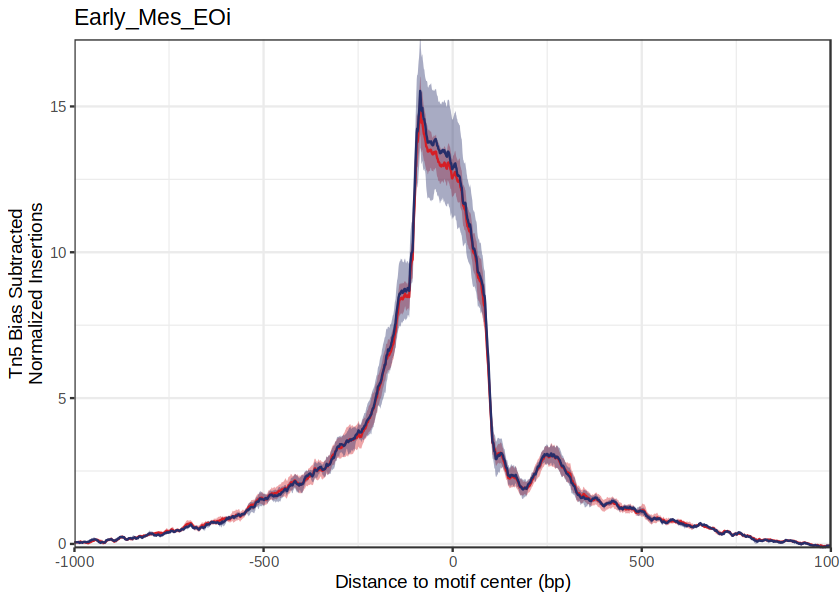

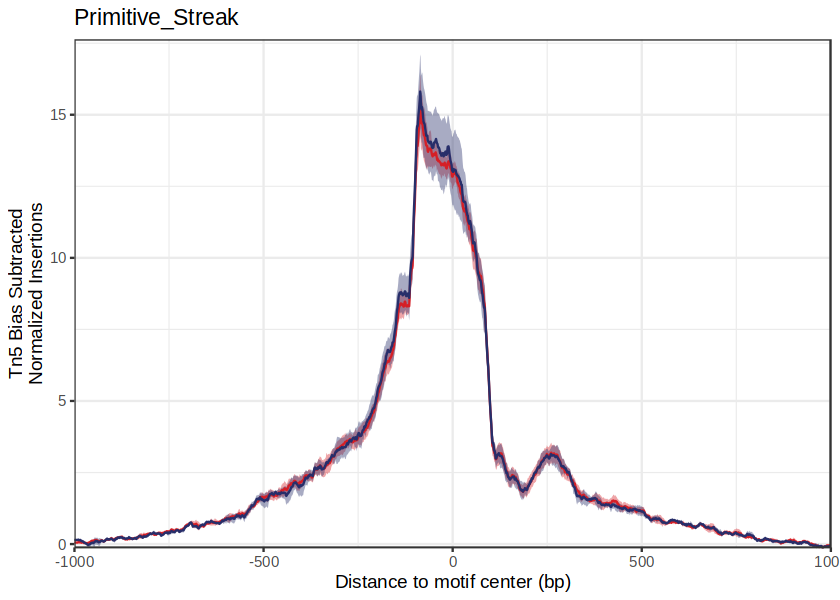

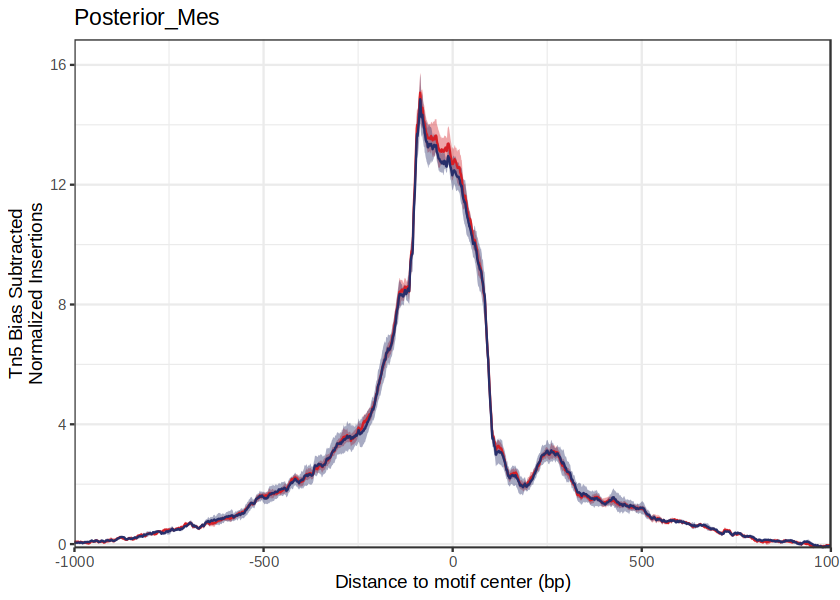

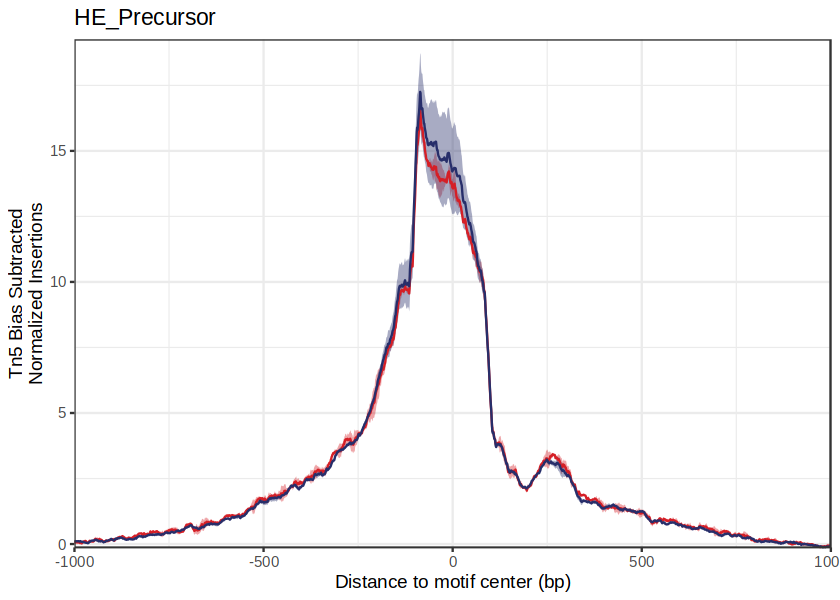

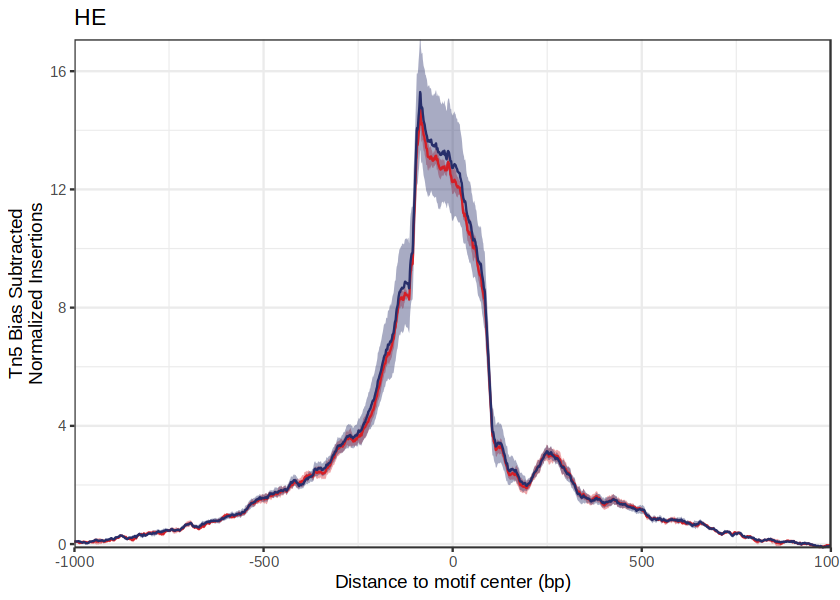

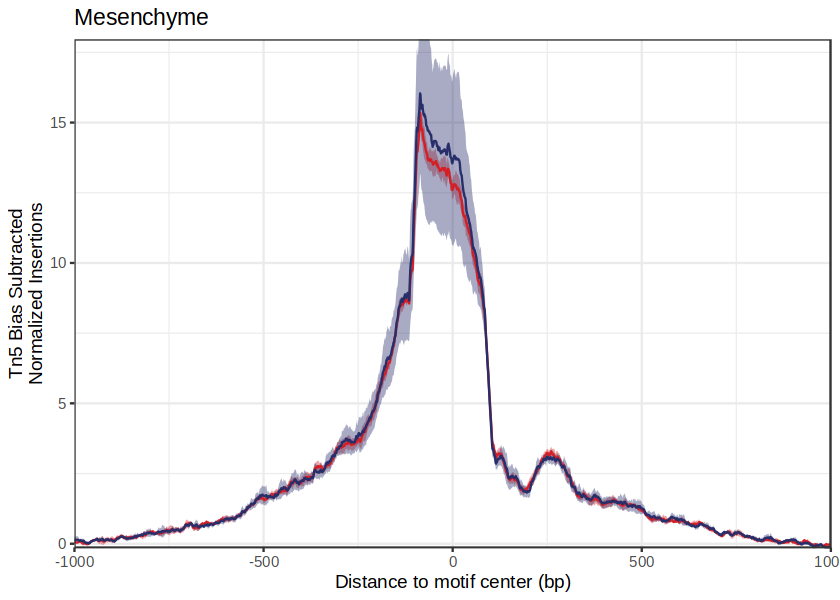

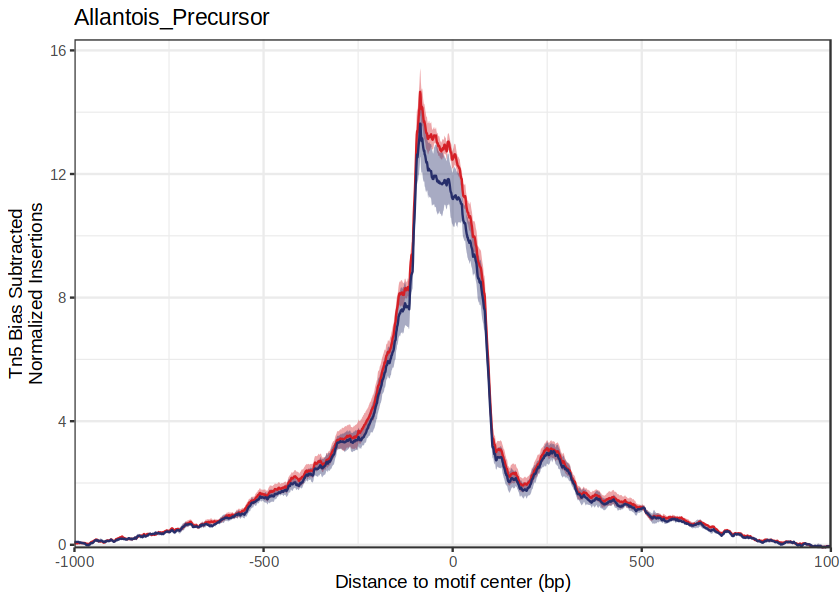

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


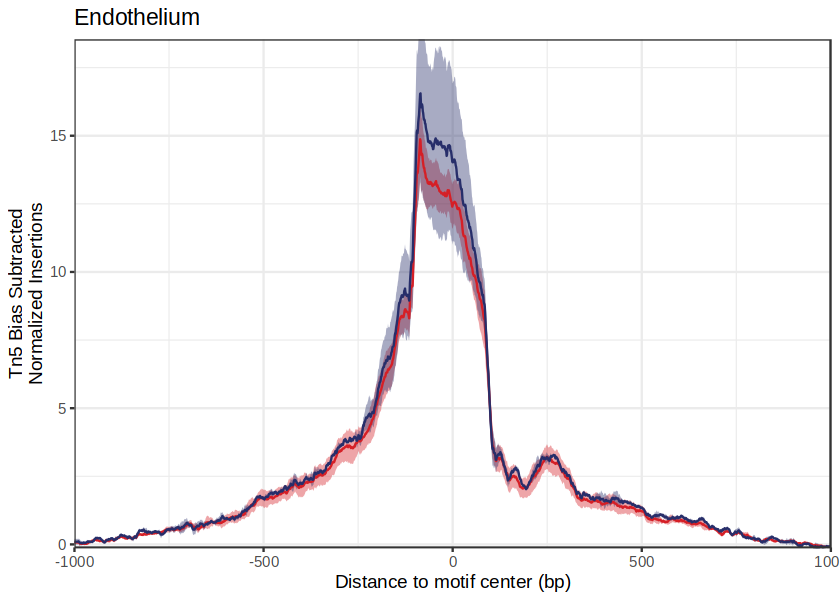

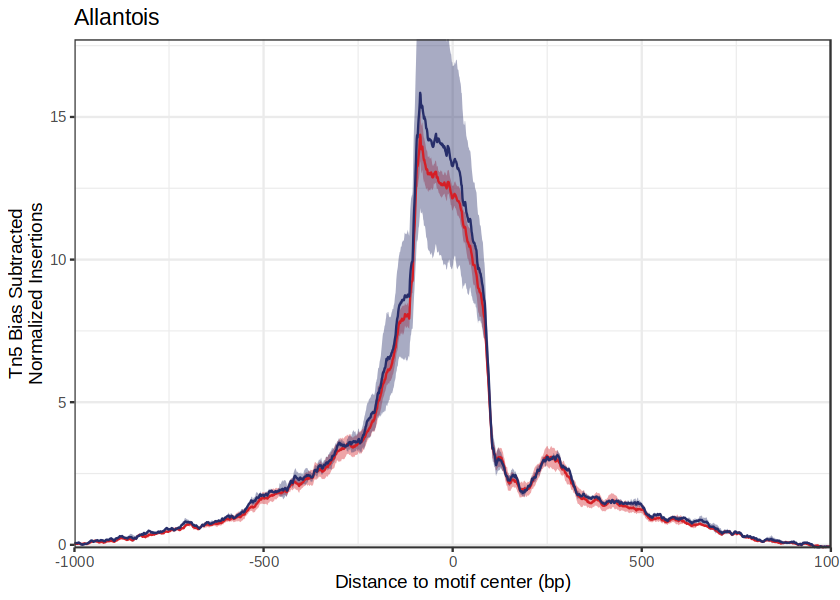

In [350]:
etv2.gr = GRangesList(makeGRangesFromDataFrame(etv2[is.na(etv2_site_class) & etv2_peak == 1]))
names(etv2.gr) = 'Etv2'

seFoot_etv2_na <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = etv2.gr, 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)


celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_na[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_na)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_na))
                             )],
      normMethod = "subtract",
      name = 'Etv2',
      flank = 1000,
      smoothWindow = 20) + 
    ggtitle(i) + theme_bw()
})

ArchR logging to : ArchRLogs/ArchR-getFootprints-3c863915fe26cc-Date-2024-05-16_Time-17-23-00.log
If there is an issue, please report to github with logFile!

2024-05-16 17:23:00 : Computing Kmer Bias Table, 0.006 mins elapsed.

2024-05-16 17:23:01 : Finished Computing Kmer Tables, 0.011 mins elapsed.

2024-05-16 17:23:01 : Computing Footprints, 0.017 mins elapsed.

2024-05-16 17:23:13 : Computing Footprints Bias, 0.216 mins elapsed.

2024-05-16 17:23:19 : Summarizing Footprints, 0.322 mins elapsed.



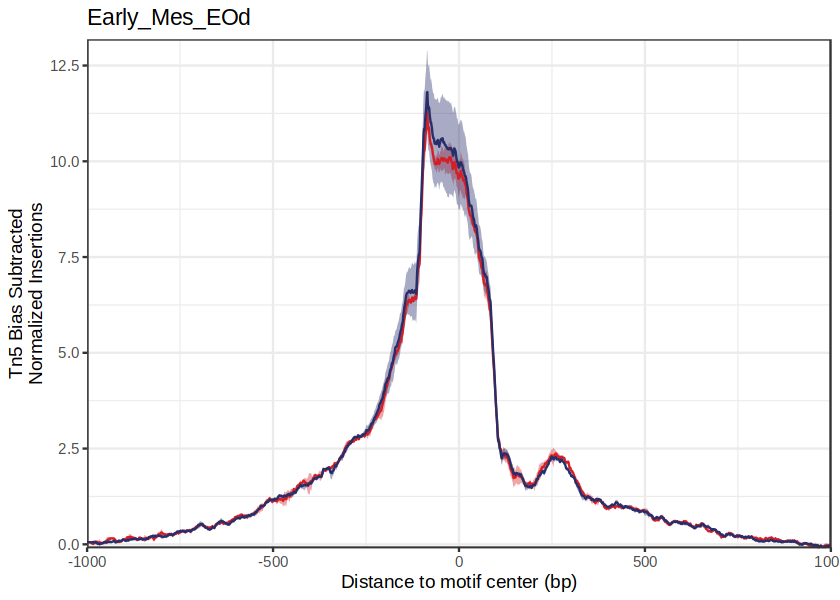

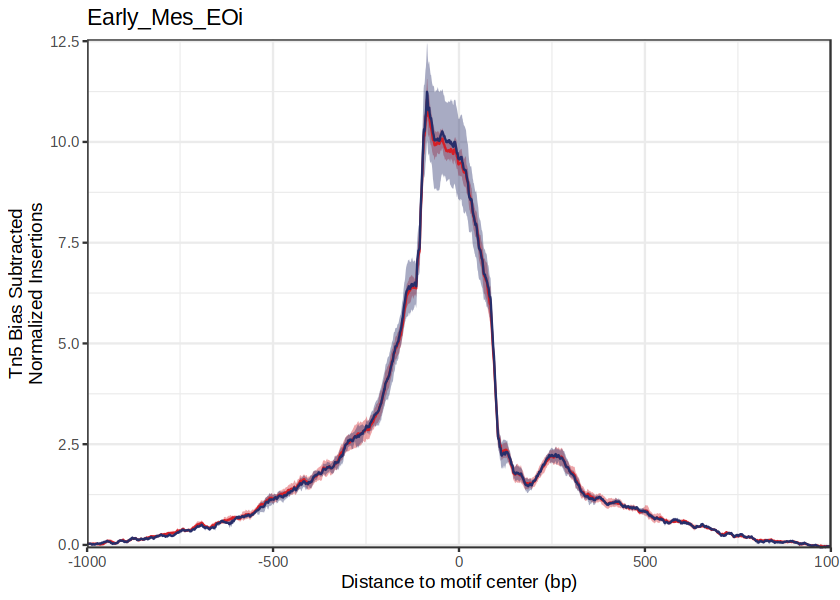

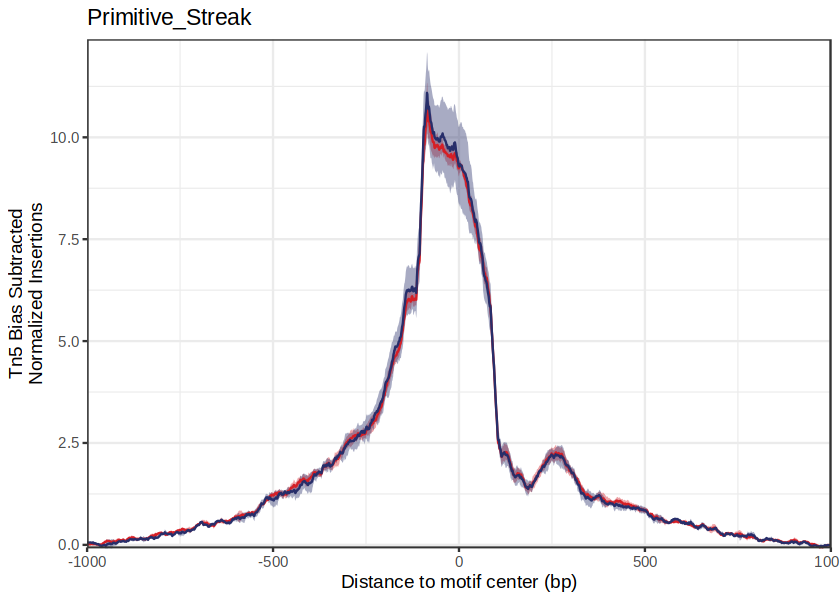

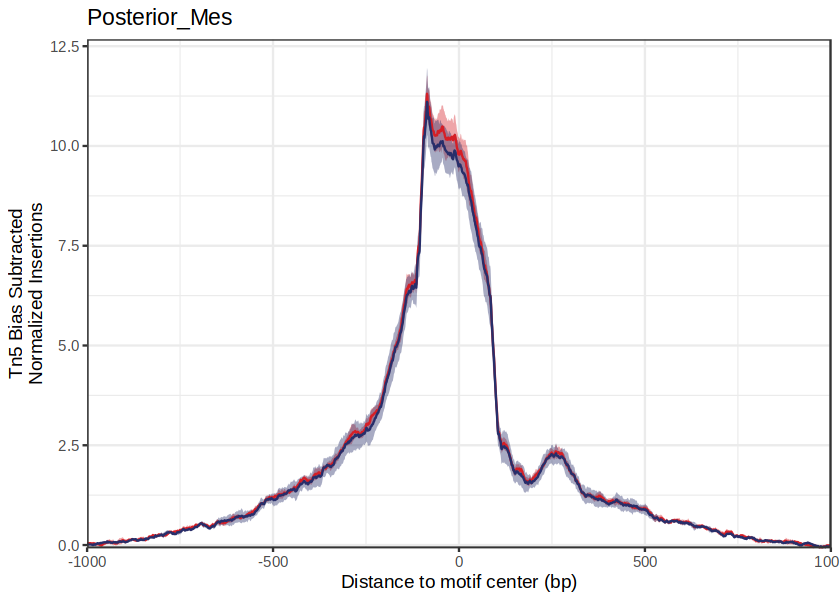

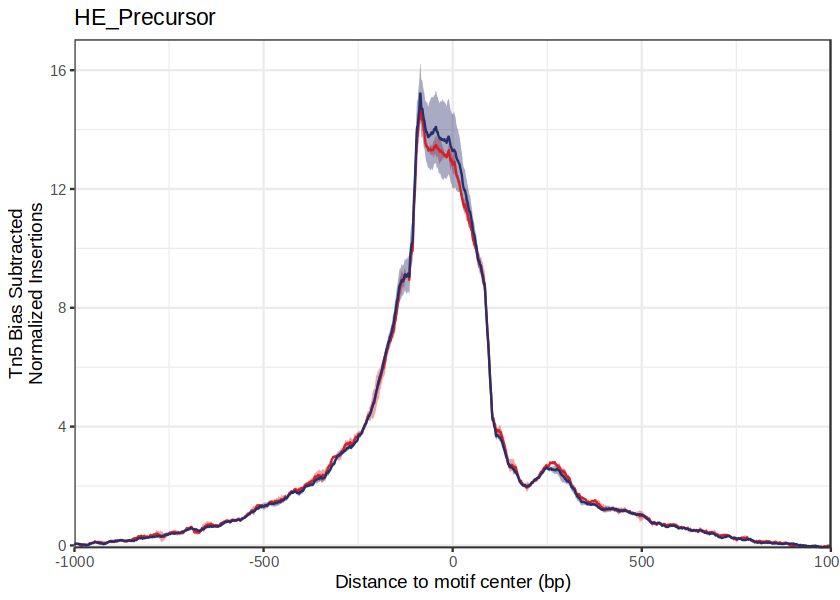

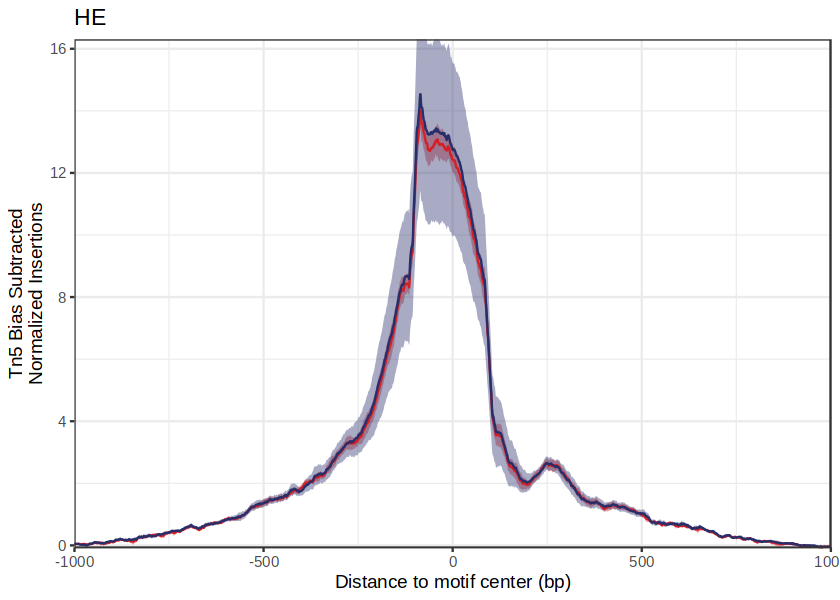

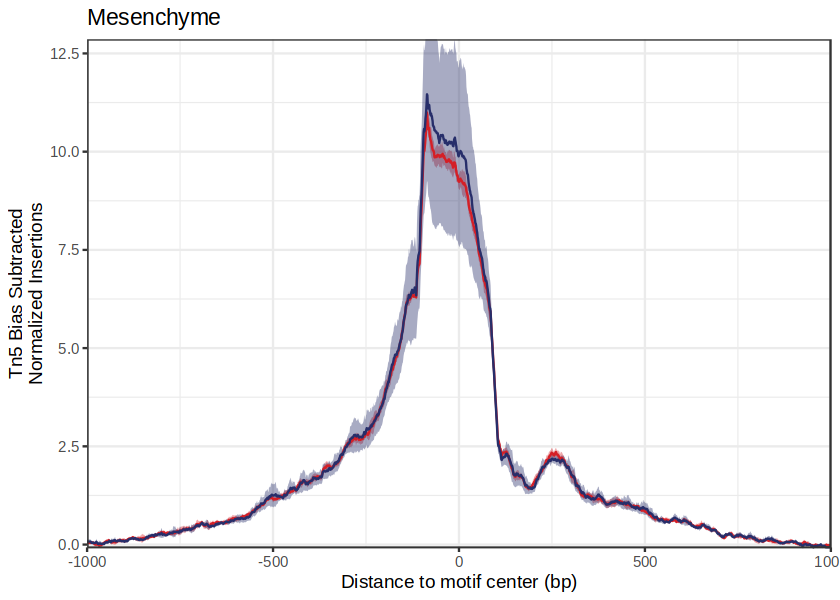

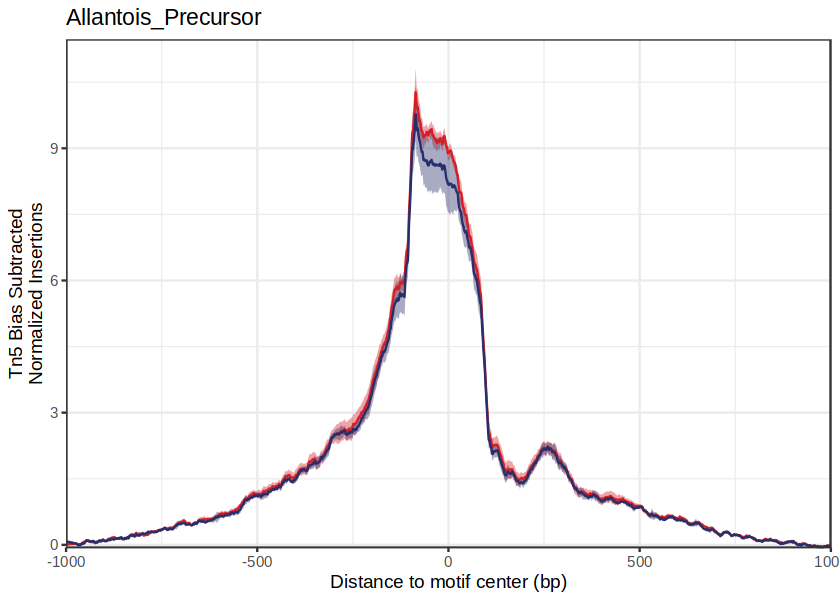

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


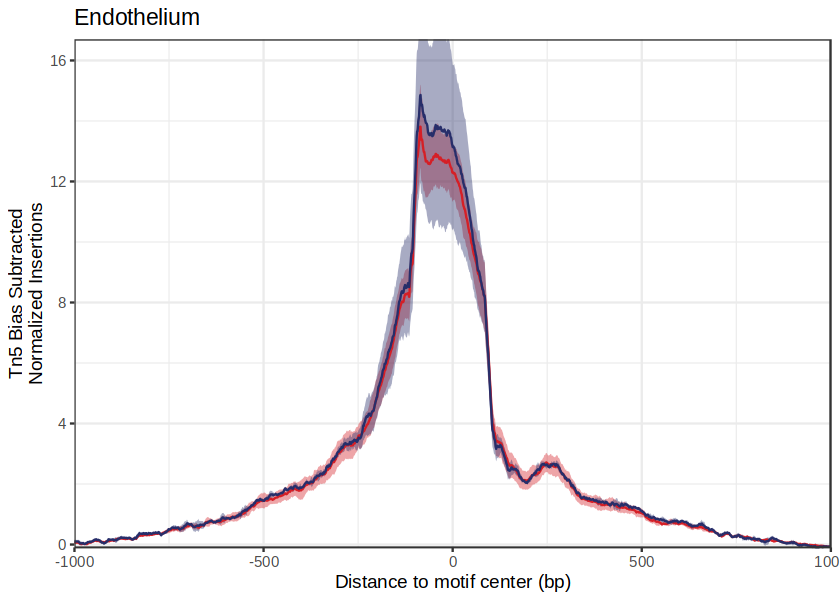

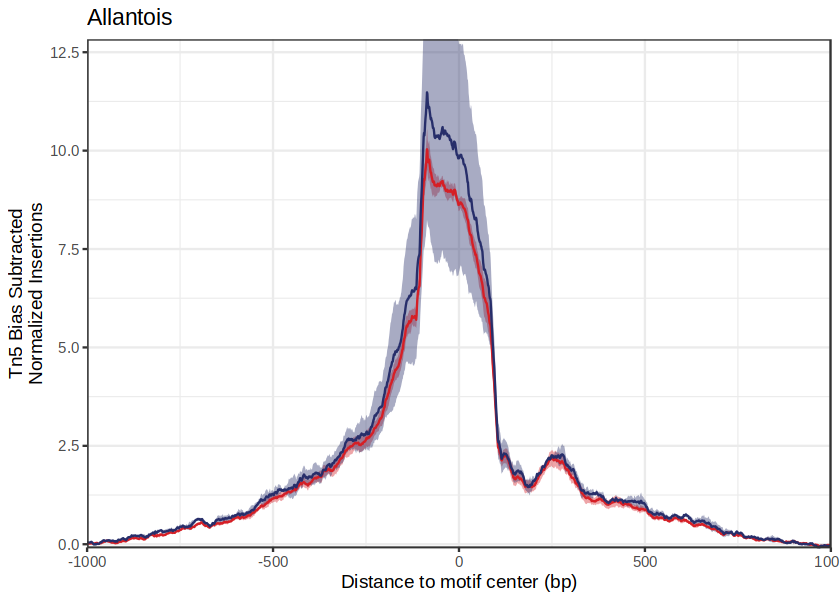

In [351]:
etv2.gr = GRangesList(makeGRangesFromDataFrame(etv2[etv2_peak == 1]))
names(etv2.gr) = 'Etv2'

seFoot_etv2_na <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = etv2.gr, 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)


celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_na[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_na)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_na))
                             )],
      normMethod = "subtract",
      name = 'Etv2',
      flank = 1000,
      smoothWindow = 20) + 
    ggtitle(i) + theme_bw()
})

ArchR logging to : ArchRLogs/ArchR-getFootprints-3c86394687f7f3-Date-2024-05-16_Time-17-30-33.log
If there is an issue, please report to github with logFile!

2024-05-16 17:30:33 : Computing Kmer Bias Table, 0.003 mins elapsed.

2024-05-16 17:30:39 : Finished Computing Kmer Tables, 0.104 mins elapsed.

2024-05-16 17:30:39 : Computing Footprints, 0.107 mins elapsed.

2024-05-16 17:30:52 : Computing Footprints Bias, 0.314 mins elapsed.

2024-05-16 17:30:58 : Summarizing Footprints, 0.422 mins elapsed.



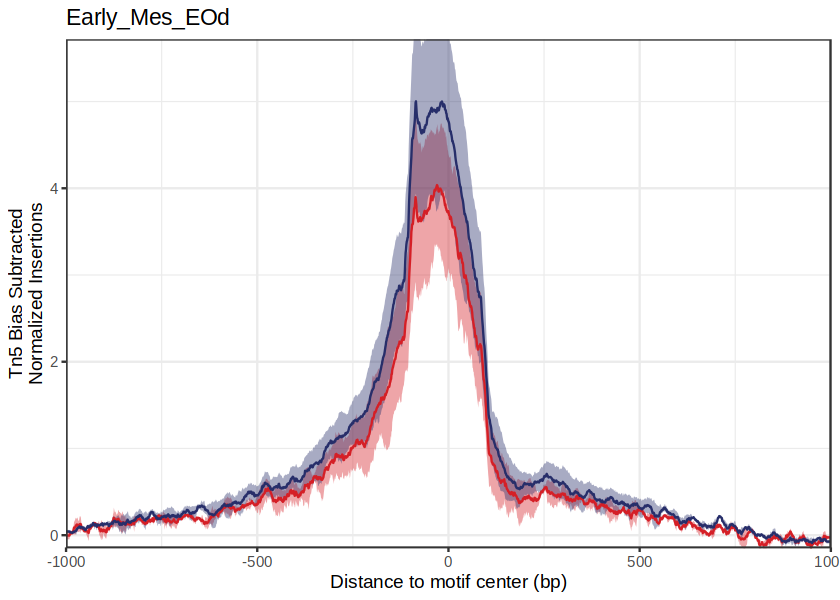

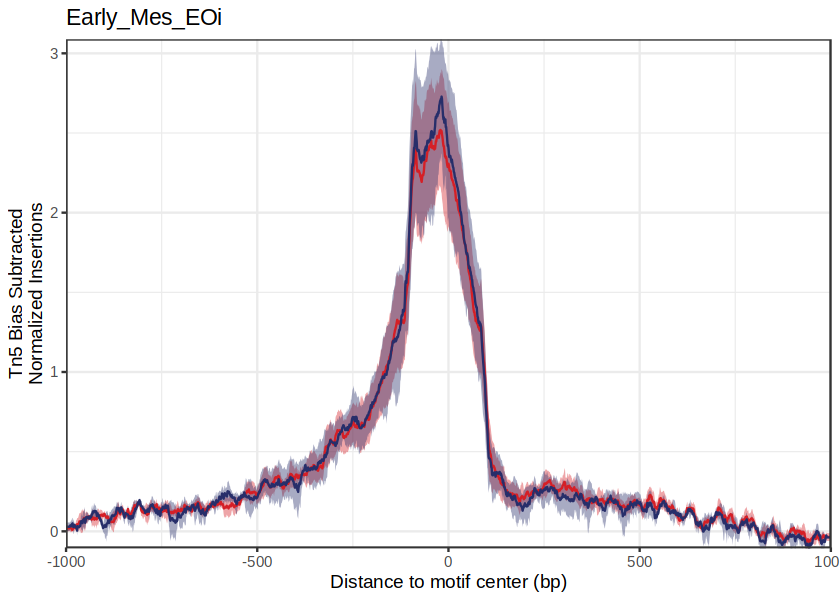

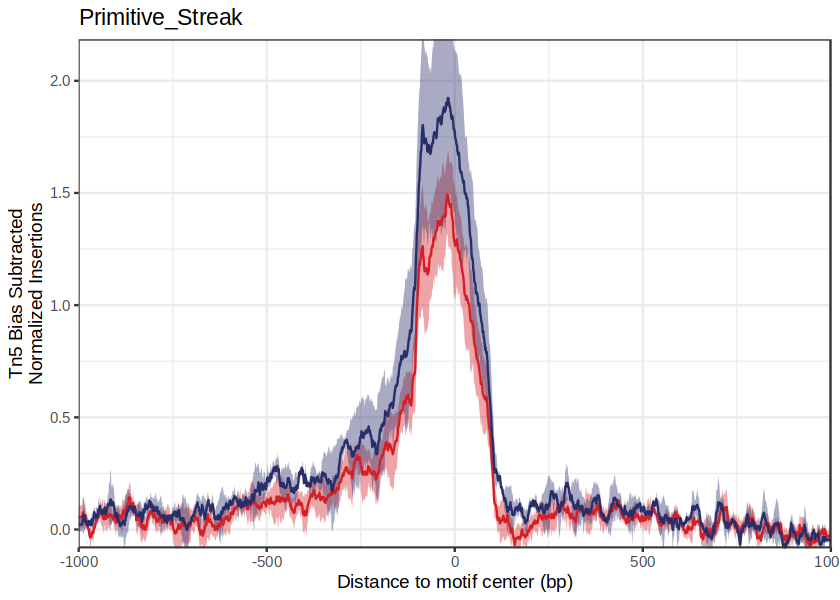

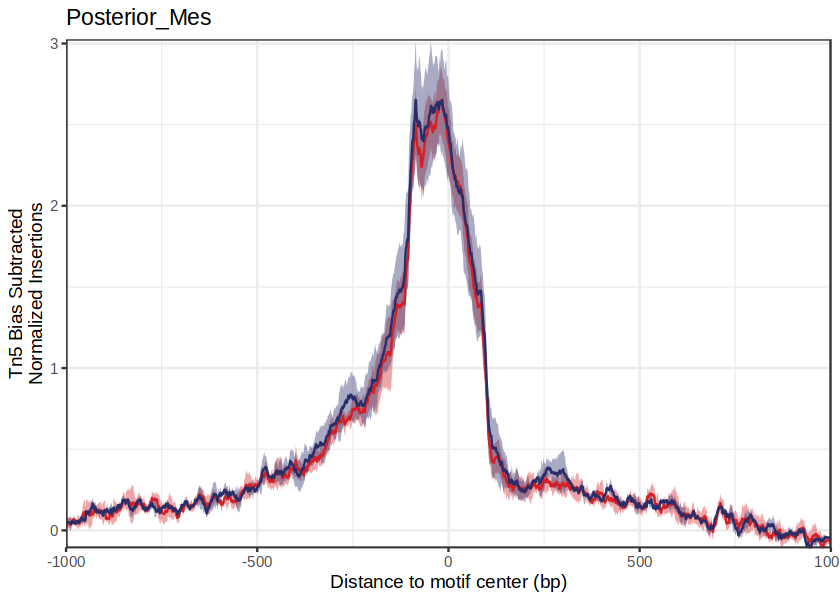

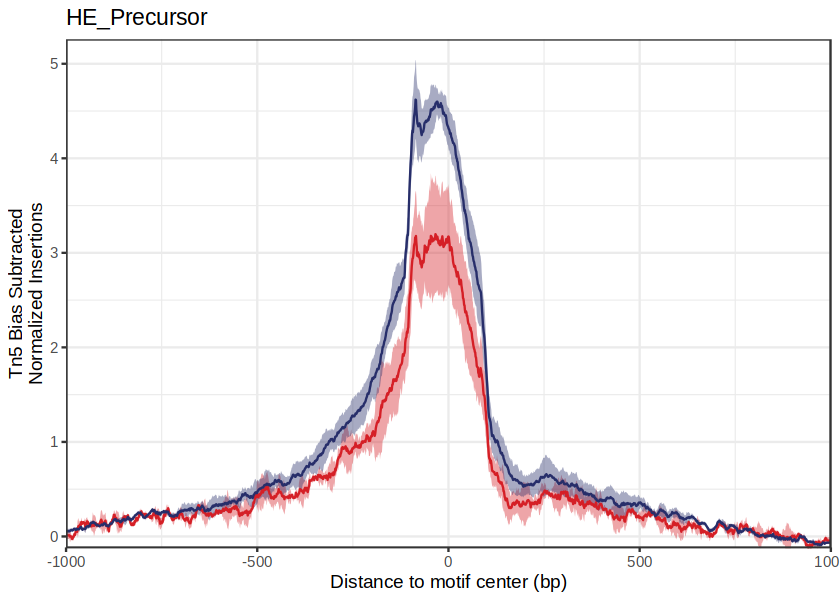

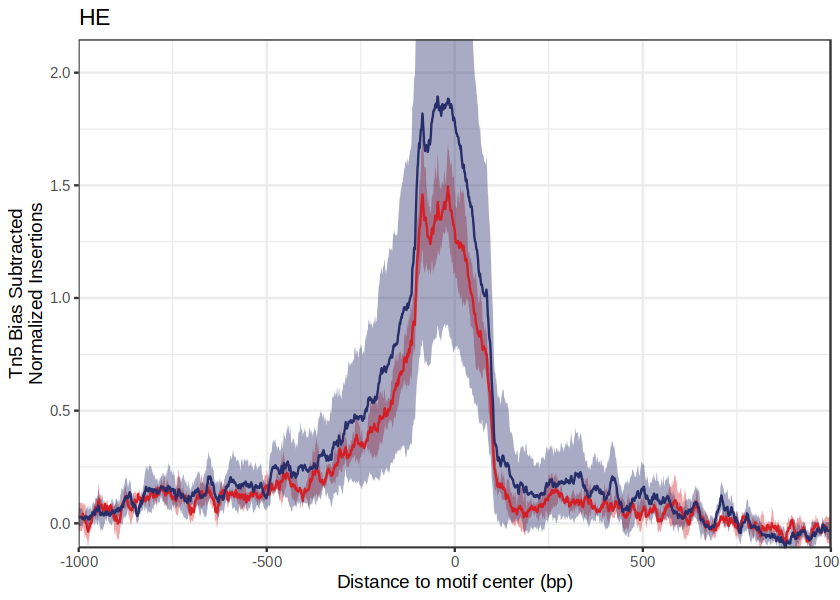

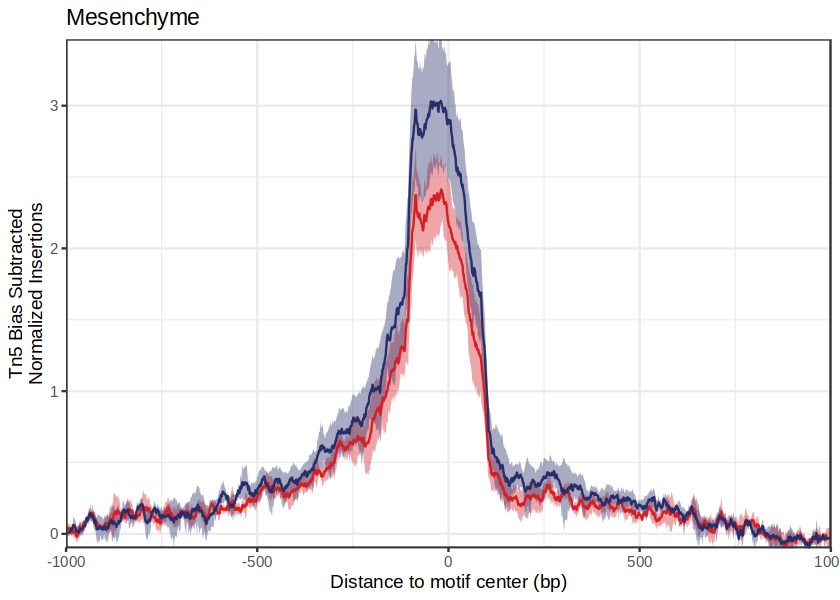

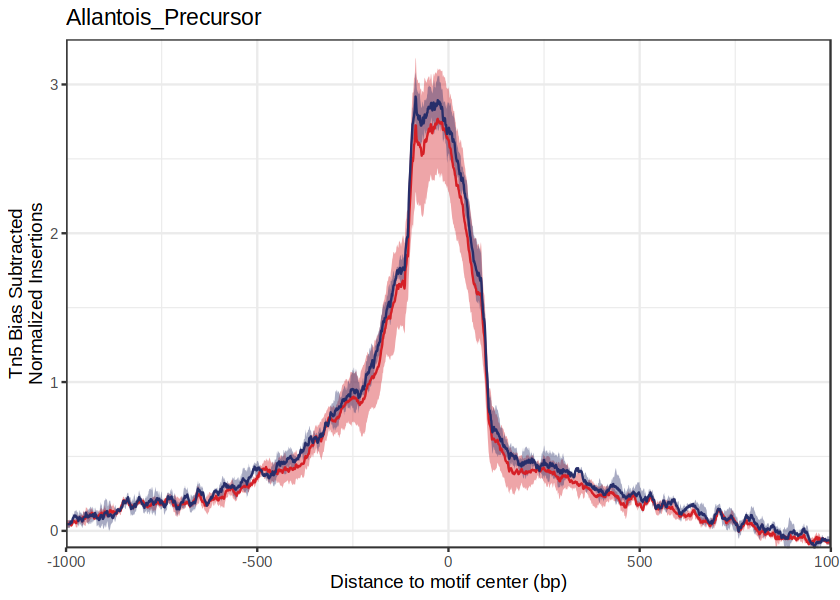

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


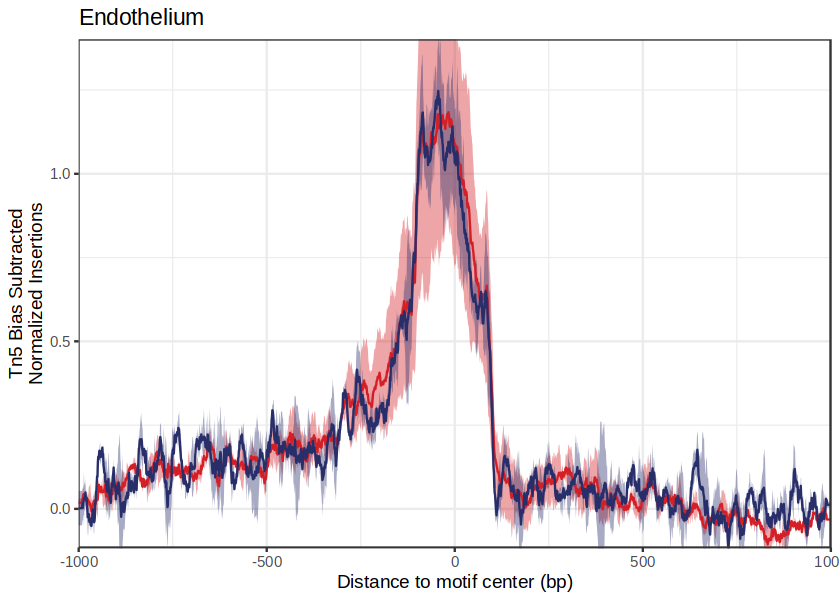

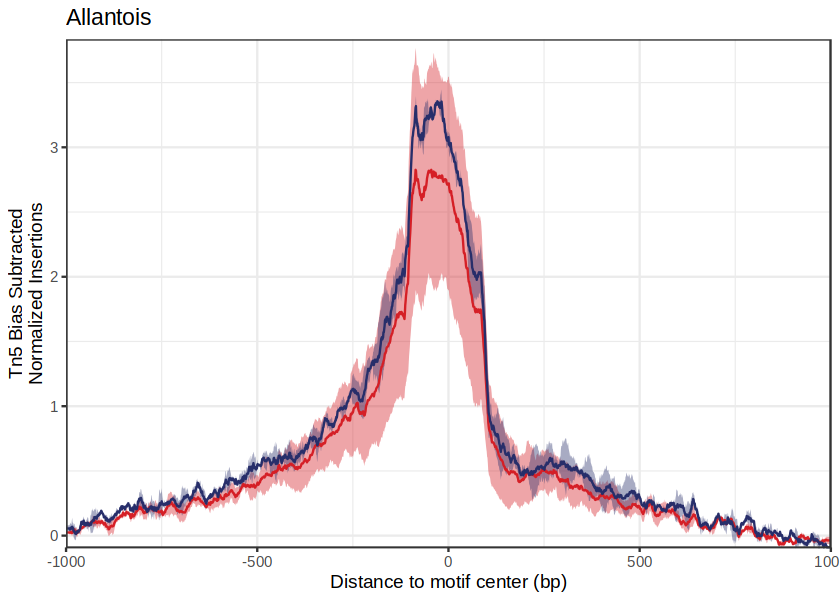

In [354]:
etv2.gr = GRangesList(makeGRangesFromDataFrame(etv2[dynamic_atac_cluster == 'op_cl']))
names(etv2.gr) = 'Etv2'

seFoot_etv2_na <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = etv2.gr, 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)


celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_na[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_na)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_na))
                             )],
      normMethod = "subtract",
      name = 'Etv2',
      flank = 1000,
      smoothWindow = 20) + 
    ggtitle(i) + theme_bw()
})

#### Overlap with peaks

ArchR logging to : ArchRLogs/ArchR-getFootprints-3c8639453f2cc9-Date-2024-05-16_Time-17-35-02.log
If there is an issue, please report to github with logFile!

2024-05-16 17:35:02 : Computing Kmer Bias Table, 0.003 mins elapsed.

2024-05-16 17:35:02 : Finished Computing Kmer Tables, 0.005 mins elapsed.

2024-05-16 17:35:02 : Computing Footprints, 0.008 mins elapsed.

2024-05-16 17:35:15 : Computing Footprints Bias, 0.215 mins elapsed.

2024-05-16 17:35:22 : Summarizing Footprints, 0.33 mins elapsed.



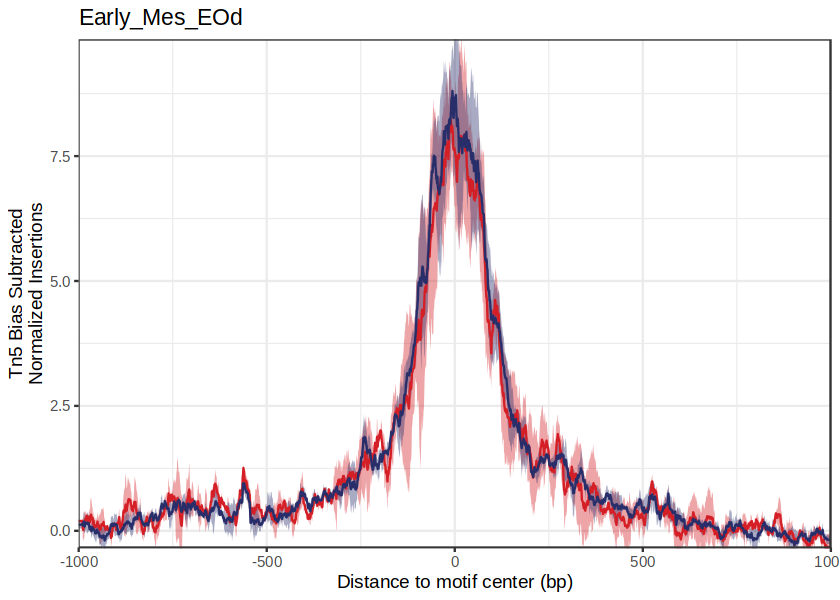

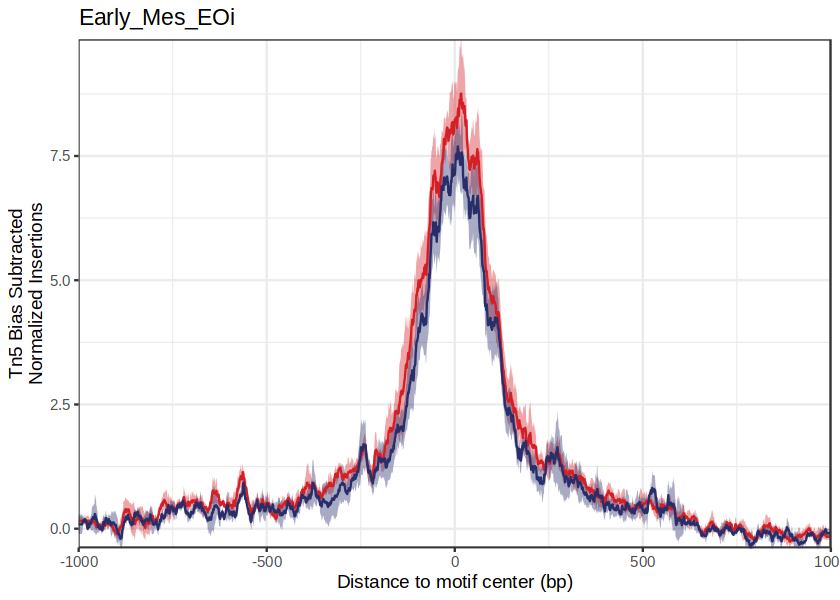

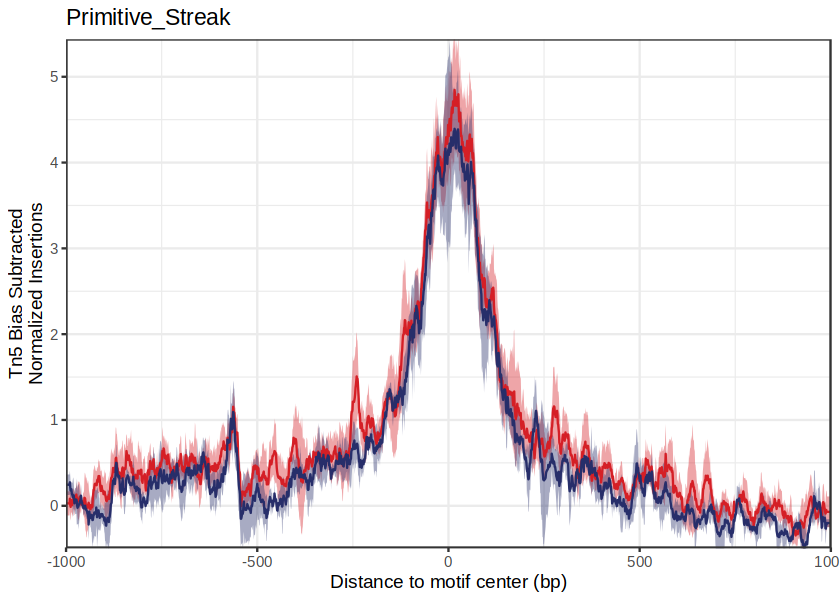

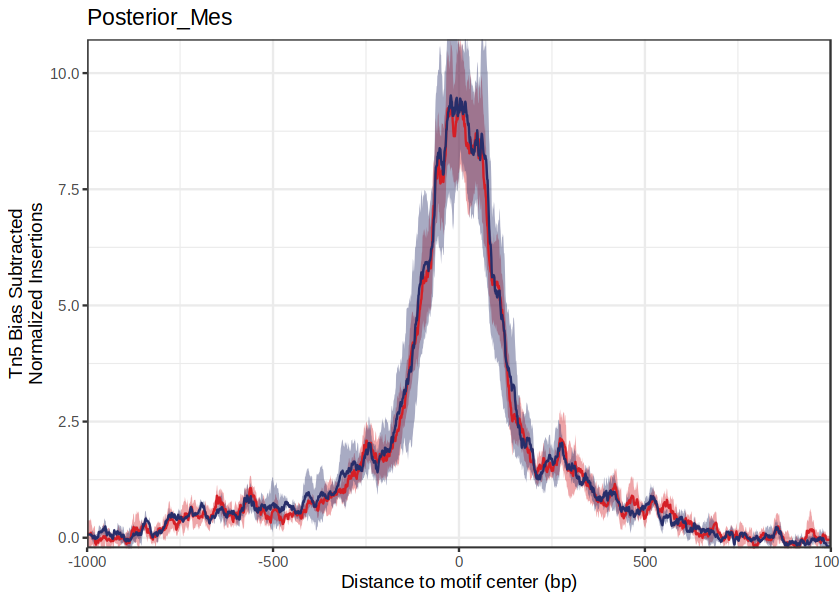

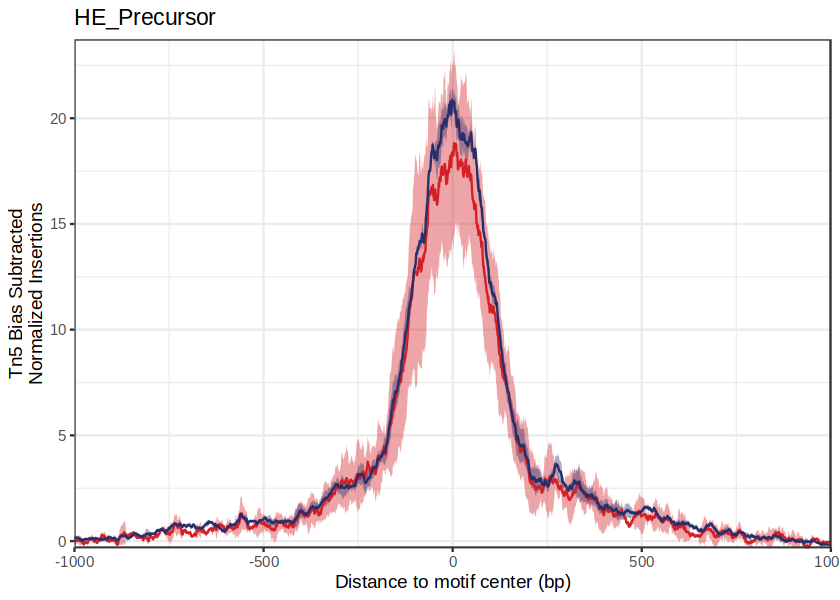

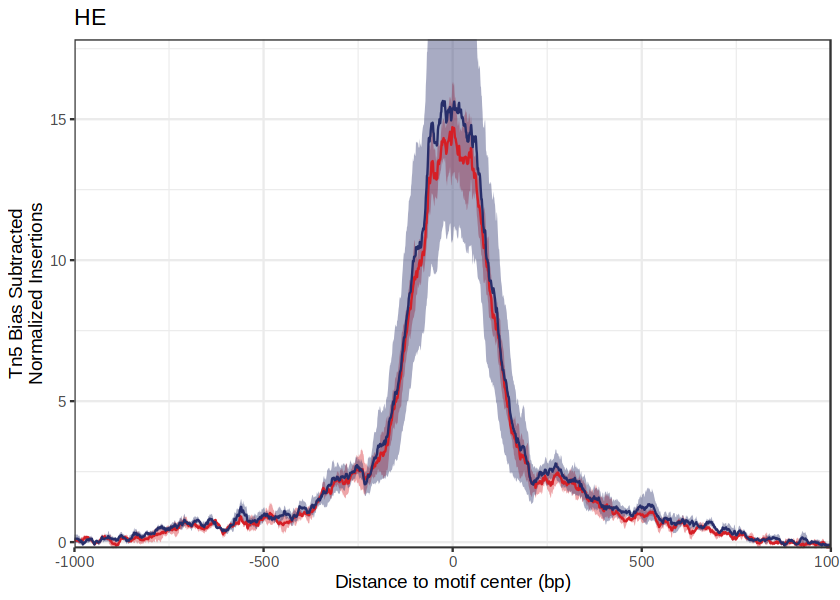

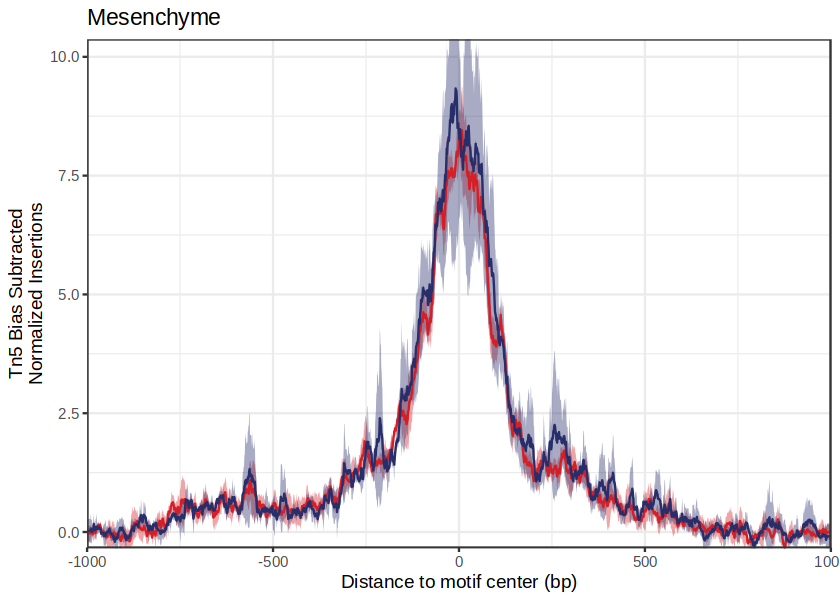

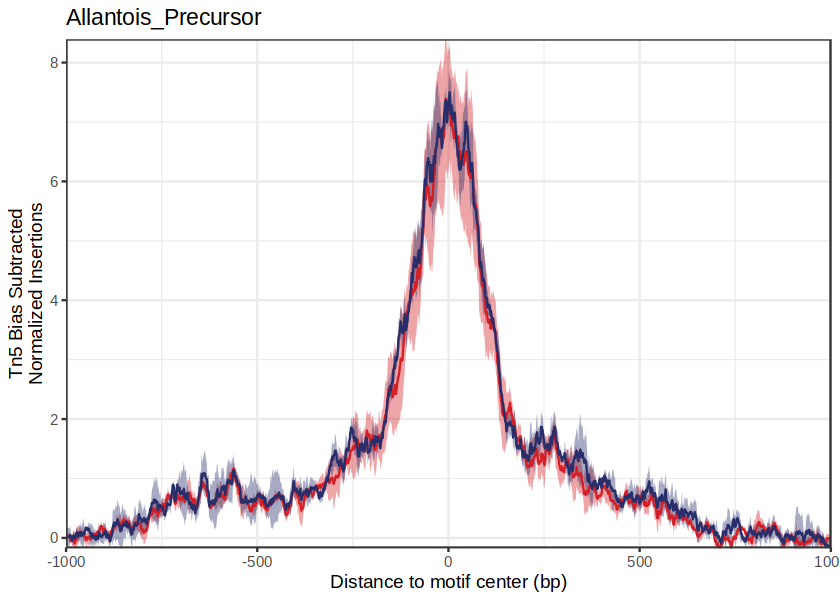

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


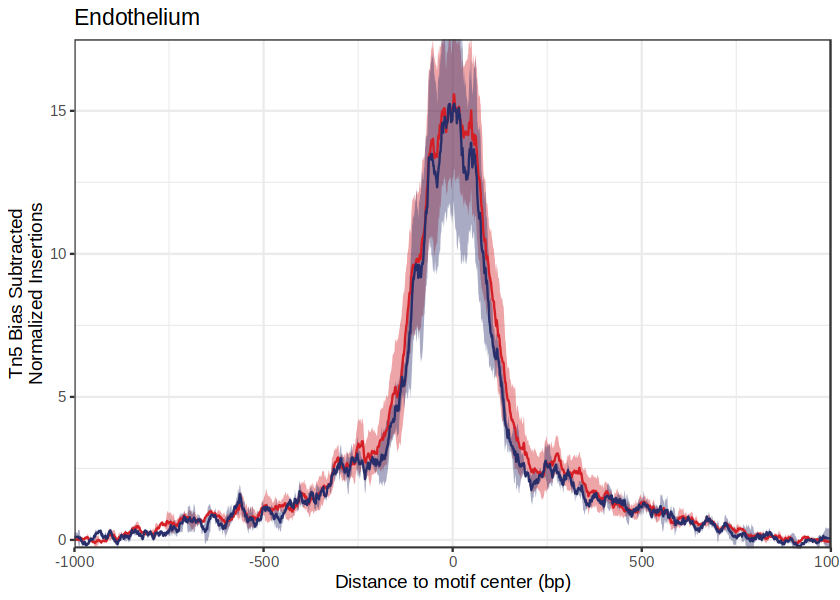

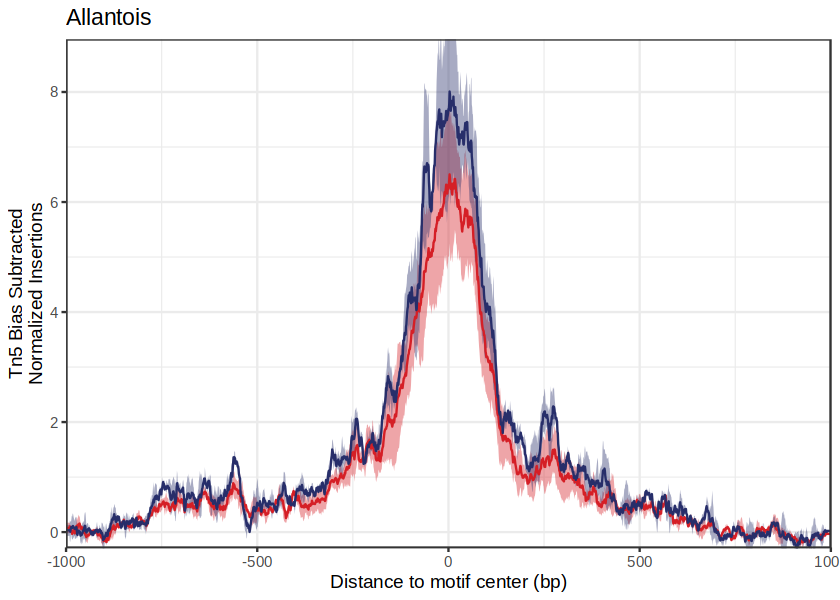

In [359]:
peakset.gr <- ArchRProject@peakSet
etv2_test =etv2[etv2$etv2_site_class == 'first_wave_etv2_site']

overlap = findOverlaps(peakset.gr, makeGRangesFromDataFrame(etv2_test), minoverlap = 150)
etv2.gr = GRangesList(peakset.gr[unique(queryHits(overlap))])
names(etv2.gr) = 'Etv2'

seFoot_etv2_na <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = etv2.gr, 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)


celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_na[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_na)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_na))
                             )],
      normMethod = "subtract",
      name = 'Etv2',
      flank = 1000,
      smoothWindow = 20) + 
    ggtitle(i) + theme_bw()
})

ArchR logging to : ArchRLogs/ArchR-getFootprints-3c8639699274a1-Date-2024-05-16_Time-17-49-53.log
If there is an issue, please report to github with logFile!

2024-05-16 17:49:53 : Computing Kmer Bias Table, 0.003 mins elapsed.

2024-05-16 17:49:54 : Finished Computing Kmer Tables, 0.008 mins elapsed.

2024-05-16 17:49:54 : Computing Footprints, 0.011 mins elapsed.

2024-05-16 17:50:07 : Computing Footprints Bias, 0.223 mins elapsed.

2024-05-16 17:50:14 : Summarizing Footprints, 0.341 mins elapsed.



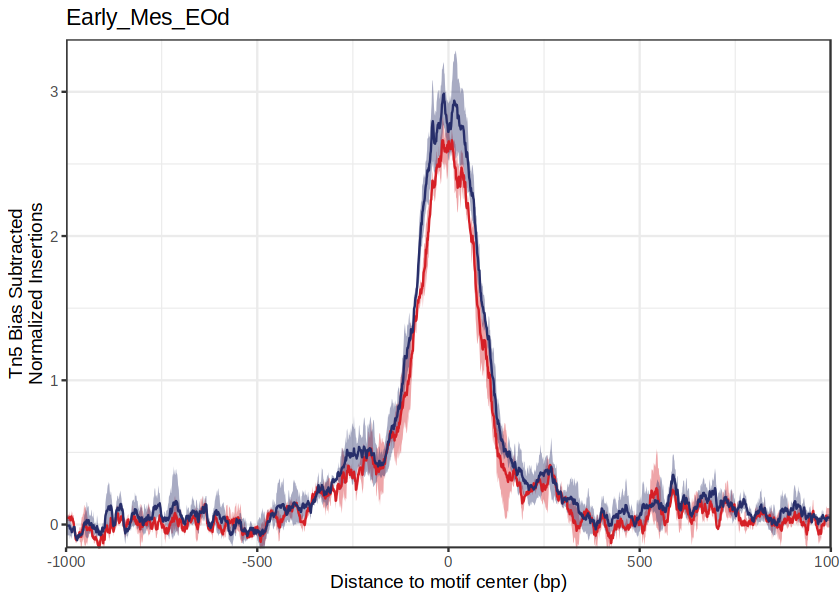

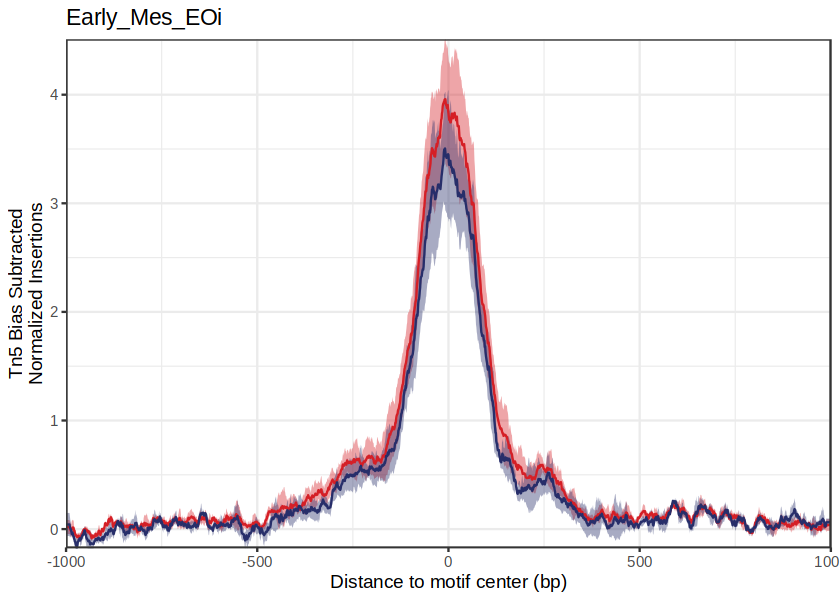

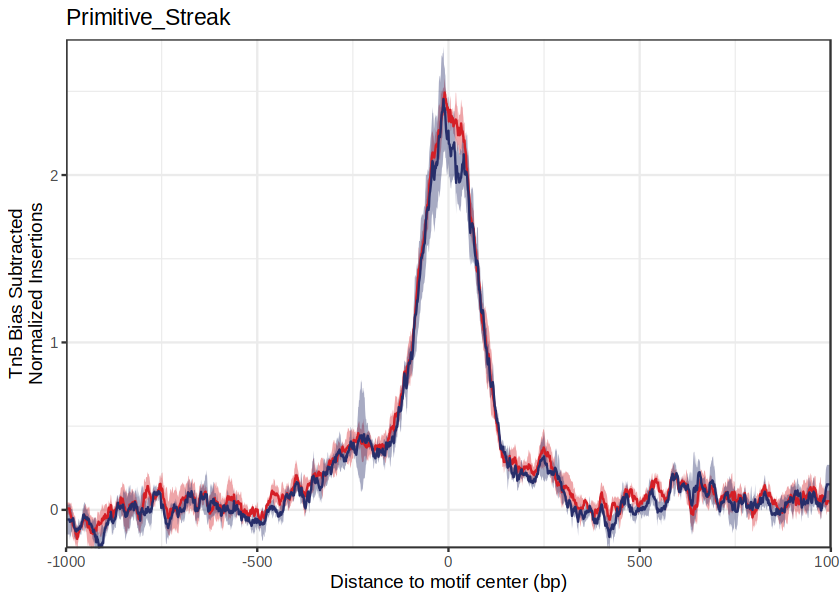

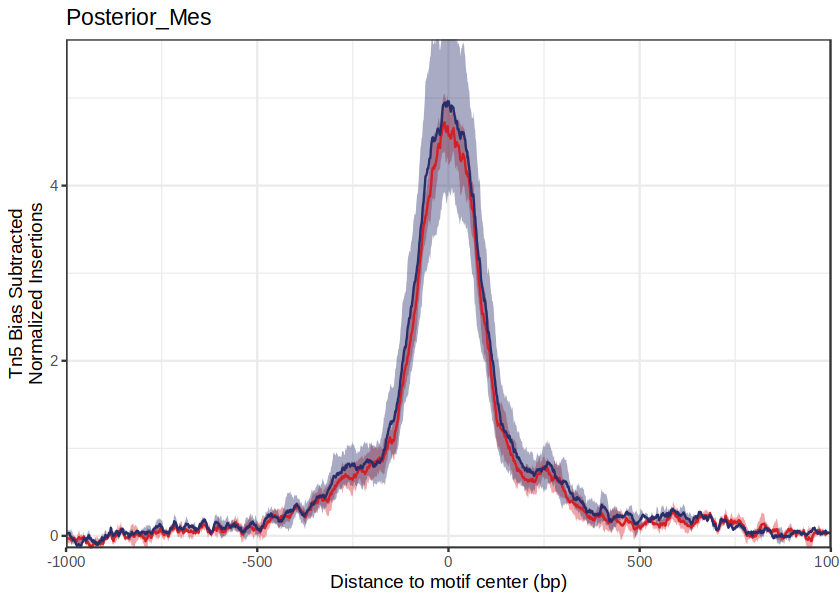

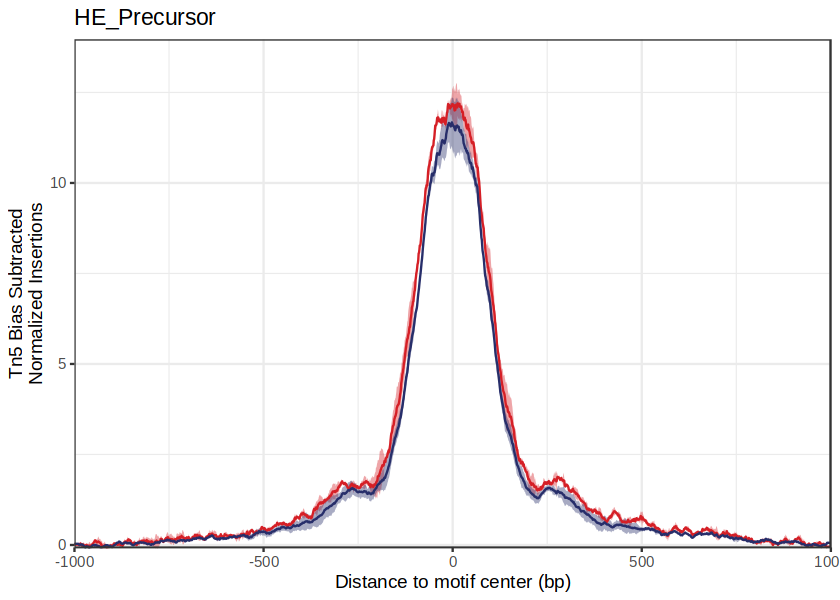

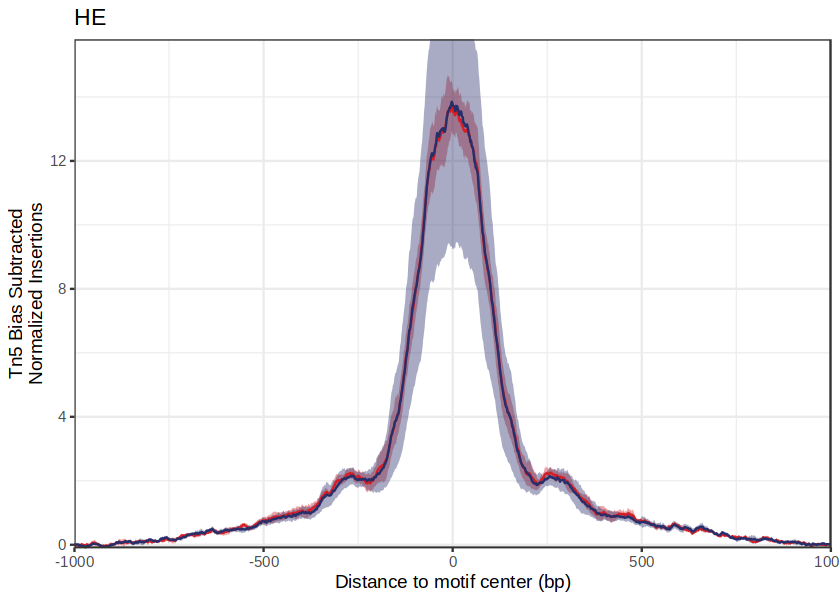

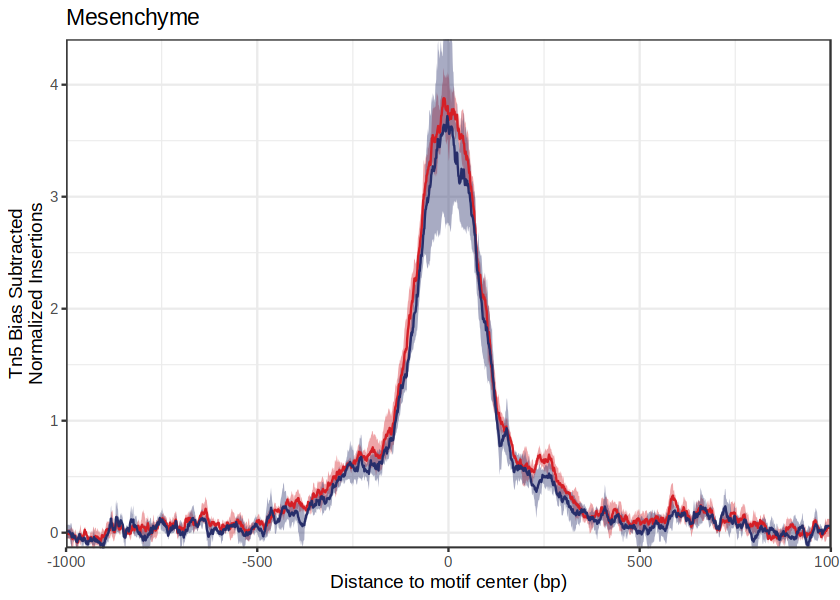

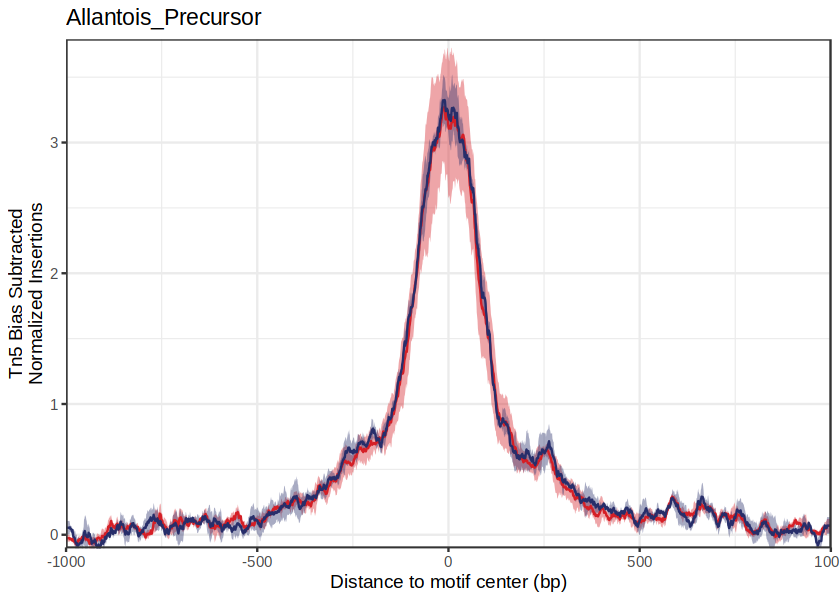

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


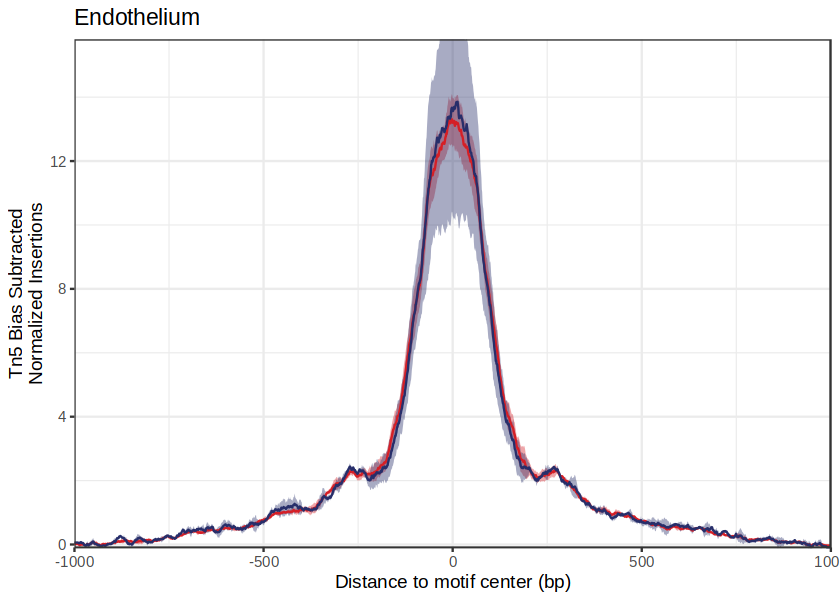

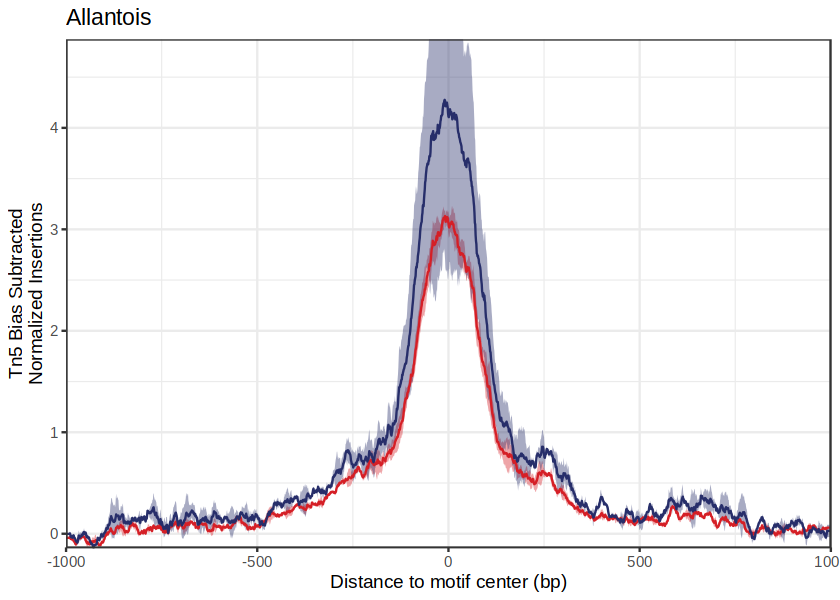

In [361]:
peakset.gr <- ArchRProject@peakSet
etv2_test =etv2[etv2$etv2_site_class == 'second_wave_etv2_site']

overlap = findOverlaps(peakset.gr, makeGRangesFromDataFrame(etv2_test), minoverlap = 150)
etv2.gr = GRangesList(peakset.gr[unique(queryHits(overlap))])
names(etv2.gr) = 'Etv2'

seFoot_etv2_na <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = etv2.gr, 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)


celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_na[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_na)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_na))
                             )],
      normMethod = "subtract",
      name = 'Etv2',
      flank = 1000,
      smoothWindow = 20) + 
    ggtitle(i) + theme_bw()
})

ArchR logging to : ArchRLogs/ArchR-getFootprints-3c86393f07f0e3-Date-2024-05-16_Time-17-50-22.log
If there is an issue, please report to github with logFile!

2024-05-16 17:50:22 : Computing Kmer Bias Table, 0.003 mins elapsed.

2024-05-16 17:50:22 : Finished Computing Kmer Tables, 0.007 mins elapsed.

2024-05-16 17:50:22 : Computing Footprints, 0.01 mins elapsed.

2024-05-16 17:50:36 : Computing Footprints Bias, 0.238 mins elapsed.

2024-05-16 17:50:43 : Summarizing Footprints, 0.359 mins elapsed.



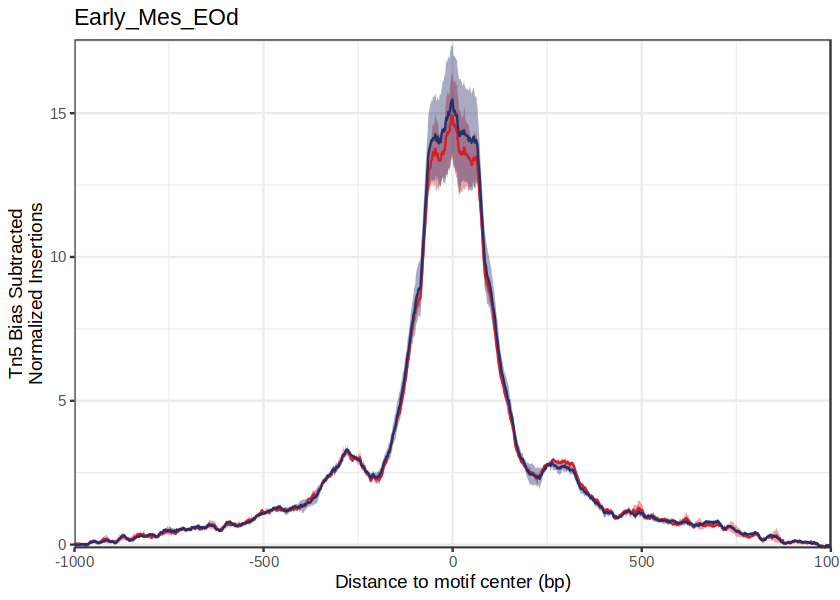

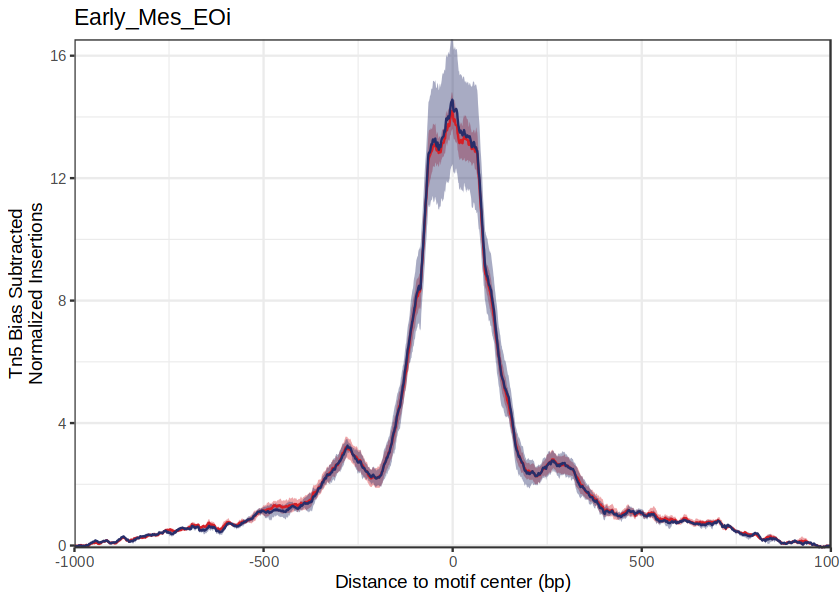

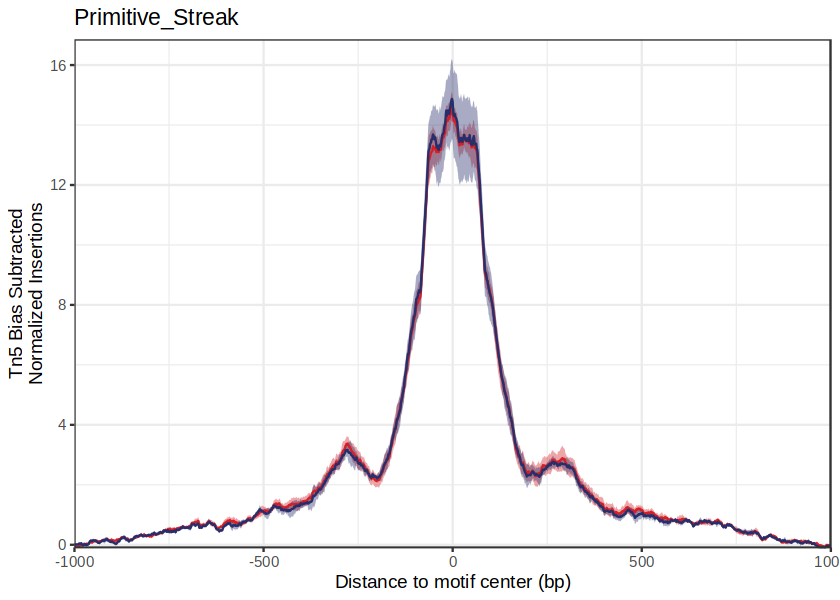

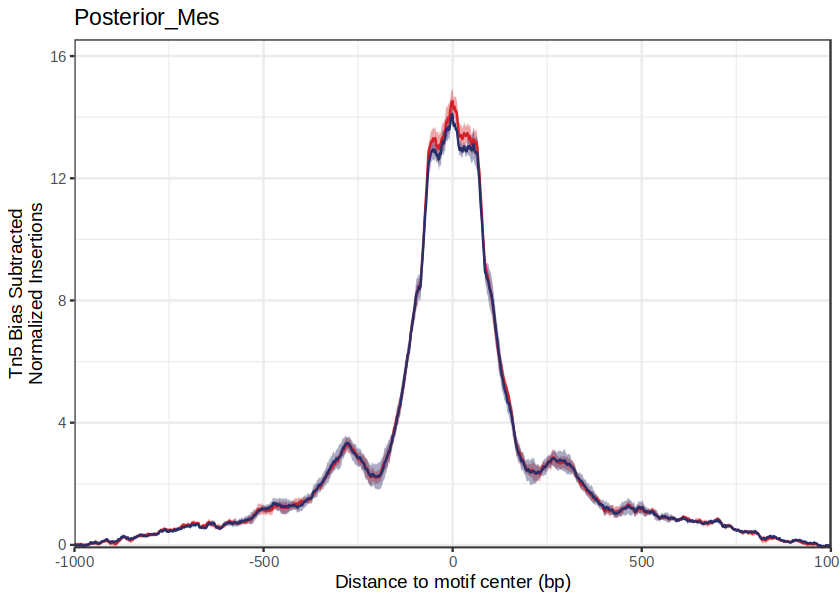

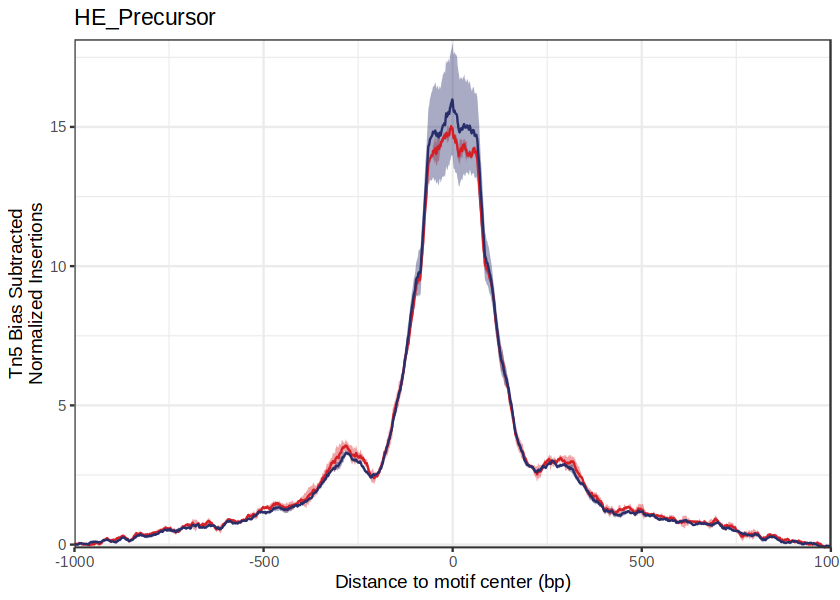

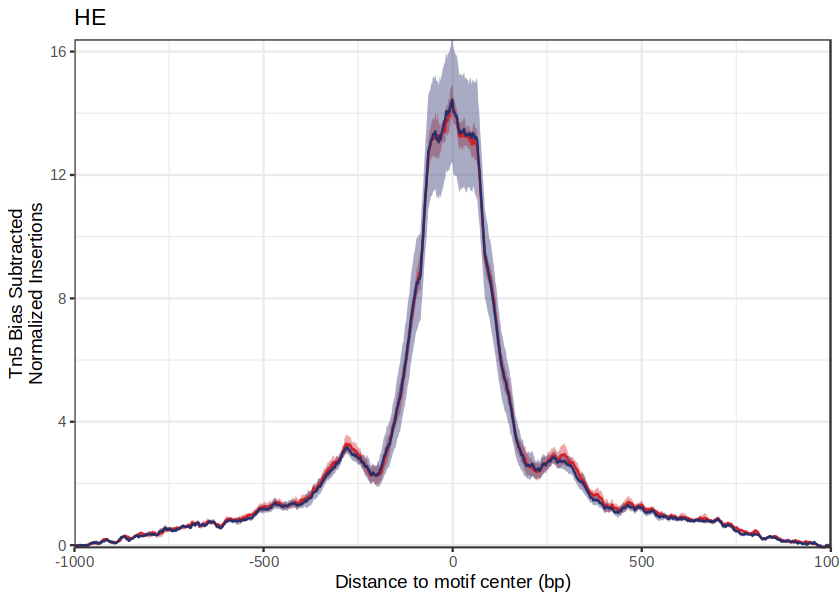

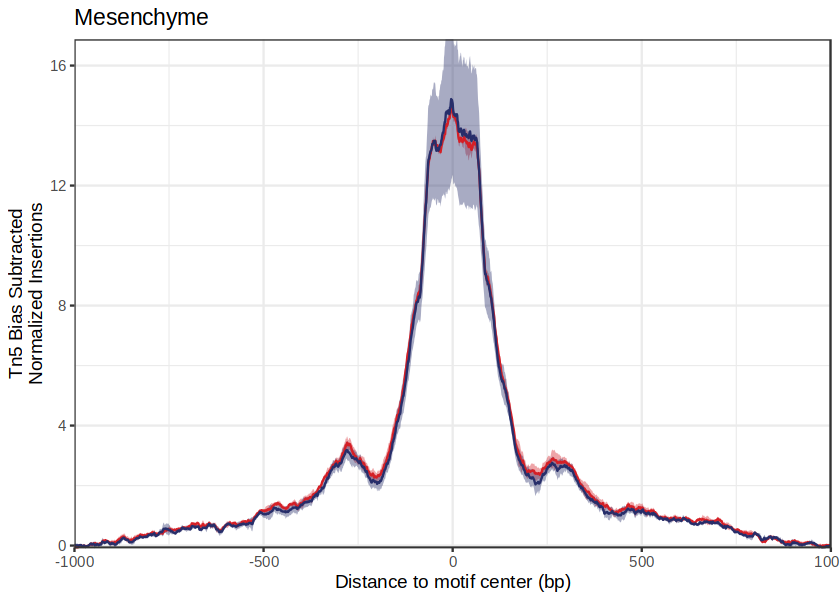

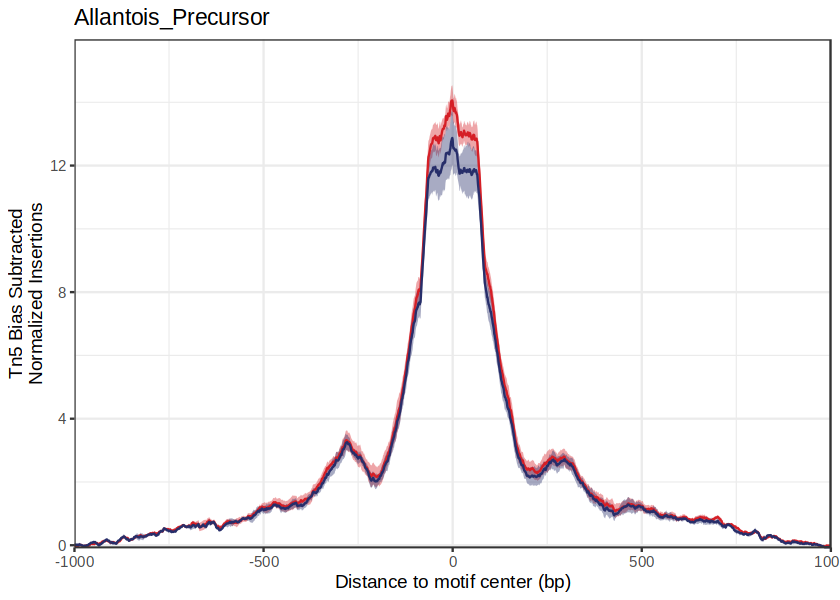

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


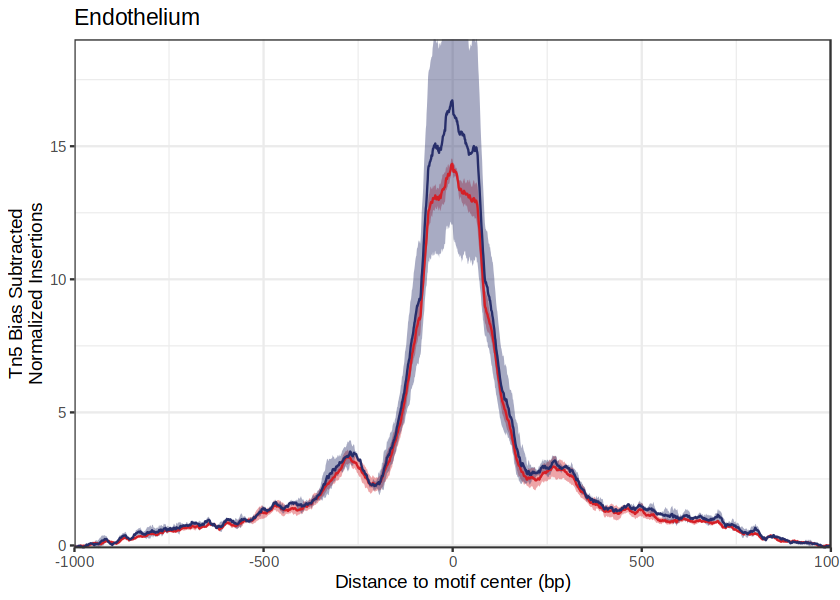

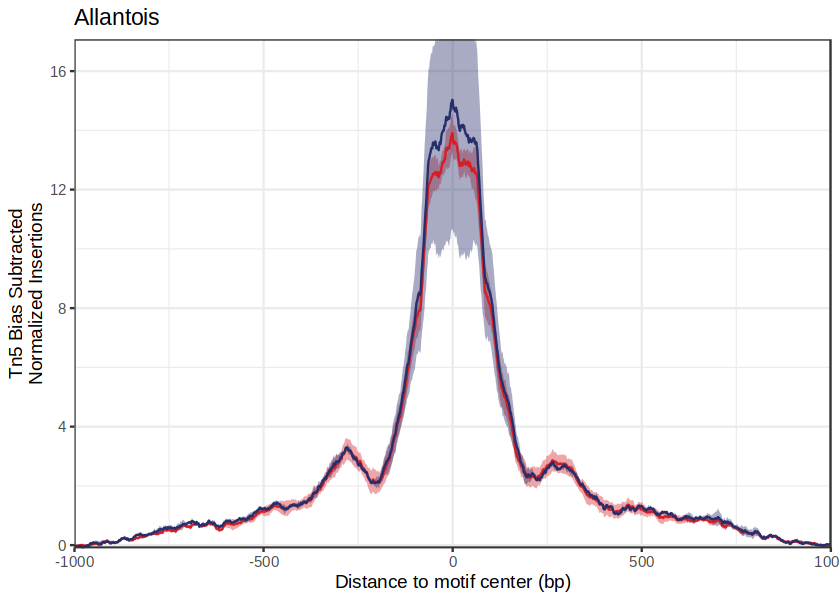

In [362]:
peakset.gr <- ArchRProject@peakSet
etv2_test = etv2[is.na(etv2_site_class) & etv2_peak == 1]

overlap = findOverlaps(peakset.gr, makeGRangesFromDataFrame(etv2_test), minoverlap = 150)
etv2.gr = GRangesList(peakset.gr[unique(queryHits(overlap))])
names(etv2.gr) = 'Etv2'

seFoot_etv2_na <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = etv2.gr, 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)


celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_na[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_na)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_na))
                             )],
      normMethod = "subtract",
      name = 'Etv2',
      flank = 1000,
      smoothWindow = 20) + 
    ggtitle(i) + theme_bw()
})

# Overlap with KD vs WT differential peaks

In [192]:
dATAC.dt = fread(paste0(args$accessibility, 'DARs_edgeR_pb.txt.gz'))[padj_fdr<0.05] %>% 
    .[,`:=`(chr = as.factor(peak %>% str_split(':') %>% map_chr(1)),
                start = as.integer(peak %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(1)),
                end = as.integer(peak %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(2)))]

In [279]:
etv2_test = etv2[etv2$etv2_peak == 1] %>% .[,centre := start + (stop-start)/2]
etv2.gr = GRanges(
    seqnames = Rle(etv2_test[unique(subjectHits(overlap)), chr]),
    ranges = IRanges(etv2_test[unique(subjectHits(overlap)), centre]))

In [304]:
dATAC_test.dt = dATAC.dt[logFC >= 0.5  & celltype %in% c('Primitive_Streak', 'Early_Mes_EOi', 'Early_Mes_EOd')]
dATAC.gr <- GRanges(
    seqnames = Rle(dATAC_test.dt$chr),
    ranges = IRanges(dATAC_test.dt$start, end = dATAC_test.dt$end))
etv2_test = etv2[etv2$etv2_peak == 1]
overlap = findOverlaps(dATAC.gr, makeGRangesFromDataFrame(etv2_test), minoverlap = 150)
etv2.gr = GRangesList(makeGRangesFromDataFrame(dATAC.gr[unique(queryHits(overlap))]))
names(etv2.gr) = 'Etv2'

length(overlap)

seFoot_etv2_overlaps <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = etv2.gr, 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)



[1] 75

ArchR logging to : ArchRLogs/ArchR-getFootprints-3c86394d45d70d-Date-2024-05-16_Time-16-42-18.log
If there is an issue, please report to github with logFile!

2024-05-16 16:42:18 : Computing Kmer Bias Table, 0.004 mins elapsed.

2024-05-16 16:42:19 : Finished Computing Kmer Tables, 0.004 mins elapsed.

2024-05-16 16:42:19 : Computing Footprints, 0.008 mins elapsed.

2024-05-16 16:42:29 : Computing Footprints Bias, 0.174 mins elapsed.

2024-05-16 16:42:34 : Summarizing Footprints, 0.271 mins elapsed.



ArchR logging to : ArchRLogs/ArchR-getFootprints-3c86391edf9599-Date-2024-05-16_Time-16-42-36.log
If there is an issue, please report to github with logFile!

2024-05-16 16:42:36 : Computing Kmer Bias Table, 0.003 mins elapsed.

2024-05-16 16:42:36 : Finished Computing Kmer Tables, 0.004 mins elapsed.

2024-05-16 16:42:36 : Computing Footprints, 0.007 mins elapsed.

2024-05-16 16:42:45 : Computing Footprints Bias, 0.162 mins elapsed.

2024-05-16 16:42:51 : Summarizing Footprints, 0.25 mins elapsed.



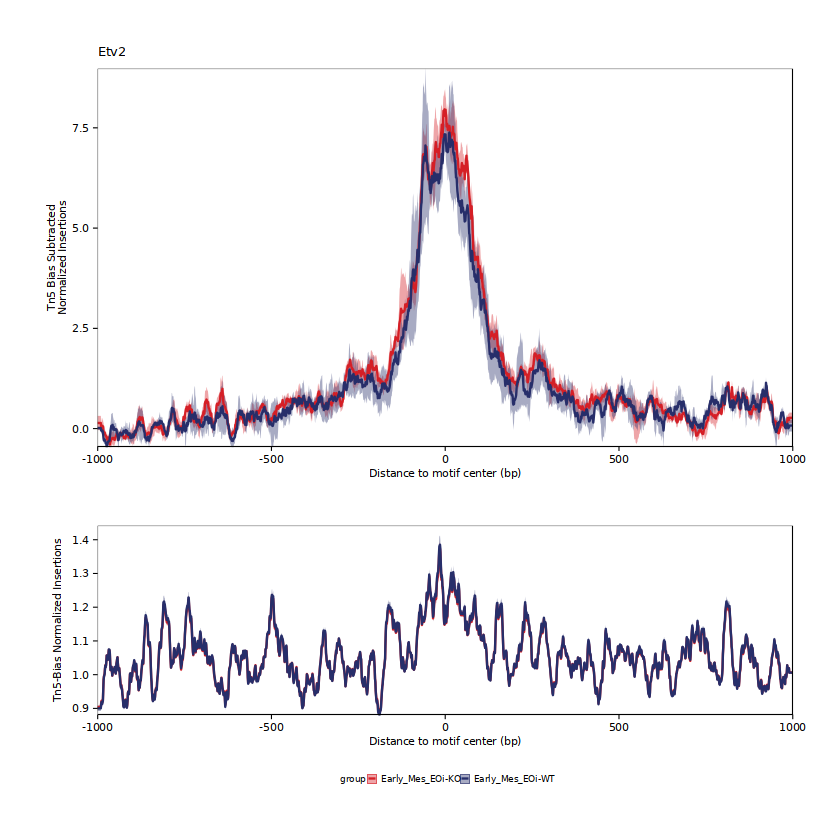

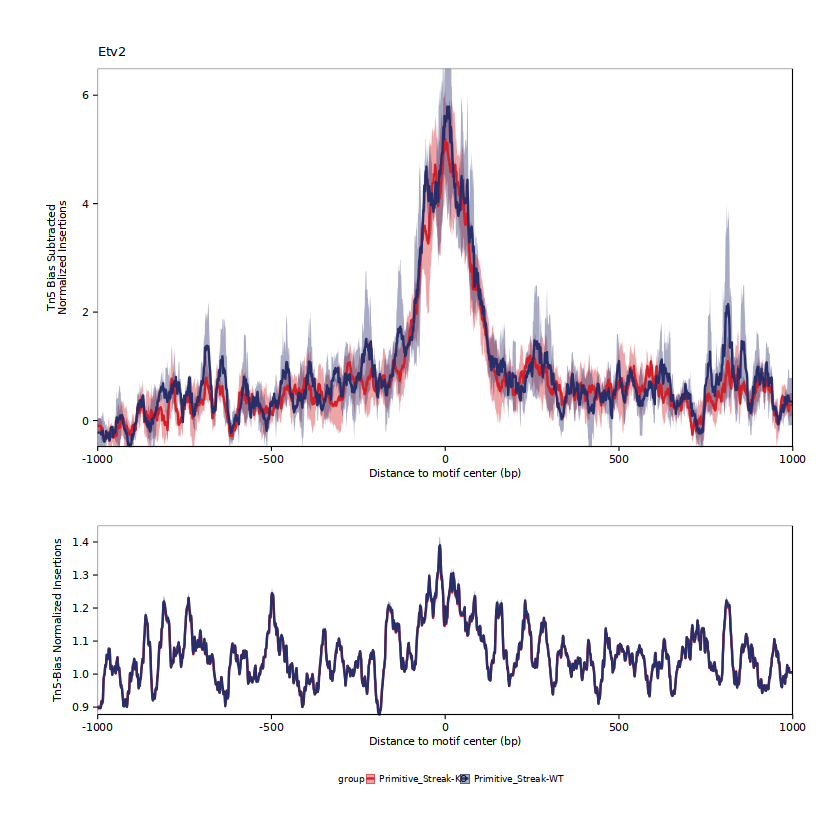

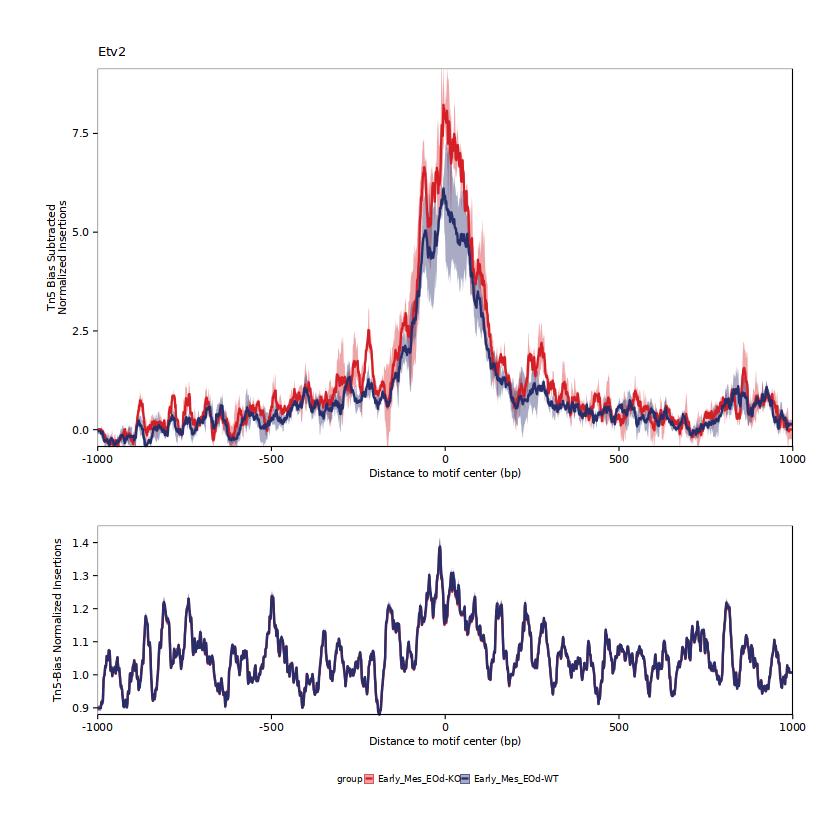

In [305]:
etv2.gr = GRangesList(makeGRangesFromDataFrame(dATAC.gr[unique(queryHits(overlap))]))
names(etv2.gr) = 'Etv2'

seFoot_etv2_overlaps <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = etv2.gr, 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)

celltype = 'Early_Mes_EOi'

footprint_manual(
      seFoot = seFoot_etv2_overlaps[,c(grep(paste0(celltype, '-WT'), colnames(seFoot_etv2_overlaps)),
                             grep(paste0(celltype, '-KO'), colnames(seFoot_etv2_overlaps))
                             )],
      normMethod = "subtract",
      name = 'Etv2',
      flank = 1000,
      smoothWindow = 20)

celltype = 'Primitive_Streak'

footprint_manual(
      seFoot = seFoot_etv2_overlaps[,c(grep(paste0(celltype, '-WT'), colnames(seFoot_etv2_overlaps)),
                             grep(paste0(celltype, '-KO'), colnames(seFoot_etv2_overlaps))
                             )],
      normMethod = "subtract",
      name = 'Etv2',
      flank = 1000,
      smoothWindow = 20)

celltype = 'Early_Mes_EOd'
footprint_manual(
      seFoot = seFoot_etv2_overlaps[,c(grep(paste0(celltype, '-WT'), colnames(seFoot_etv2_overlaps)),
                             grep(paste0(celltype, '-KO'), colnames(seFoot_etv2_overlaps))
                             )],
      normMethod = "subtract",
      name = 'Etv2',
      flank = 1000,
      smoothWindow = 20)

#### Homer motif enrichment at the different sites

In [307]:
unique(etv2$etv2_site_class)

[1] NA                      "second_wave_etv2_site" "first_wave_etv2_site"

In [324]:
tmp = etv2 %>% copy() %>% .[etv2_site_class == 'first_wave_etv2_site']
fwrite(tmp, sprintf('%s/first_wave_etv2_site.bed', args$outdir) , col.names=F, sep='\t')
tmp = etv2 %>% copy() %>% .[etv2_site_class == 'second_wave_etv2_site']
fwrite(tmp, sprintf('%s/second_wave_etv2_site.bed', args$outdir) , col.names=F, sep='\t')
tmp = etv2 %>% copy() %>% .[is.na(etv2_site_class) & etv2_peak == 1]
fwrite(tmp, sprintf('%s/NA_site.bed', args$outdir) , col.names=F, sep='\t')

In [328]:
files = gsub('.bed', '', list.files(args$outdir, pattern = 'site.bed'))

In [329]:
files

[1] "first_wave_etv2_site"  "NA_site"               "second_wave_etv2_site"

In [331]:
# Motif search using Homer
mclapply(files, function(x){
    cmd = sprintf('/rds/project/rds-SDzz0CATGms/users/bt392/software/homer/bin/findMotifsGenome.pl %s/%s.bed mm10 %s/%s -size 250 -S 10 -len 8,10,12 -p 24', 
                       args$outdir, x,
                         args$outdir, x)
    system(cmd)
},mc.cores=12)

[[1]]
[1] 0

[[2]]
[1] 0

[[3]]
[1] 0

### In silico ChIP for Etv2

In [365]:
list.files(io$multiome)

[1] "vitro_peaks_silicoChIP_cisbp.rds"     
[2] "vitro_peaks_silicoChIP_jaspar2020.rds"

In [370]:
ArchRProject@peakAnnotation$Motif_cisbp$Positions

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/Motif_cisbp-Positions-In-Peaks.rds"

In [426]:
motifPositions <- getPositions(ArchRProject, 'Motif_cisbp')
names(motifPositions) = str_to_upper(str_split(names(motifPositions), '_') %>% map_chr(1))

In [434]:
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
# silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_jaspar2020.rds'))
assay(silico_chip, 'matches') = assay(silico_chip, 'VirtualChipScores') > 0.20
matches = silico_chip

TF = 'ETV2'
chip_tmp = as.data.table(as.matrix(assay(silico_chip[,TF], 'matches')), keep.rownames = T) %>% 
    .[ETV2 == TRUE] %>% 
    .[,`:=`(chr = as.factor(rn %>% str_split(':') %>% map_chr(1)),
                start = as.integer(rn %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(1)),
                end = as.integer(rn %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(2)))]
chip.gr = makeGRangesFromDataFrame(chip_tmp[,c('chr', 'start', 'end')])
overlap = findOverlaps(makeGRangesFromDataFrame(chip.gr), motifPositions[['ETV2']])
silico = motifPositions[['ETV2']][subjectHits(overlap)]
silico = GRangesList(silico)
names(silico) = 'ETV2'

seFoot_etv2_silico <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = silico['ETV2'], 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)

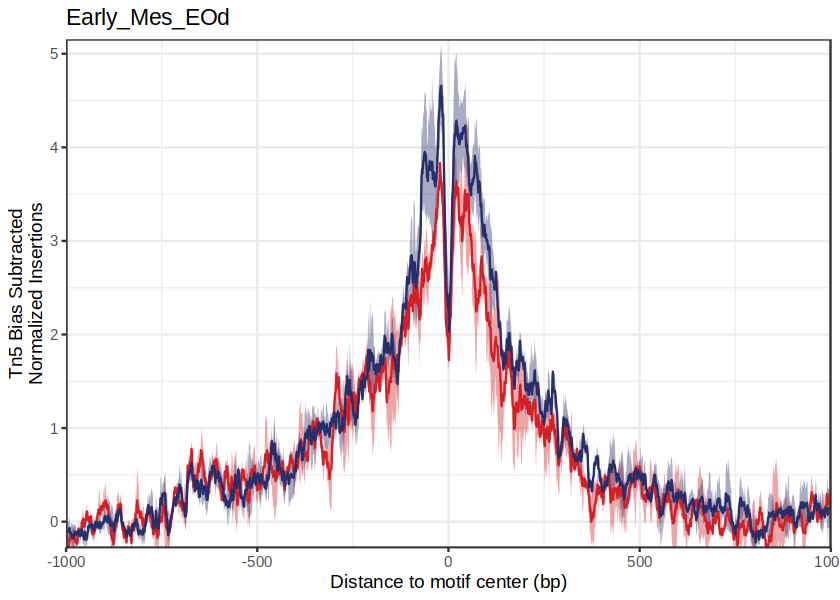

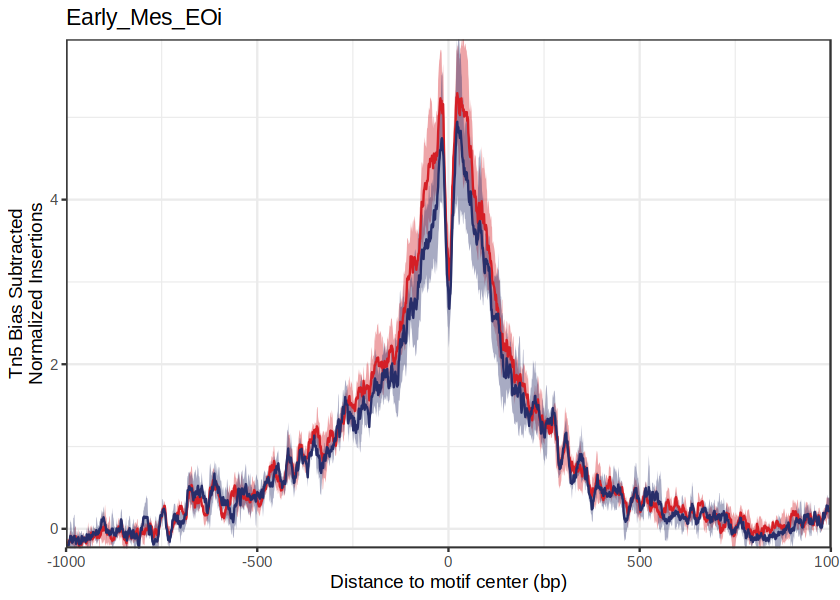

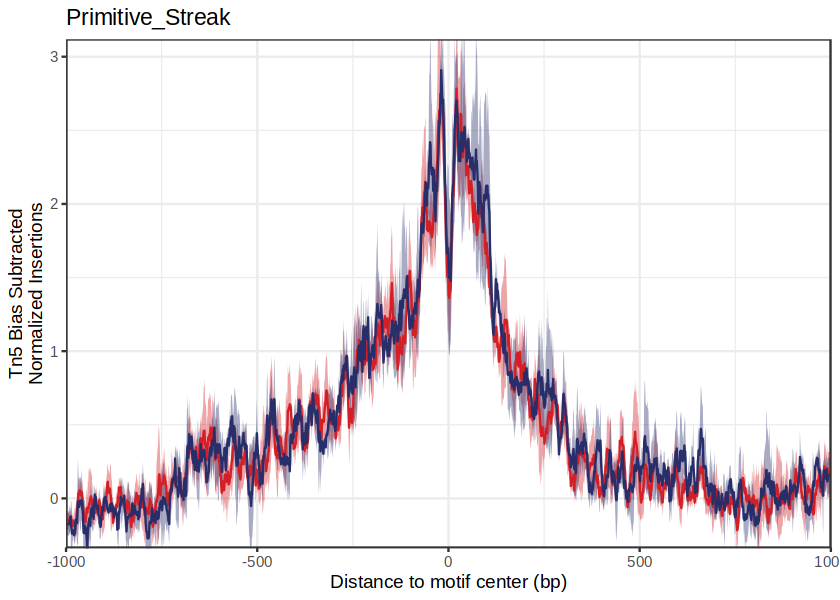

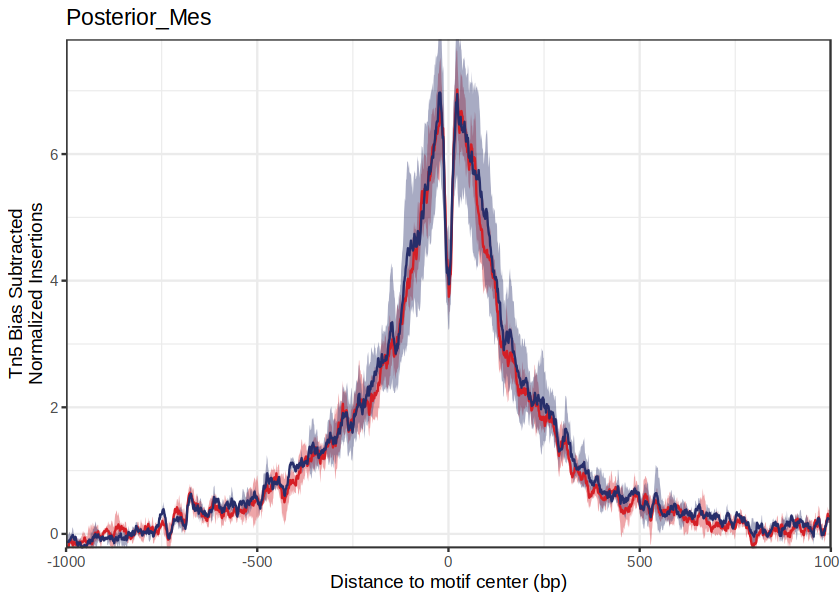

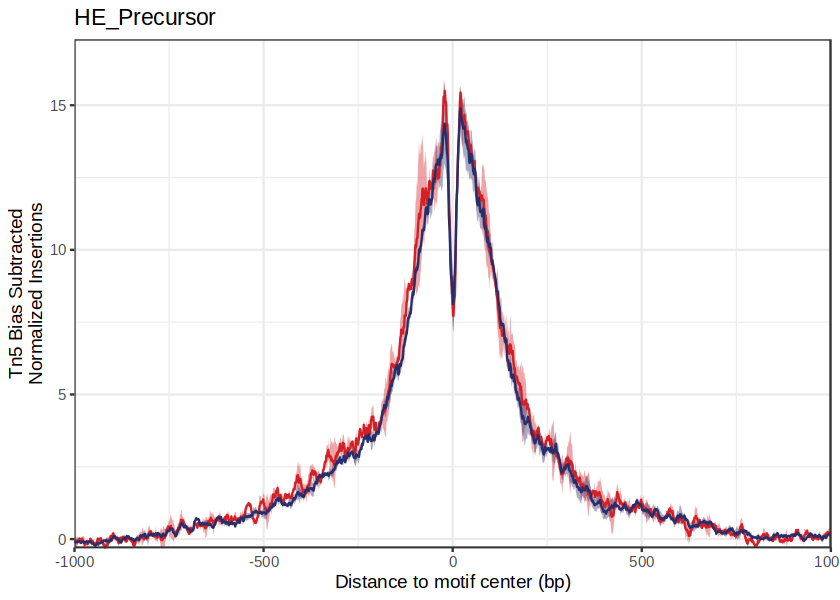

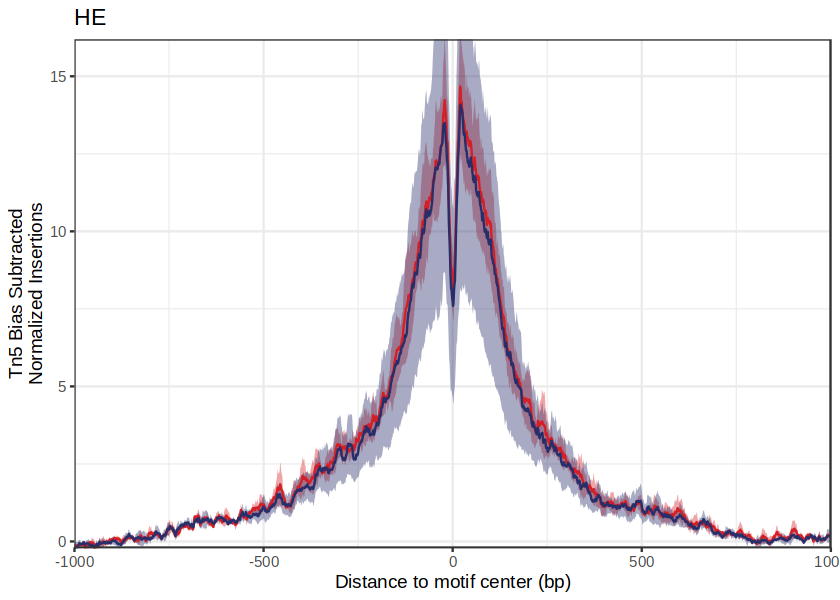

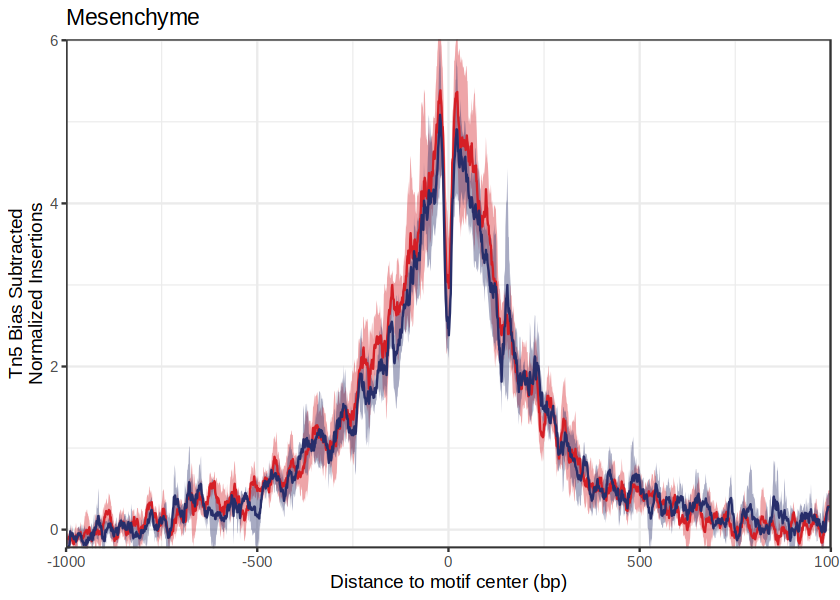

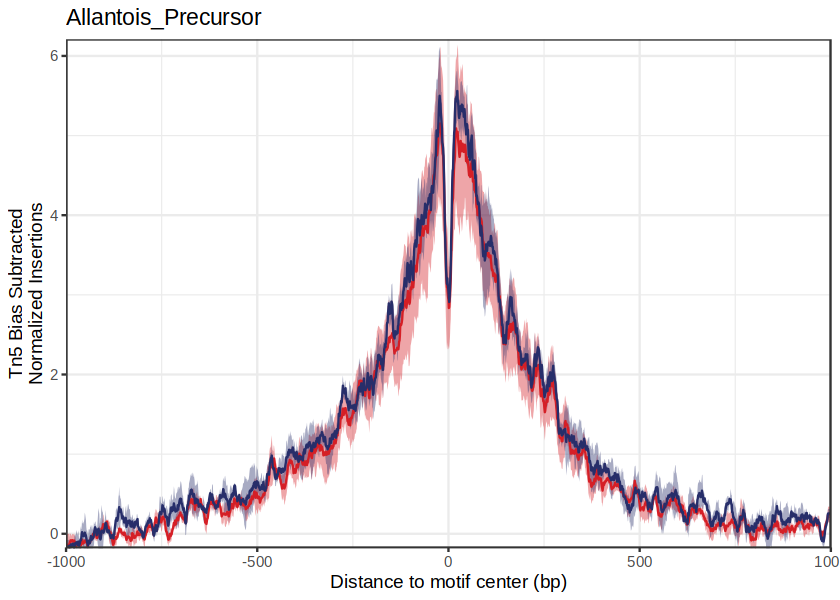

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


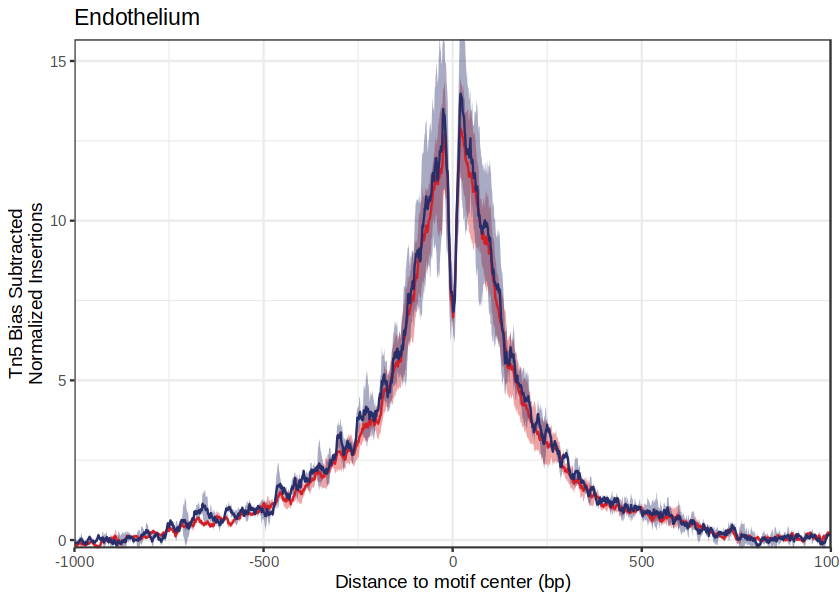

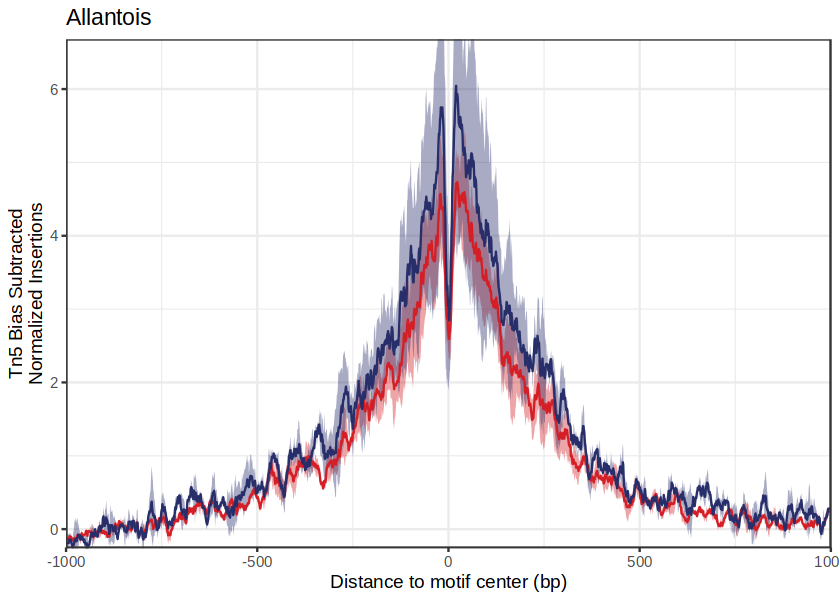

In [445]:
celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_silico[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_silico)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_silico))
                             )],
      normMethod = "subtract",
      name = 'ETV2',
      flank = 1000,
      smoothWindow = 15) + 
    ggtitle(i) + theme_bw()
})

In [446]:
silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))


ArchR logging to : ArchRLogs/ArchR-getFootprints-3c863912e83d10-Date-2024-05-16_Time-18-38-04.log
If there is an issue, please report to github with logFile!

2024-05-16 18:38:04 : Computing Kmer Bias Table, 0.004 mins elapsed.

2024-05-16 18:38:14 : Finished Computing Kmer Tables, 0.153 mins elapsed.

2024-05-16 18:38:14 : Computing Footprints, 0.157 mins elapsed.

2024-05-16 18:38:23 : Computing Footprints Bias, 0.315 mins elapsed.

2024-05-16 18:38:31 : Summarizing Footprints, 0.444 mins elapsed.

ArchR logging to : ArchRLogs/ArchR-getFootprints-3c86395d4b9f7e-Date-2024-05-16_Time-18-38-33.log
If there is an issue, please report to github with logFile!

2024-05-16 18:38:33 : Computing Kmer Bias Table, 0.003 mins elapsed.

2024-05-16 18:38:34 : Finished Computing Kmer Tables, 0.022 mins elapsed.

2024-05-16 18:38:34 : Computing Footprints, 0.025 mins elapsed.

2024-05-16 18:38:46 : Computing Footprints Bias, 0.226 mins elapsed.

2024-05-16 18:38:55 : Summarizing Footprints, 0.369 min

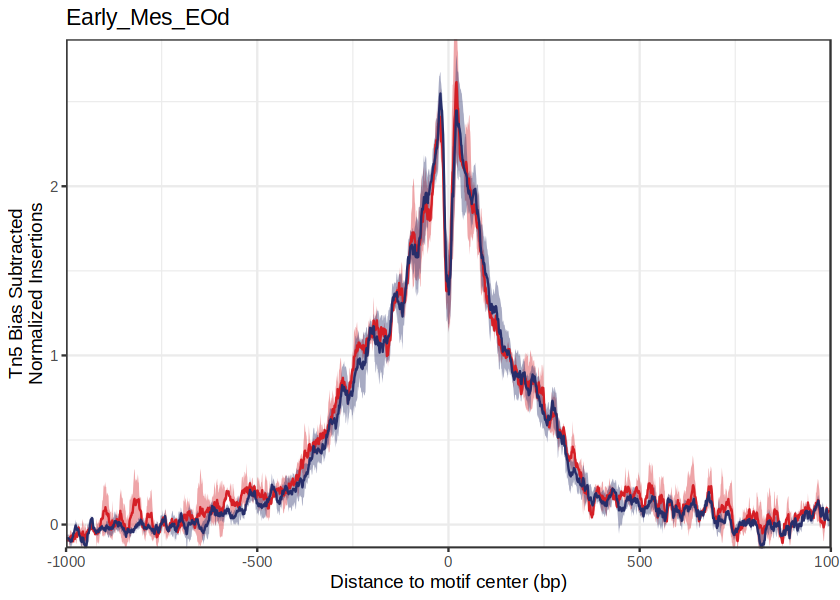

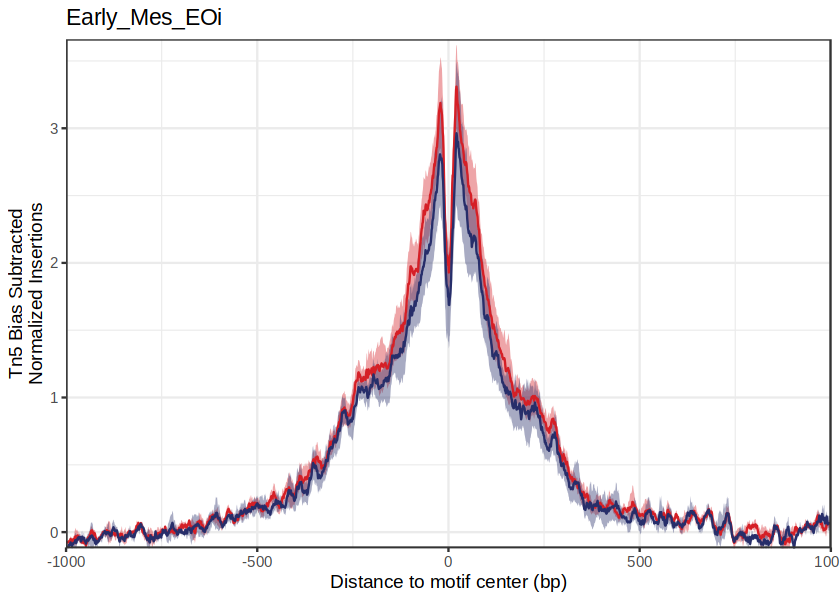

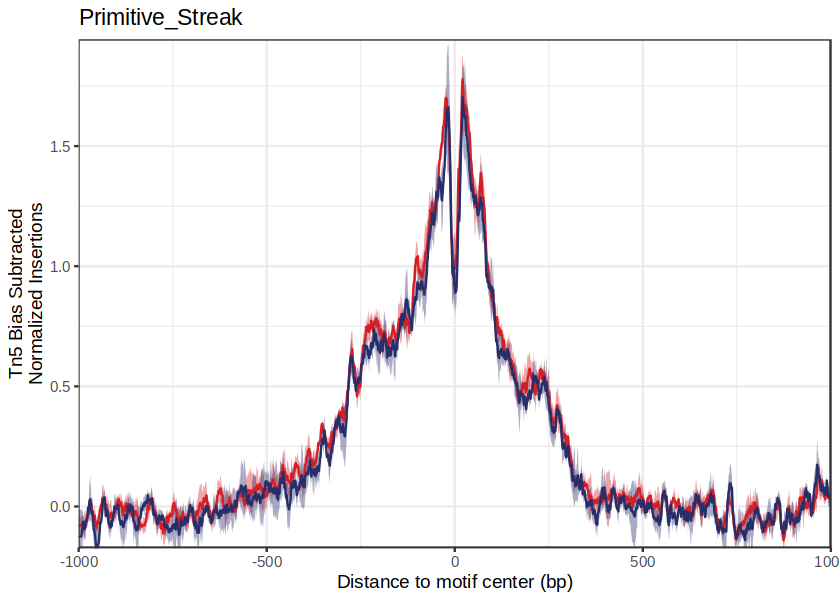

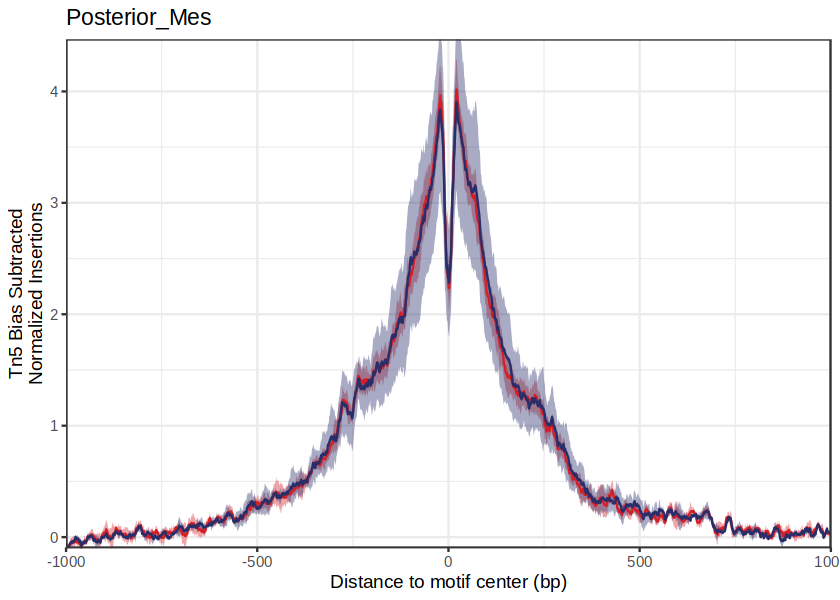

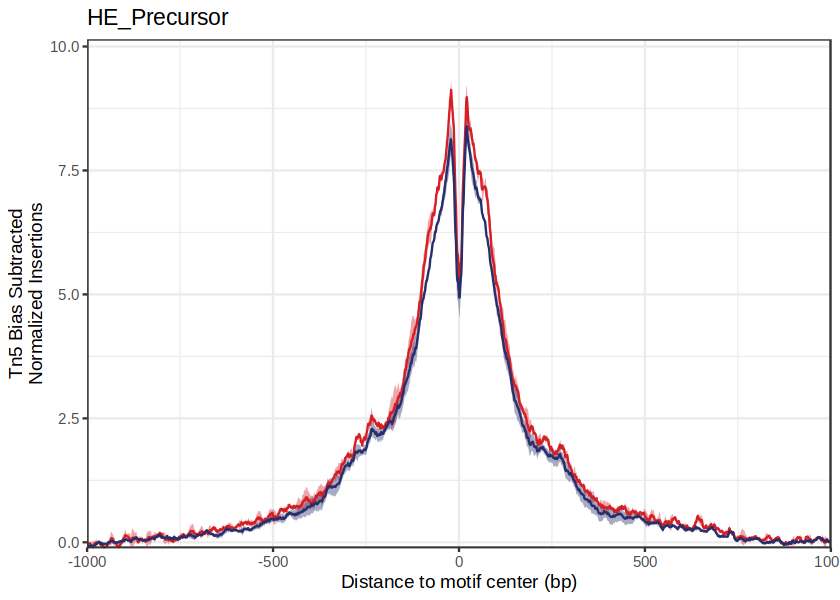

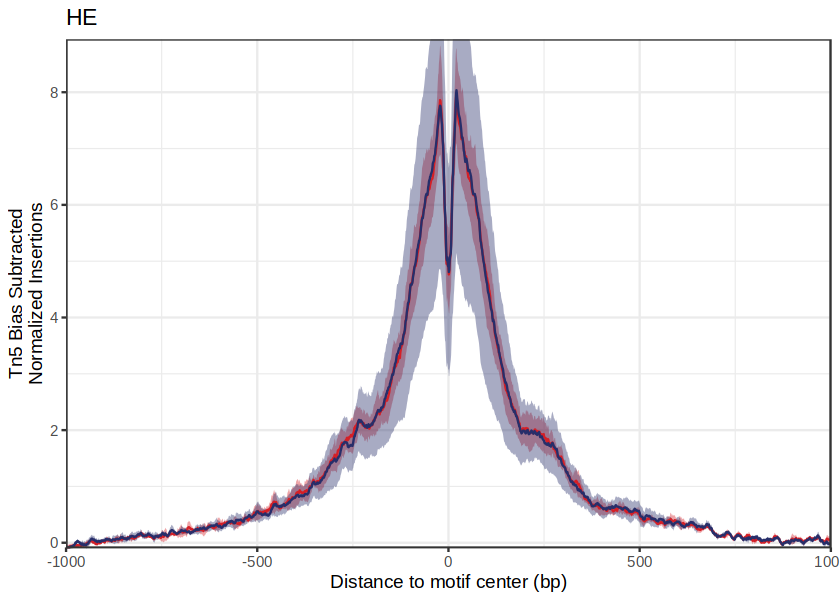

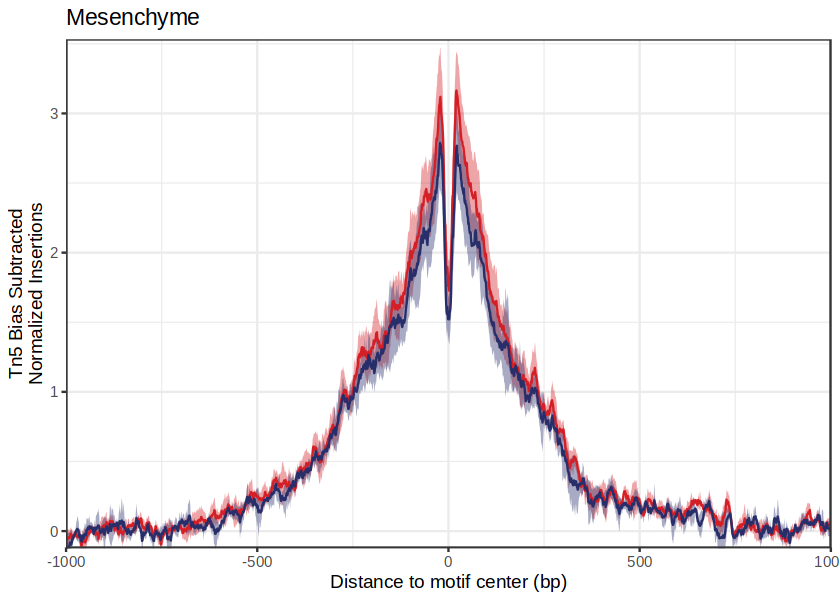

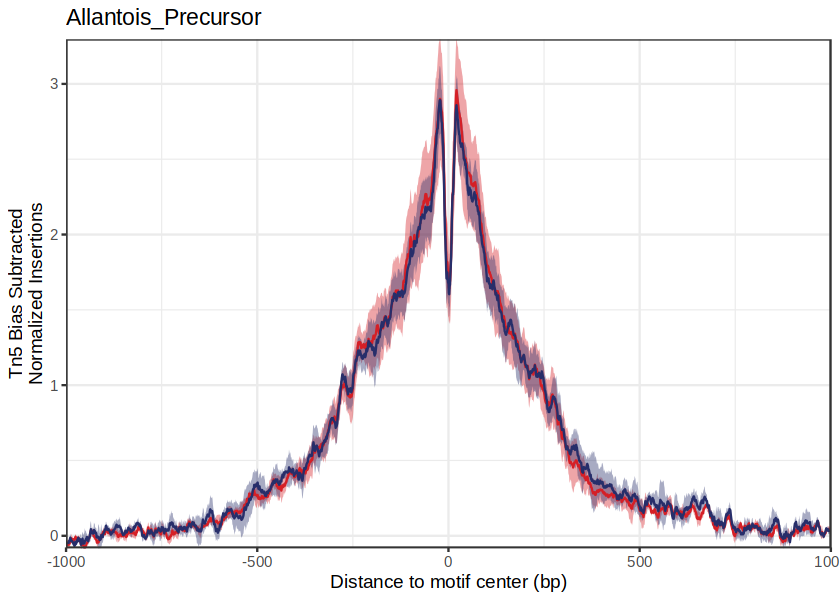

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


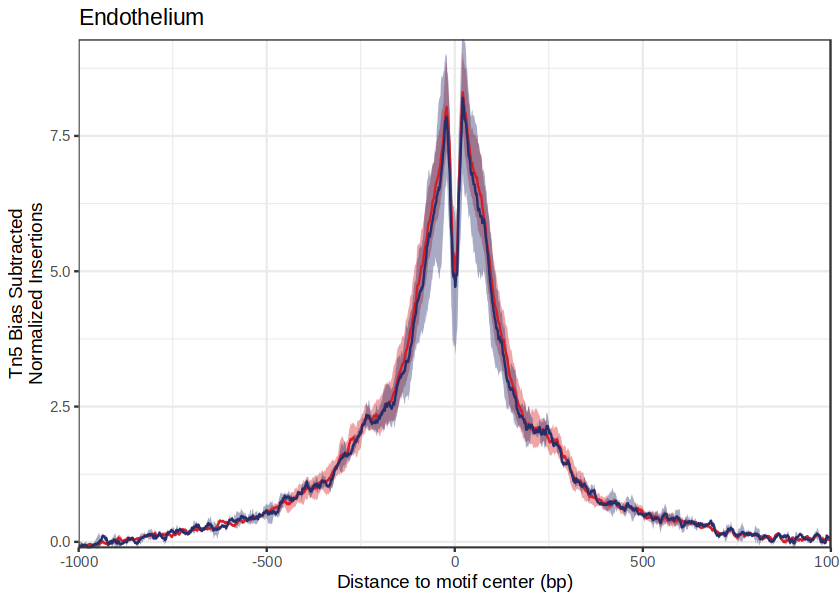

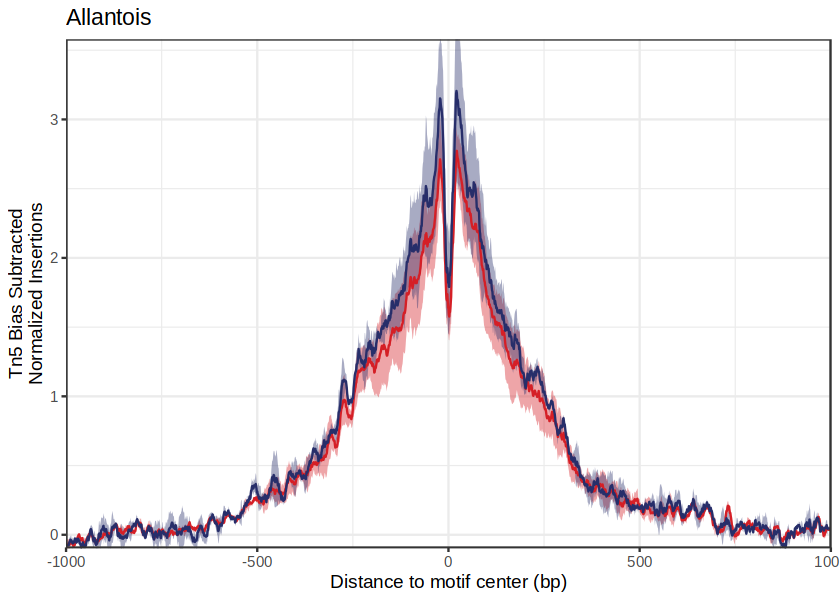

In [451]:
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
# silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_jaspar2020.rds'))
assay(silico_chip, 'matches') = assay(silico_chip, 'VirtualChipScores') > 0.20
matches = silico_chip

TF = 'ETV2'
chip_tmp = as.data.table(as.matrix(assay(silico_chip[,TF], 'matches')), keep.rownames = T) %>% 
    .[ETV2 == TRUE] %>% 
    .[,`:=`(chr = as.factor(rn %>% str_split(':') %>% map_chr(1)),
                start = as.integer(rn %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(1)),
                end = as.integer(rn %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(2)))]
chip.gr = makeGRangesFromDataFrame(chip_tmp[,c('chr', 'start', 'end')])
overlap = findOverlaps(makeGRangesFromDataFrame(chip.gr), motifPositions[['ETV2']])
silico = motifPositions[['ETV2']][subjectHits(overlap)]
silico = GRangesList(silico)
names(silico) = 'ETV2'

seFoot_etv2_silico <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = silico['ETV2'], 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)

celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_silico[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_silico)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_silico))
                             )],
      normMethod = "subtract",
      name = 'ETV2',
      flank = 1000,
      smoothWindow = 15) + 
    ggtitle(i) + theme_bw()
})

ArchR logging to : ArchRLogs/ArchR-getFootprints-3c86391dff6aa3-Date-2024-05-16_Time-18-41-06.log
If there is an issue, please report to github with logFile!

2024-05-16 18:41:06 : Computing Kmer Bias Table, 0.004 mins elapsed.

2024-05-16 18:41:12 : Finished Computing Kmer Tables, 0.097 mins elapsed.

2024-05-16 18:41:12 : Computing Footprints, 0.101 mins elapsed.

2024-05-16 18:41:21 : Computing Footprints Bias, 0.245 mins elapsed.

2024-05-16 18:41:28 : Summarizing Footprints, 0.37 mins elapsed.

ArchR logging to : ArchRLogs/ArchR-getFootprints-3c863957a051ab-Date-2024-05-16_Time-18-41-30.log
If there is an issue, please report to github with logFile!

2024-05-16 18:41:30 : Computing Kmer Bias Table, 0.003 mins elapsed.

2024-05-16 18:41:31 : Finished Computing Kmer Tables, 0.018 mins elapsed.

2024-05-16 18:41:31 : Computing Footprints, 0.022 mins elapsed.

2024-05-16 18:41:43 : Computing Footprints Bias, 0.218 mins elapsed.

2024-05-16 18:41:51 : Summarizing Footprints, 0.356 mins

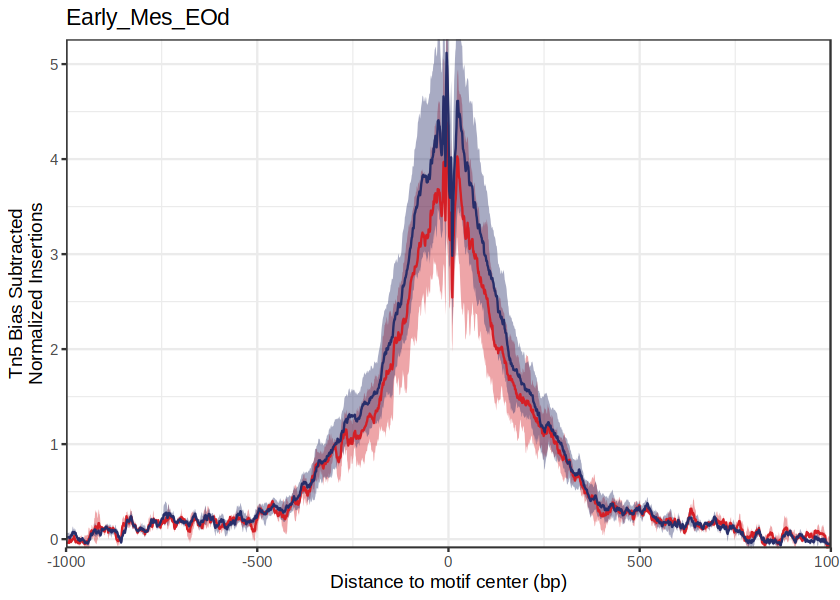

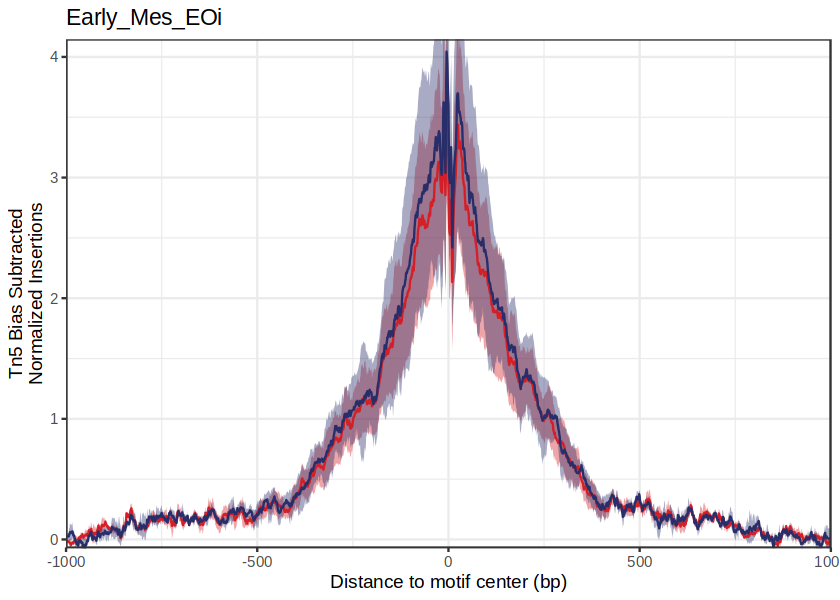

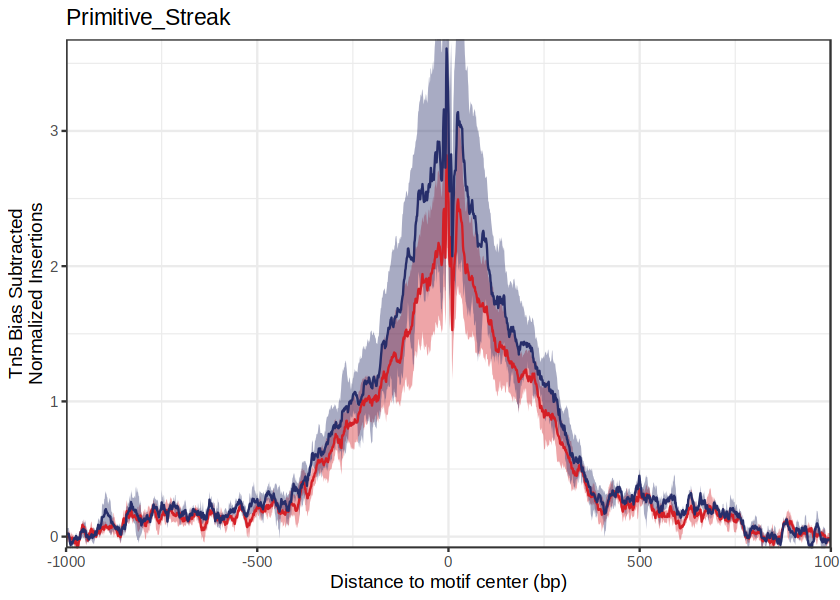

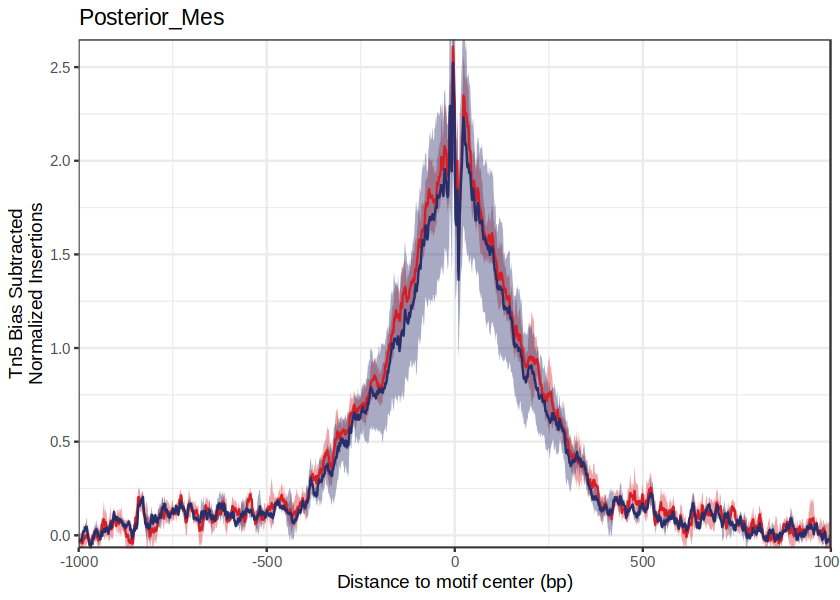

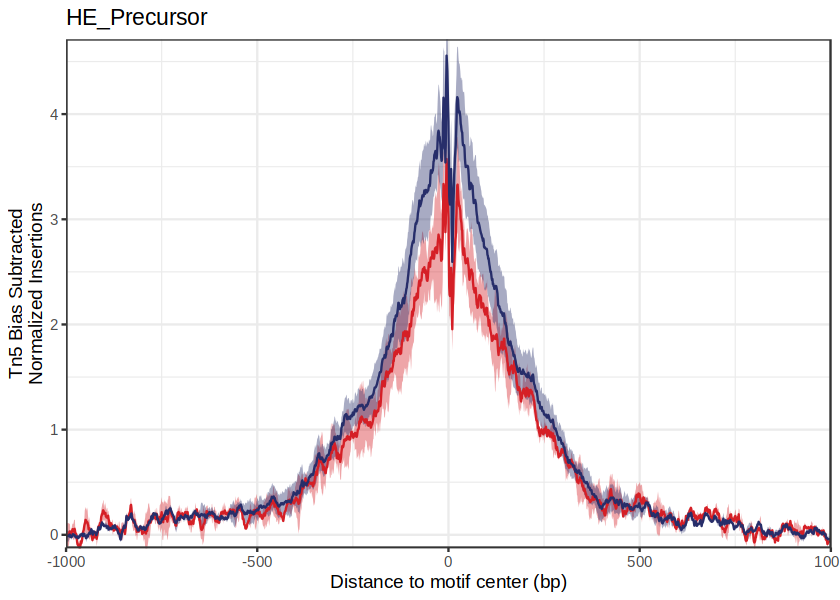

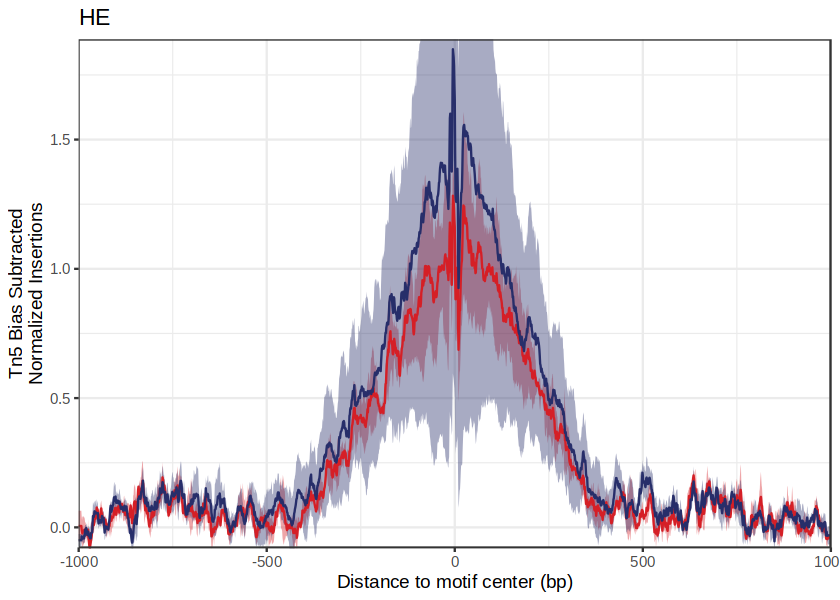

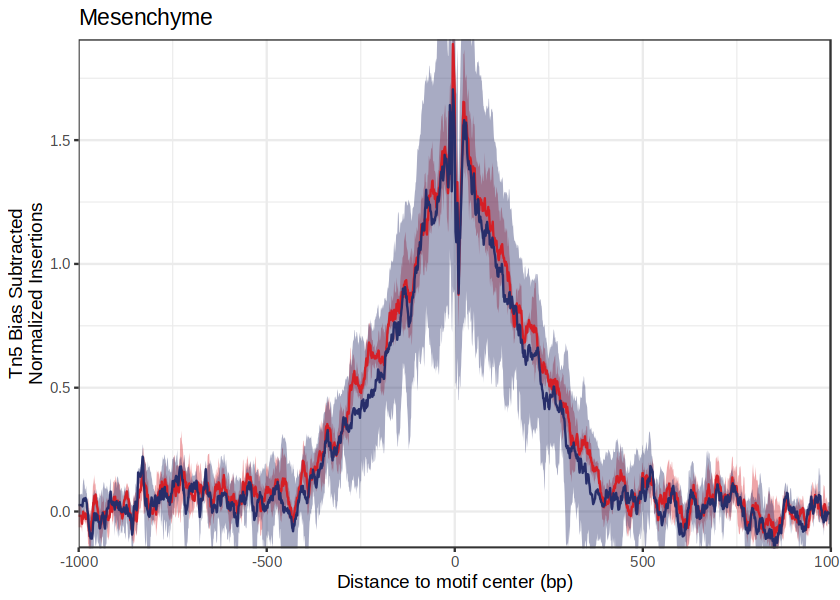

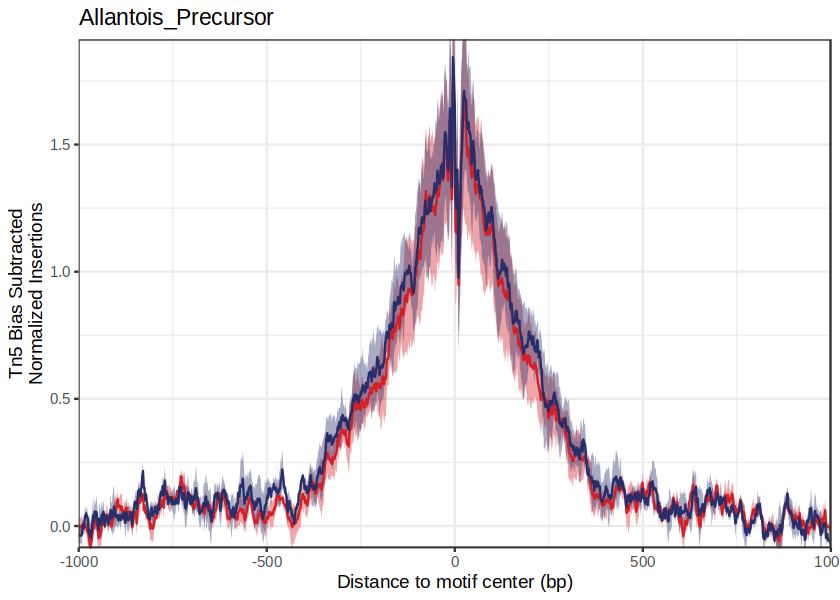

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


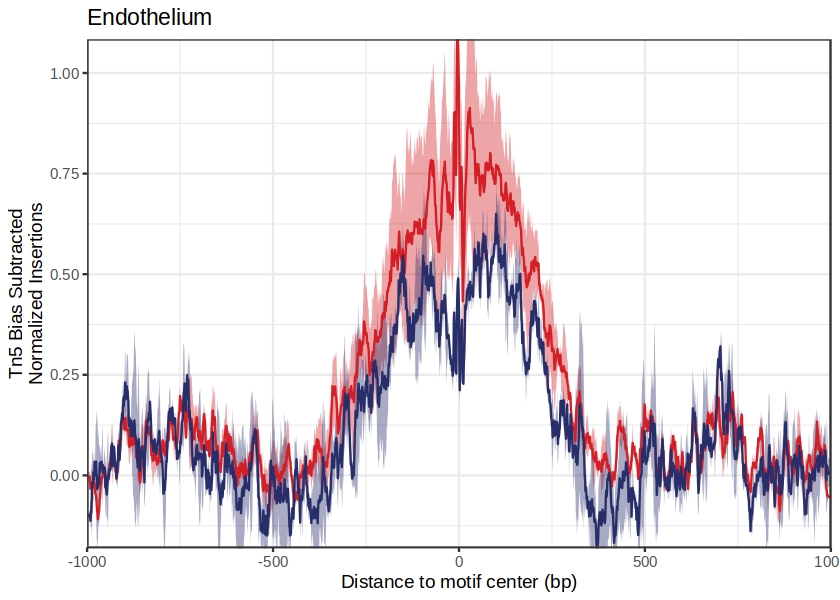

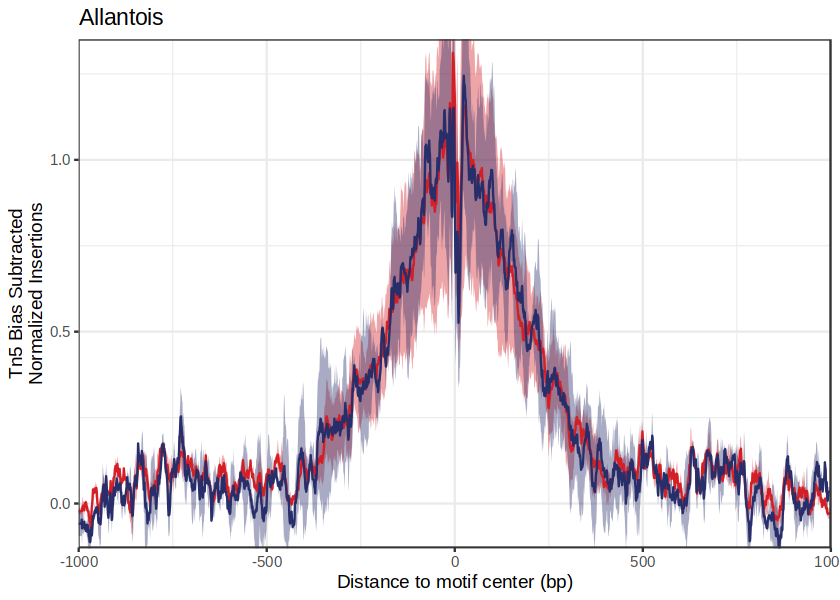

In [454]:
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
# silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_jaspar2020.rds'))
assay(silico_chip, 'matches') = assay(silico_chip, 'VirtualChipScores') > 0.20
matches = silico_chip

TF = 'EOMES'
chip_tmp = as.data.table(as.matrix(assay(silico_chip[,TF], 'matches')), keep.rownames = T) %>% 
    .[EOMES == TRUE] %>% 
    .[,`:=`(chr = as.factor(rn %>% str_split(':') %>% map_chr(1)),
                start = as.integer(rn %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(1)),
                end = as.integer(rn %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(2)))]
chip.gr = makeGRangesFromDataFrame(chip_tmp[,c('chr', 'start', 'end')])
overlap = findOverlaps(makeGRangesFromDataFrame(chip.gr), motifPositions[['EOMES']])
silico = motifPositions[['EOMES']][subjectHits(overlap)]
silico = GRangesList(silico)
names(silico) = 'EOMES'

seFoot_etv2_silico <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = silico['EOMES'], 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)

celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_silico[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_silico)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_silico))
                             )],
      normMethod = "subtract",
      name = 'EOMES',
      flank = 1000,
      smoothWindow = 15) + 
    ggtitle(i) + theme_bw()
})

In [ ]:
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
# silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_jaspar2020.rds'))
assay(silico_chip, 'matches') = assay(silico_chip, 'VirtualChipScores') > 0.20
matches = silico_chip

ArchR logging to : ArchRLogs/ArchR-getFootprints-3c86394e27e9e-Date-2024-05-16_Time-18-51-22.log
If there is an issue, please report to github with logFile!

2024-05-16 18:51:22 : Computing Kmer Bias Table, 0.004 mins elapsed.

2024-05-16 18:51:26 : Finished Computing Kmer Tables, 0.063 mins elapsed.

2024-05-16 18:51:26 : Computing Footprints, 0.066 mins elapsed.

2024-05-16 18:51:38 : Computing Footprints Bias, 0.263 mins elapsed.

2024-05-16 18:51:47 : Summarizing Footprints, 0.412 mins elapsed.



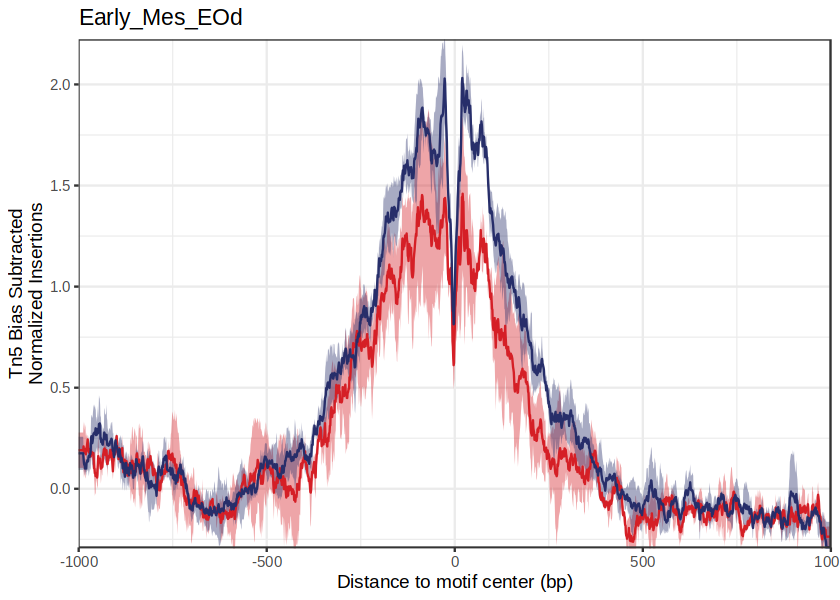

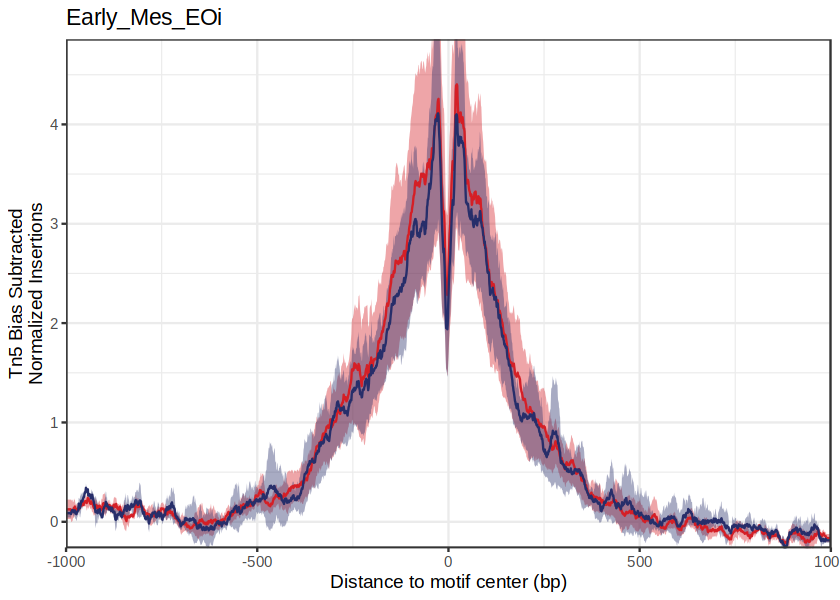

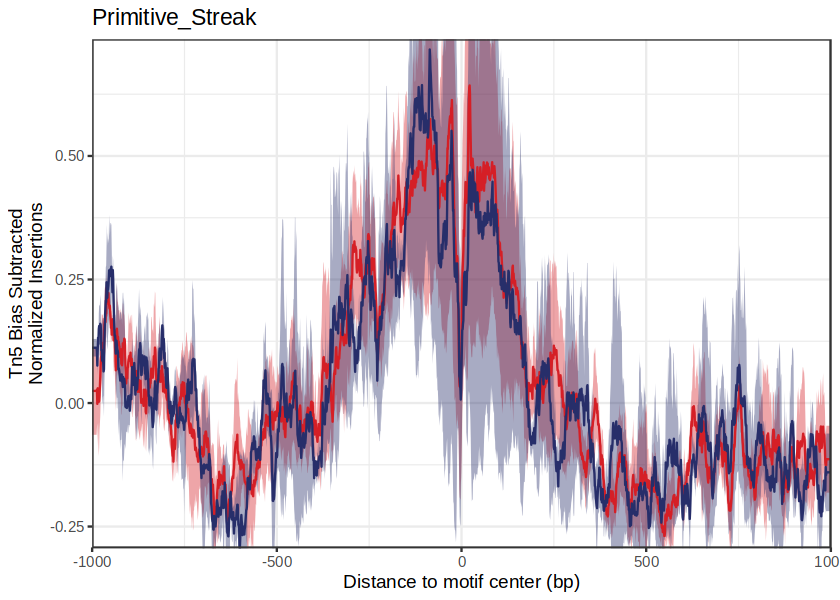

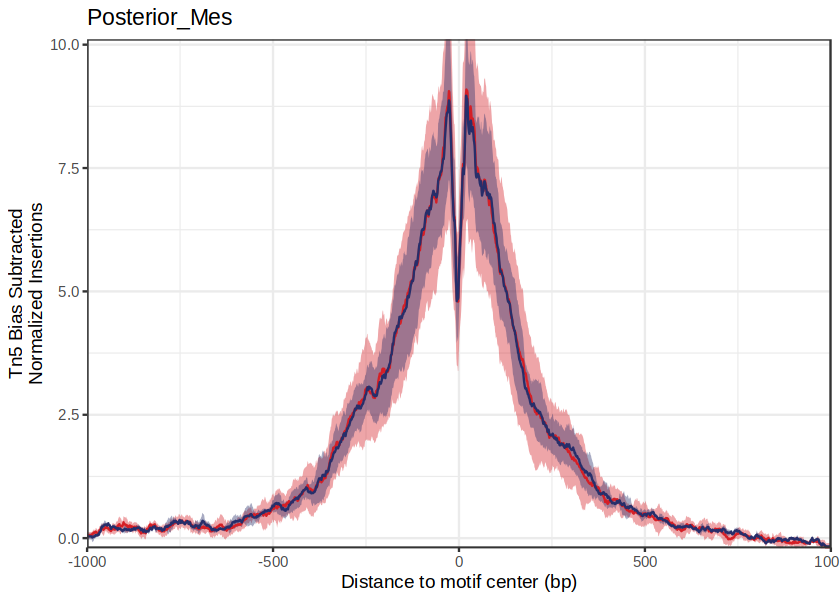

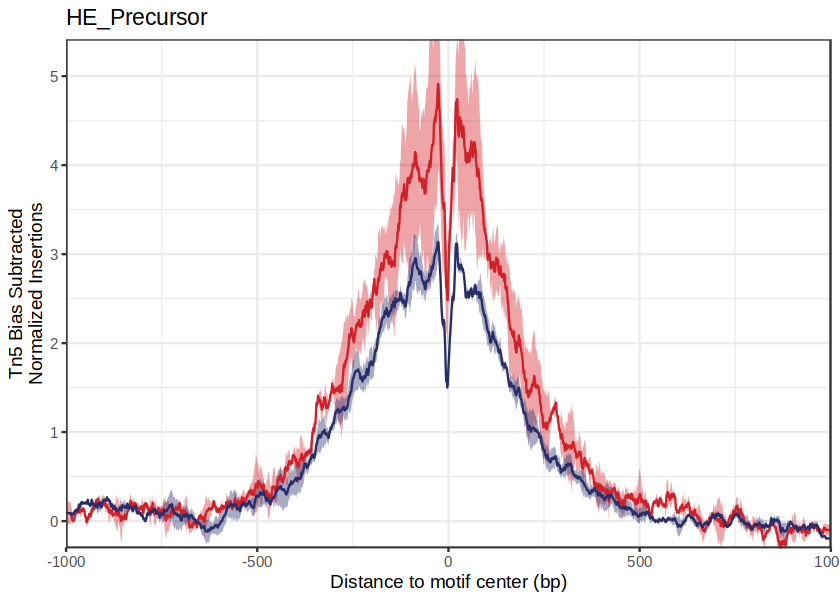

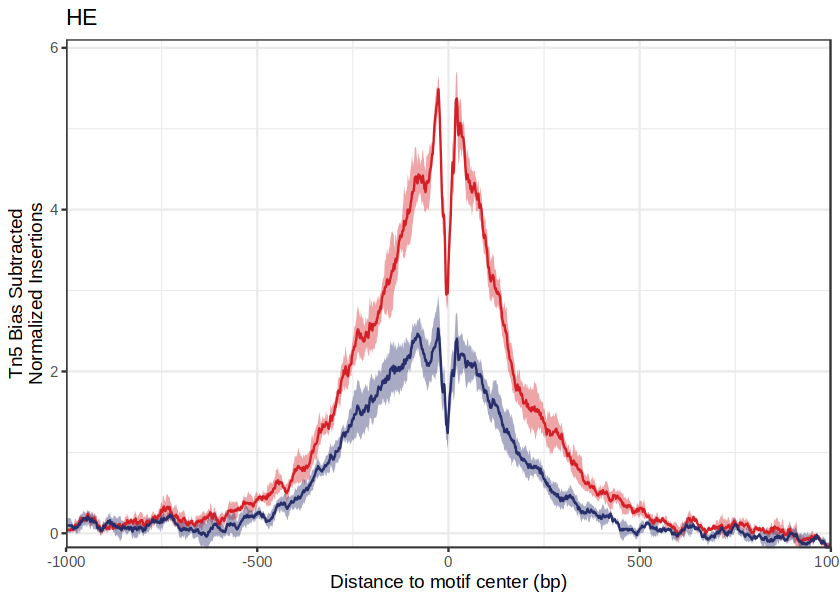

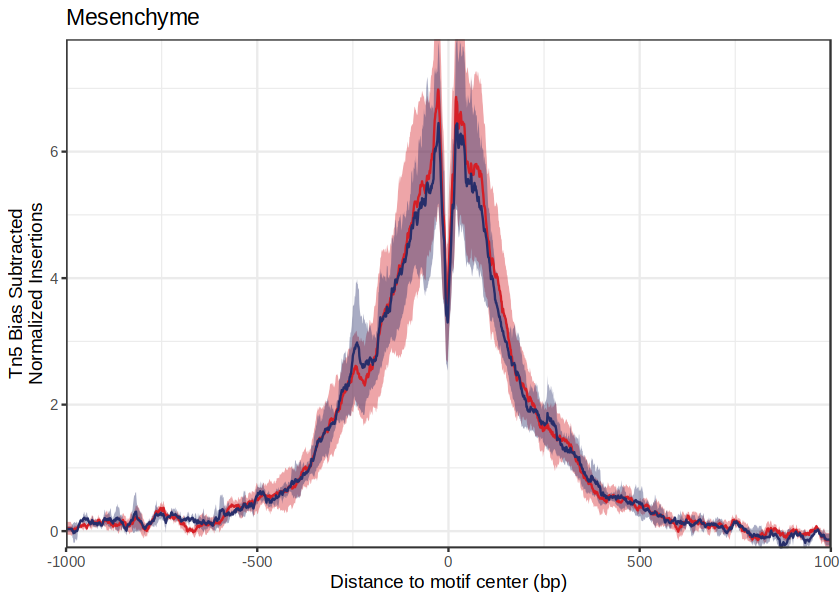

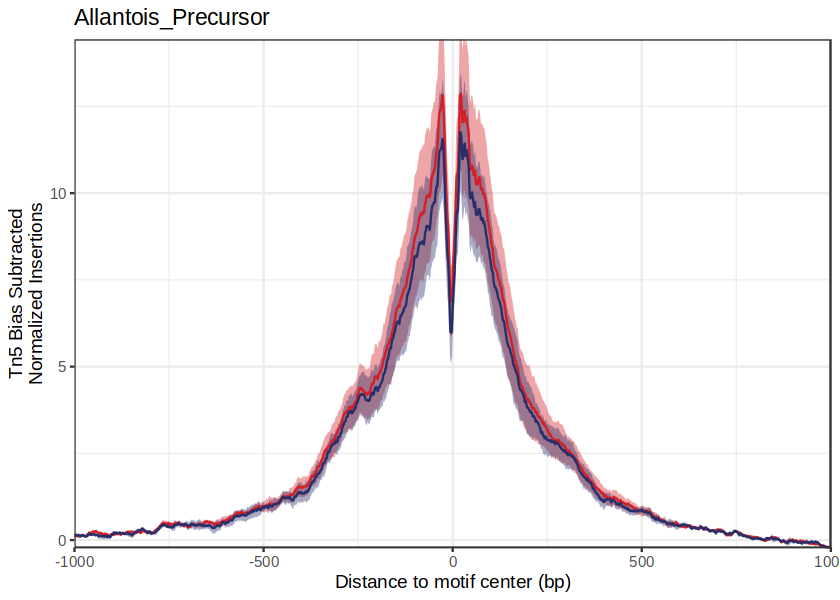

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


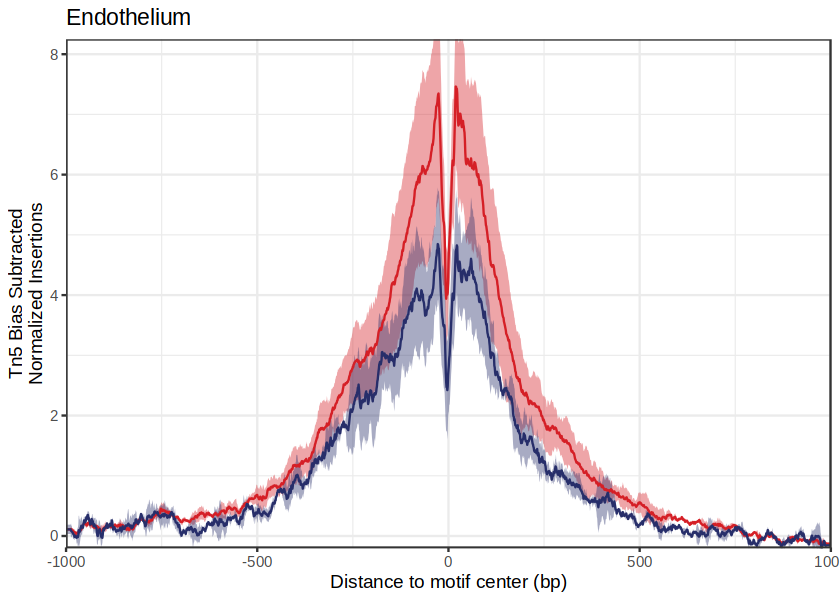

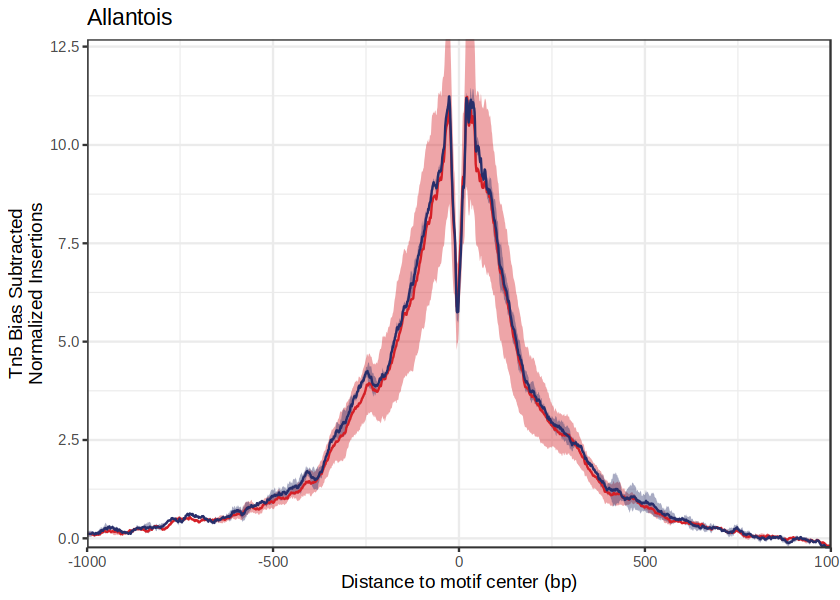

In [467]:
TF = 'HOXA11'
chip_tmp = as.data.table(as.matrix(assay(silico_chip[,TF], 'matches')), keep.rownames = T) %>% 
    setnames(c('rn', 'gene')) %>%
    .[gene == TRUE] %>% 
    .[,`:=`(chr = as.factor(rn %>% str_split(':') %>% map_chr(1)),
                start = as.integer(rn %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(1)),
                end = as.integer(rn %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(2)))]
chip.gr = makeGRangesFromDataFrame(chip_tmp[,c('chr', 'start', 'end')])
overlap = findOverlaps(makeGRangesFromDataFrame(chip.gr), motifPositions[[TF]])
silico = motifPositions[[TF]][subjectHits(overlap)]
silico = GRangesList(silico)
names(silico) = TF

seFoot_etv2_silico <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = silico, 
    groupBy = "celltypev2_genotype", 
    flank = 1000,
)

celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_silico[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_silico)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_silico))
                             )],
      normMethod = "subtract",
      name = TF,
      flank = 1000,
      smoothWindow = 25) + 
    ggtitle(i) + theme_bw()
})

In [ ]:
TF = 'TAL1'
chip_tmp = as.data.table(as.matrix(assay(silico_chip[,TF], 'matches')), keep.rownames = T) %>% 
    setnames(c('rn', 'gene')) %>%
    .[gene == TRUE] %>% 
    .[,`:=`(chr = as.factor(rn %>% str_split(':') %>% map_chr(1)),
                start = as.integer(rn %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(1)),
                end = as.integer(rn %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(2)))]
chip.gr = makeGRangesFromDataFrame(chip_tmp[,c('chr', 'start', 'end')])
overlap = findOverlaps(makeGRangesFromDataFrame(chip.gr), motifPositions[[TF]])
silico = motifPositions[[TF]][subjectHits(overlap)]
silico = GRangesList(silico)
names(silico) = TF

seFoot_etv2_silico <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = silico, 
    groupBy = "celltypev2_genotype", 
    flank = 300,
)

celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = seFoot_etv2_silico[,c(grep(paste0(i, '-WT'), colnames(seFoot_etv2_silico)),
                             grep(paste0(i, '-KO'), colnames(seFoot_etv2_silico))
                             )],
      normMethod = "subtract",
      name = TF,
      flank = 300,
      smoothWindow = 25) + 
    ggtitle(i) + theme_bw()
})

# Zfp462

# ChIP-peak centres Zfp462

In [6]:
zfp462 = fread('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/ChIP/zfp462/Ramesh/ZFP462_BioChIp_summits.bed')

Warning message:
“Using `bins = 30` by default. Pick better value with the argument `bins`.”


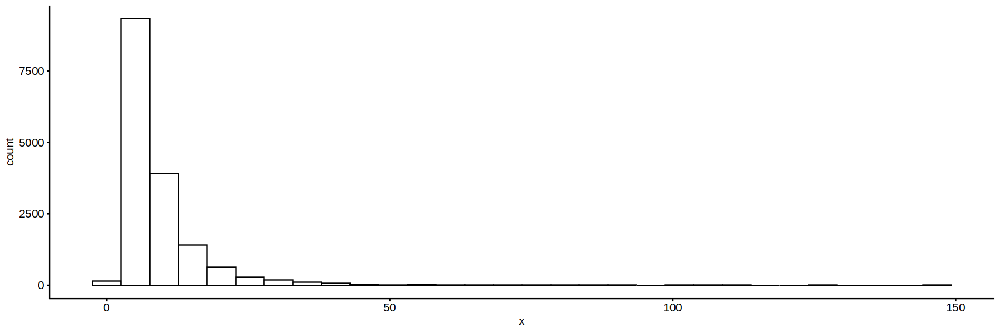

In [7]:
options(repr.plot.width=15, repr.plot.height=5)
gghistogram(zfp462[V5<150]$V5)

In [16]:
nrow(zfp462[order(-V5)])

[1] 16264

ArchR logging to : ArchRLogs/ArchR-getFootprints-6e5687897702f-Date-2024-05-17_Time-14-59-02.log
If there is an issue, please report to github with logFile!

2024-05-17 14:59:03 : Computing Kmer Bias Table, 0.003 mins elapsed.

2024-05-17 14:59:03 : Finished Computing Kmer Tables, 0.008 mins elapsed.

2024-05-17 14:59:03 : Computing Footprints, 0.012 mins elapsed.

2024-05-17 14:59:18 : Computing Footprints Bias, 0.263 mins elapsed.

2024-05-17 14:59:25 : Summarizing Footprints, 0.385 mins elapsed.



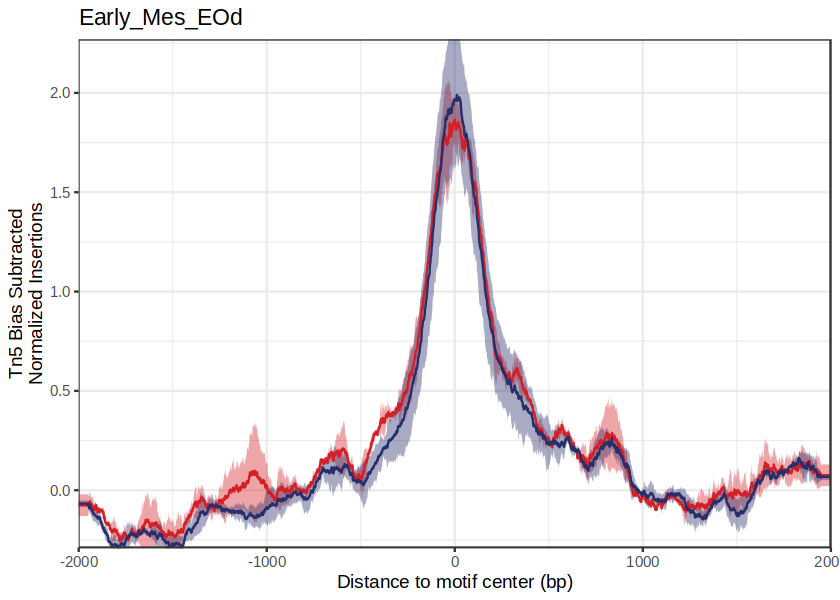

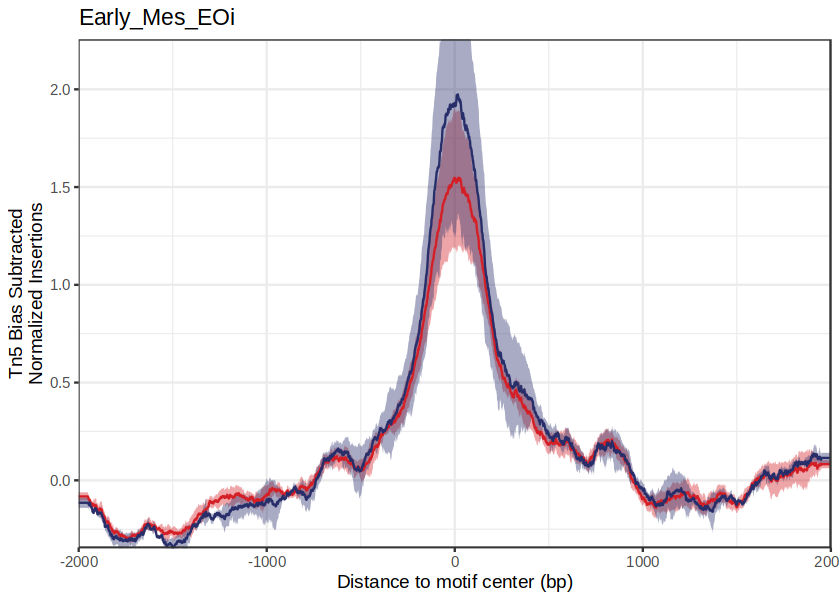

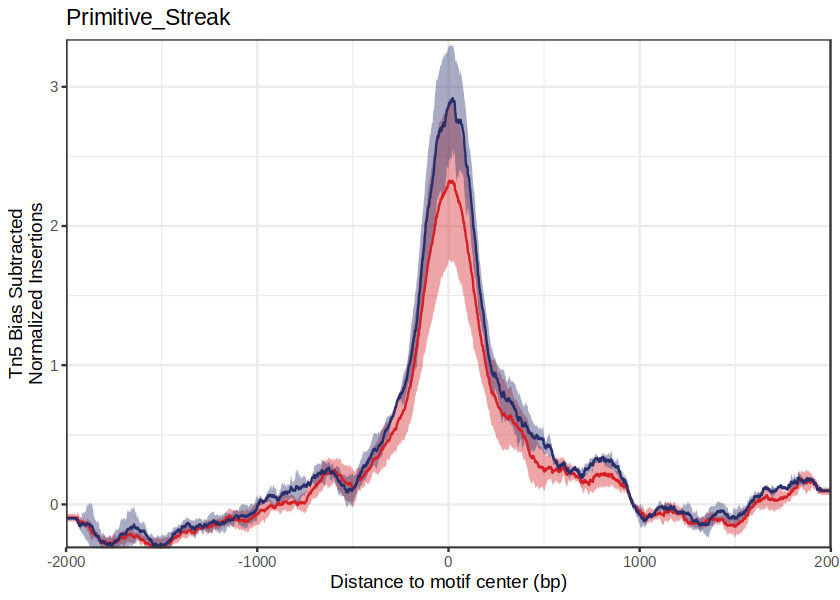

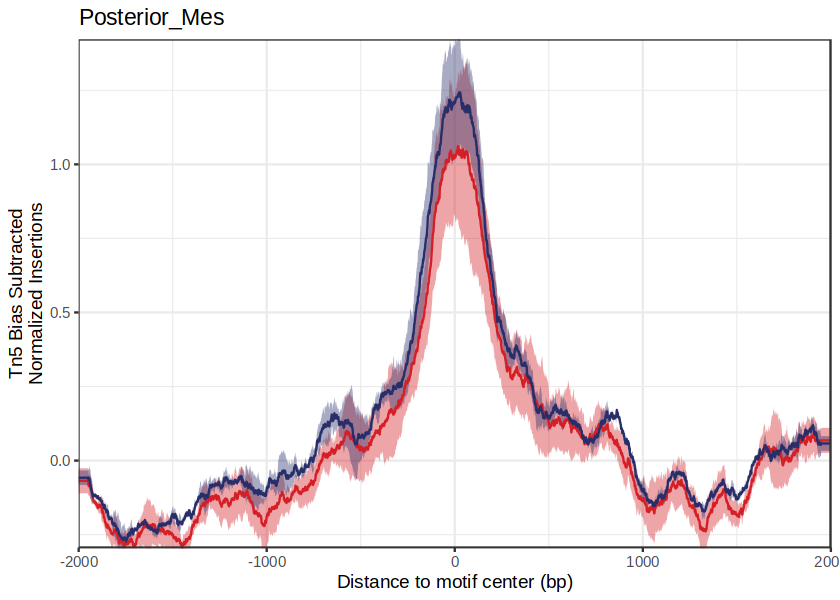

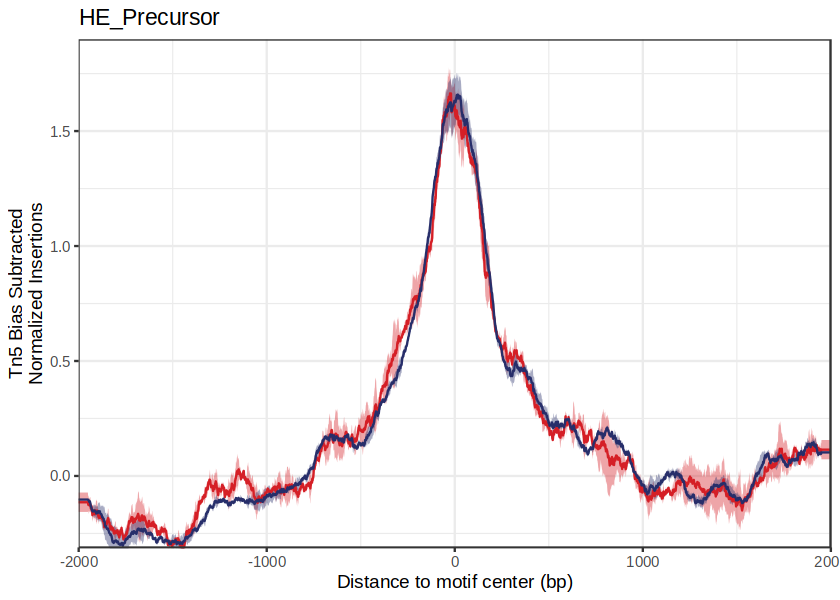

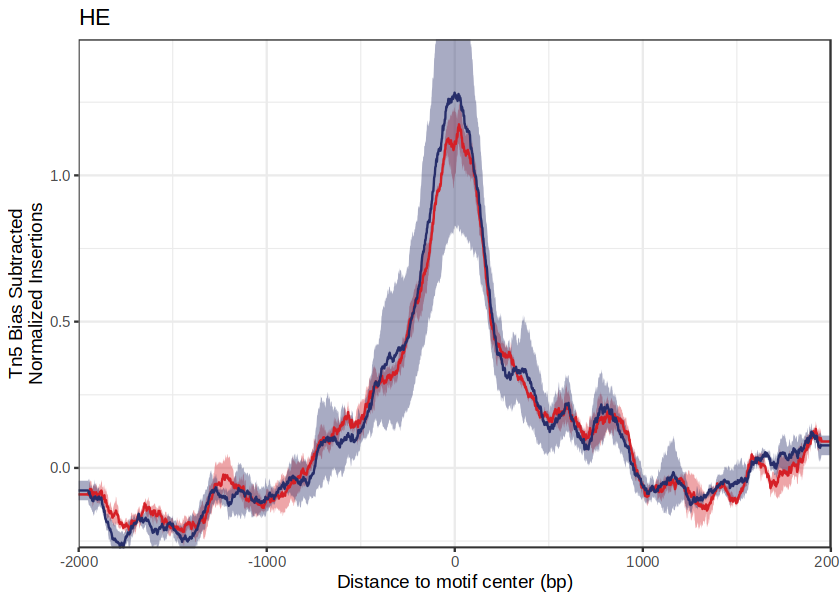

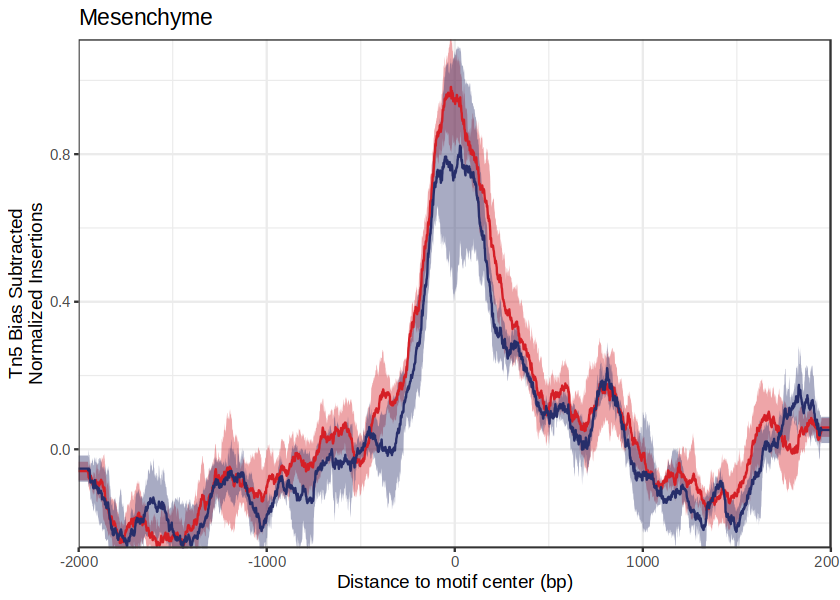

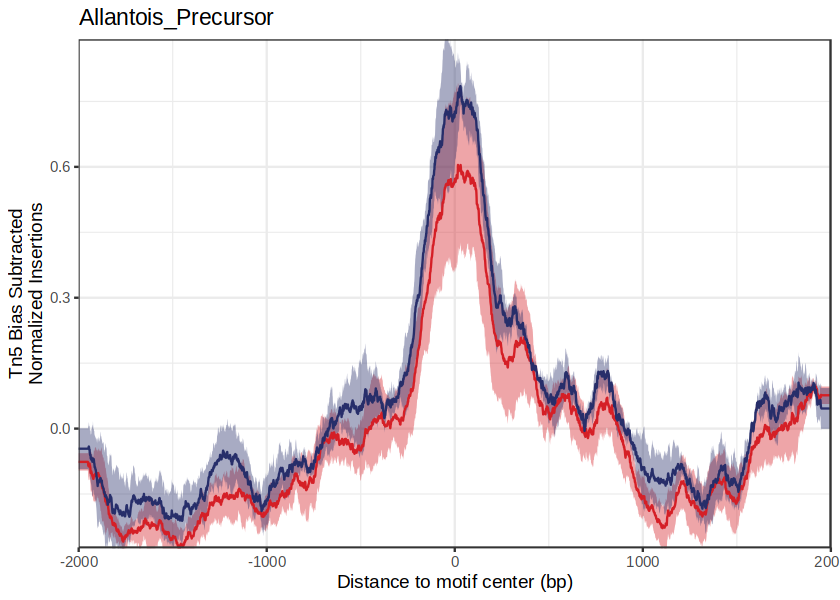

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]


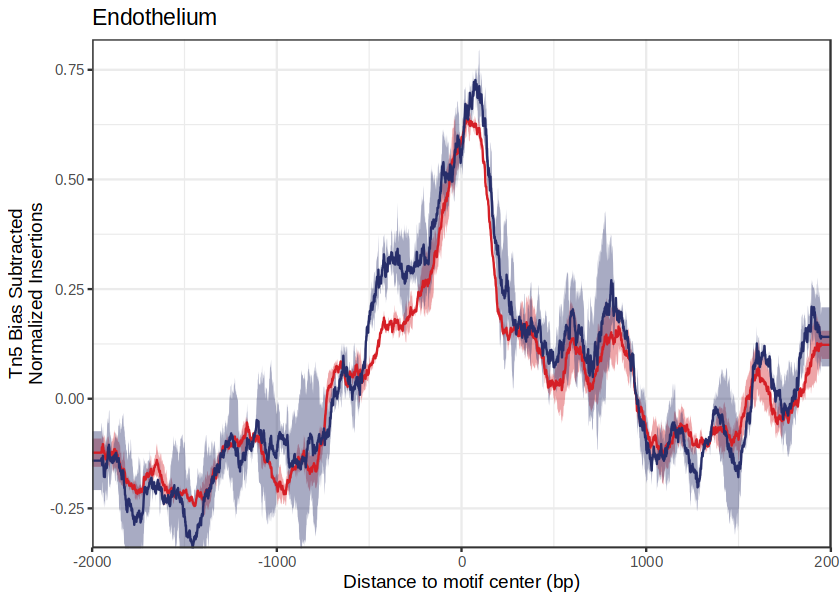

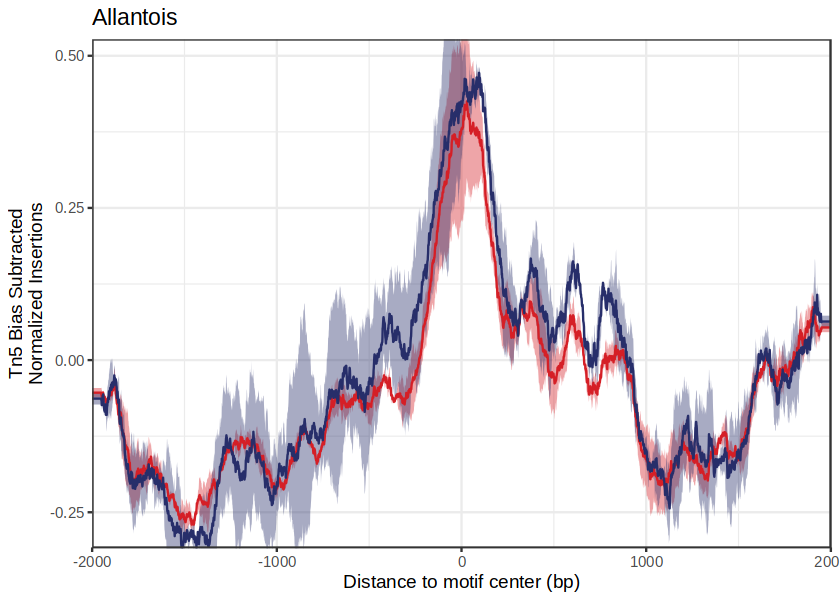

In [17]:
zfp462.gr = makeGRangesFromDataFrame(zfp462[order(-V5)][V5>0][,c(1,2,3)] %>% 
                                         setnames(c('chr', 'start', 'end')) %>% 
                                        .[chr %in% paste0('chr', c(1:19, 'X'))] %>% head(1000))
zfp462.gr = GRangesList(zfp462.gr)
names(zfp462.gr) = 'Zfp462'

zfp462_chip <- getFootprints(
    ArchRProj = ArchRProject, 
    positions = zfp462.gr, 
    groupBy = "celltypev2_genotype", 
    flank = 2000,
)

celltypes = c('Early_Mes_EOd','Early_Mes_EOi','Primitive_Streak','Posterior_Mes','HE_Precursor','HE','Mesenchyme','Allantois_Precursor','Endothelium','Allantois')
lapply(celltypes, function(i){
    options(repr.plot.width = 7, repr.plot.height = 5)
    p1 = footprint_manual(
      seFoot = zfp462_chip[,c(grep(paste0(i, '-WT'), colnames(zfp462_chip)),
                             grep(paste0(i, '-KO'), colnames(zfp462_chip))
                             )],
      normMethod = "subtract",
      name = 'Zfp462',
      flank = 2000,
      smoothWindow = 100) + 
    ggtitle(i) + theme_bw()
})